# Trading Strategy

Trading Strategy 1 Implementation and Backtest

author: Maris

## Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
import datetime as dt
import os
import seaborn as sns
import random 
import statsmodels.api as sm
import tensorflow as tf
import keras

In [2]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, TimeSeriesSplit
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score, confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn import ensemble
from keras.models import Sequential
from keras.layers import Dense, LSTM, Conv1D, Flatten, GRU, SimpleRNN

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
sns.set_theme()
sns.set_palette("tab20")
sns.set_style("darkgrid", rc = {"grid.color": "white"})
c10 = sns.color_palette("tab10").as_hex()[:]
c20 = sns.color_palette("tab20").as_hex()[:]

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
os.chdir('/Users/maris/Documents/FE800')

In [7]:
np.random.seed(10)

## Import Data

In [9]:
df_characteristics = pd.read_pickle("df_characteristics.pkl")
df_characteristics = df_characteristics.drop(["Notional", "Par", "Liquidity_Score"], axis = 1)
df_characteristics.head()

,Name,Cusip,Maturity,TTM,Coupon,Weight,Amount_Issued,Industry,Location,Accrual_Date,Effective_Date,Moody_Rating,S&P_Rating,Fitch_Rating,TTM_Range,TFI,Company,Ticker,Sector,Sector Ticker
0,PFIZER INVESTMENT ENTERPRISES PTE,716973AG7,2053-05-19,29.4438,5.30,0.30,6000000000,Consumer Non-Cyclical,United States,2023-05-19,2023-05-19,A1,A+,A,20+ Years,0.5781,Pfizer,PFE,Health Care,XLF
1,ANHEUSER-BUSCH COMPANIES LLC,03522AAJ9,2046-02-01,22.1452,4.90,0.28,9518964000,Consumer Non-Cyclical,Belgium,2019-02-01,2019-05-13,A3,A-,None,20+ Years,4.5973,Anheuser-Busch,BUD,Consumer Staples,XLV
2,GOLDMAN SACHS GROUP INC/THE,38141GFD1,2037-10-01,13.8027,6.75,0.25,5545000000,Banking,United States,2007-10-03,2007-10-03,Baa2,BBB,BBB+,10-15 Years,16.2137,Goldman Sachs,GS,Financials,XLK
3,CVS HEALTH CORP,126650CZ1,2048-03-25,24.2904,5.05,0.22,8000000000,Consumer Non-Cyclical,United States,2018-03-09,2018-03-09,Baa2,BBB,None,20+ Years,5.7753,Cvs Health,CVS,Health Care,XLF
4,T-MOBILE USA INC,87264ABF1,2030-04-15,6.3342,3.88,0.21,7000000000,Communications,United States,2021-04-15,2021-05-21,Baa2,BBB,BBB+,5-7 Years,2.5726,T-Mobile Usa,TMUS,Communications,XLY


In [39]:
df = pd.read_pickle("factor_df.pkl")
df.head()

Return      Price    volume    Trades       TTM  \
cusip     trd_dt                                                          
00206RBH4 2018-07-03  0.008850  86.513796 -0.785507 -0.940150  1.728678   
          2018-07-05  0.003406  86.808383 -0.573559  1.089431  1.724879   
          2018-07-06  0.004973  87.240021 -0.637707 -0.462601  1.722980   
          2018-07-09 -0.001021  87.150785 -0.115591 -0.940150  1.717283   
          2018-07-10  0.002972  87.409758 -0.519514 -0.462601  1.715383   

                      Stock_Return  Stock_Volume  ETF_Return        PV  \
cusip     trd_dt                                                         
00206RBH4 2018-07-03      0.015523     -0.171355   -0.005025  0.004849   
          2018-07-05     -0.003363     -0.086349    0.004959  0.001749   
          2018-07-06      0.002454      0.232636    0.007858  0.001668   
          2018-07-09      0.004123      0.357721    0.011967 -0.002931   
          2018-07-10      0.010887      0.103056    0.002150 -0.001502   

                           YTM  Duration      DV01  Convexity  
cusip     trd_dt                                               
00206RBH4 2018-07-03  0.902753  1.131115  0.498639   1.391850  
          2018-07-05  0.878724  1.132837  0.478094   1.392504  
          2018-07-06  0.841574  1.137649  0.447232   1.395884  
          2018-07-09  0.852737  1.113003  0.461360   1.375882  
          2018-07-10  0.830979  1.102112  0.447388   1.367151

In [206]:
bad_cusips = list(pd.read_csv("bad_cusips.csv")['0'])
bad_cusips = bad_cusips + ["902613AY4", "961214DK6", "25389JAR7", "06051GGA1", "780097BG5"]
bad_cusips

['92976GAJ0', '902613AY4', '961214DK6', '25389JAR7', '06051GGA1', '780097BG5']

In [40]:
df.shape

(945768, 13)

## Monthly Data

In [41]:
df["Date"] = df.index.droplevel(0)
months = list(df.groupby([df.index.get_level_values("cusip"), 
                 df.index.get_level_values("trd_dt").year, 
                 df.index.get_level_values("trd_dt").month]).first()["Date"].unique())
len(months)

60

In [42]:
df_monthly = df[df.index.droplevel(0).isin(months)].drop(["Date"], axis = 1)
df_monthly.head()

Return      Price    volume    Trades       TTM  \
cusip     trd_dt                                                          
00206RBH4 2018-07-03  0.008850  86.513796 -0.785507 -0.940150  1.728678   
          2018-08-01 -0.010840  86.046713  0.847809  0.373109  1.673602   
          2018-09-04 -0.005673  85.679940 -0.601991  0.373109  1.609030   
          2018-10-01 -0.002595  86.955960 -0.685407 -0.343214  1.557753   
          2018-11-01 -0.003902  82.192560 -0.202297  0.373109  1.498879   

                      Stock_Return  Stock_Volume  ETF_Return        PV  \
cusip     trd_dt                                                         
00206RBH4 2018-07-03      0.015523     -0.171355   -0.005025  0.004849   
          2018-08-01     -0.002190     -0.310778   -0.004943 -0.007722   
          2018-09-04     -0.002505     -0.652902    0.001881 -0.007465   
          2018-10-01     -0.002680     -0.798964   -0.003071 -0.007425   
          2018-11-01     -0.006193     -0.088531    0.020403  0.001611   

                           YTM  Duration      DV01  Convexity  
cusip     trd_dt                                               
00206RBH4 2018-07-03  0.902753  1.131115  0.498639   1.391850  
          2018-08-01  0.977241  0.910430  0.601695   1.212758  
          2018-09-04  1.049633  0.854587  0.644255   1.159178  
          2018-10-01  0.964149  0.639557  0.629295   0.987528  
          2018-11-01  1.453377  0.435551  1.006652   0.824552

In [44]:
macro_factors = pd.read_pickle("macro_factors.pkl")
macro_factors_monthly = macro_factors[["EFFR", "SPY", "LQD"]].pct_change().dropna(how = "all", axis = 0)
macro_factors_monthly = macro_factors_monthly[macro_factors_monthly.index.isin(months)]
macro_factors_monthly.head()

,EFFR,SPY,LQD
2018-07-03,0.000000,-0.003531,0.003677
2018-08-01,0.000000,-0.001671,-0.006479
2018-09-04,0.005236,-0.001722,-0.004851
2018-10-01,0.000000,0.003474,-0.004438
2018-11-01,0.000000,0.010642,-0.000267


In [61]:
treasuries = pd.read_pickle("macro_factors.pkl").pct_change().dropna(how = "all", axis = 0)
treasuries = treasuries.drop(["Lower_Target", "Upper_Target", "EFFR", "SPY", "LQD"], axis = 1)
treasuries.columns = [1, 2, 3, 5, 7, 10, 30]
treasuries = treasuries[treasuries.index.isin(months)]
len(treasuries)

60

In [47]:
daily_prices = df[["Price"]].unstack("cusip").loc[pd.Timestamp("2022-07-01"):]
daily_prices.columns = daily_prices.columns.droplevel(0)
daily_prices.head()

cusip,00206RBH4,00206RBK7,00206RCP5,00206RCQ3,00206RCU4,00206RDJ8,00206RDK5,00206RDQ2,00206RDR0,002824BF6,002824BG4,002824BH2,00287YAM1,00287YAR0,00287YAS8,00287YAV1,00287YAW9,00440EAW7,00774MAB1,00817YAF5,00817YAZ1,013716AU9,02209SAM5,02209SAR4,02209SAV5,023135AP1,023135AQ9,023135BC9,023135BF2,023135BJ4,023135BM7,025816BF5,026874DF1,026874DL8,03027XAK6,03027XAP5,03040WAD7,03040WAR6,03073EAP0,031162BZ2,031162CD0,031162CF5,031162CQ1,032654AN5,03523TBF4,03523TBT4,035240AG5,035240AL4,035240AM2,035240AN0,035240AP5,035242AN6,03524BAF3,036752AB9,036752AD5,036752AG8,036752AH6,037833AL4,037833AT7,037833BA7,037833BH2,037833BW9,037833BX7,037833CD0,037833CH1,037833CJ7,037833CR9,037833CX6,037833DB3,037833DD9,037833DG2,037833DK3,038222AL9,038222AM7,04351LAB6,046353AD0,046353AG3,046353AM0,046353AN8,04686JAA9,049560AM7,055451AR9,055451AV0,05565QDH8,05565QDN5,057224AZ0,05723KAE0,05723KAF7,05964HAB1,05964HAF2,05964HAJ4,06050TJZ6,06051GEN5,06051GFC8,06051GFL8,06051GGA1,06051GGC7,06051GGF0,06051GGG8,06051GGL7,06051GGM5,06051GGR4,06051GHA0,06051GHD4,06051GHG7,06406RAD9,06406RAF4,06406RAH0,06406YAA0,06738EAJ4,06738EAU9,06738EAV7,06738EAW5,06738EBD6,06849RAG7,06849RAK8,06849UAD7,07330MAA5,075887BG3,075887BW8,075887BX6,0778FPAA7,084659AF8,084659AP6,084664BL4,084670BK3,09062XAD5,10112RAY0,10922NAC7,10922NAF0,111021AE1,11134LAH2,11134LAR0,11271LAB8,11271LAC6,12189LAA9,12189LAN1,12189LAS0,12189LAU5,12189LAW1,12189LAZ4,12189LBB6,12189LBC4,12527GAD5,12527GAE3,12527GAF0,12572QAF2,126408GY3,126408HF3,126408HH9,126408HJ5,126408HK2,126650CD0,126650CN8,126650CX6,126650CY4,126650CZ1,134429BG3,136385AL5,136385AX9,136385AY7,13645RAX2,14040HBN4,14040HBW4,14149YBJ6,149123BS9,149123CB5,15135UAF6,15135UAR0,161175AZ7,161175BA1,161175BL7,161175BM5,161175BN3,16412XAG0,171232AQ4,17275RAD4,17275RAF9,17275RBL5,172967BL4,172967EW7,172967FX4,172967HA2,172967HS3,172967JC6,172967JU6,172967KA8,172967KR1,172967KU4,172967KY6,172967LD1,172967LJ8,172967LP4,172967LS8,172967LU3,172967LW9,20030NAC5,20030NAF8,20030NBH3,20030NBM2,20030NBP5,20030NBQ3,20030NBT7,20030NBU4,20030NBW0,20030NBY6,20030NBZ3,20030NCA7,20030NCC3,20030NCE9,20030NCG4,20030NCH2,20030NCJ8,20030NCK5,202795JM3,207597EL5,208251AE8,20825CAQ7,20826FAC0,209111FD0,209111FF5,212015AS0,21684AAB2,21684AAD8,21685WCJ4,219350BF1,22160KAM7,22822VAH4,22822VAK7,233835AQ0,244199BF1,25156PAC7,25179MAL7,25179MAN3,25179MAU7,25389JAR7,25468PDB9,25468PDV5,254709AM0,25470DAR0,25470DAT6,256746AH1,260543BJ1,260543CE1,260543CG6,26441CAS4,26441CAT2,26441CAX3,26442CAH7,26884ABB8,26884LAF6,277432AP5,278062AE4,278642AF0,278642AU7,278865AV2,28368EAE6,29103DAM8,292480AL4,292505AD6,29250NAL9,29250NAM7,29273RAR0,29273RBF5,29273RBJ7,29273RBL2,29278NAE3,29278NAF0,29379VAT0,29379VAW3,29379VAY9,29379VBA0,29379VBC6,29379VBJ1,29379VBQ5,30161MAG8,30161MAN3,30161NAV3,30212PAP0,30231GAN2,30231GAW2,31428XAW6,31428XBE5,31428XBG0,31428XBN5,31428XBQ8,316773CH1,341081FQ5,341099CL1,35177PAL1,35177PAX5,35671DBC8,35671DBJ3,36164QNA2,36186CBY8,369550BC1,36962G3P7,36962GXZ2,370334BZ6,370334CG7,37045VAF7,37045VAH3,37045VAJ9,37045VAK6,37045VAL4,37045VAN0,37045VAP5,37045VAQ3,37045XBQ8,37045XBT2,373334JW2,375558AS2,375558AX1,375558BA0,375558BD4,375558BG7,375558BJ1,375558BK8,375558BM4,377372AE7,377372AN7,38141EC31,38141GCU6,38141GES9,38141GFD1,38141GGM0,38141GVS0,38141GWB6,38141GWL4,38141GWV2,38141GWZ3,38141GXA7,38143VAA7,38148LAF3,38148YAA6,404119BU2,404119BV0,404280AG4,404280AH2,404280AJ8,404280AM1,404280AQ2,404280BK4,404280BT5,406216AW1,406216AY7,406216BE0,406216BJ9,406216BK6,413875AW5,42809HAC1,42809HAD9,42809HAG2,428236BR3,42824CAX7,42824CAY5,437076AS1,437076AV4,437076BA9,437076BD3,437076BF8,437076BH4,437076BN1,437076BP6,437076BS0,437076BT8,438516BL9,444859BE1,452308AR0,452308AX7,456837AH6,458140AK6,458140AN0,458140AT7,458140AV2,458140AX8,458140AY6,458140BG4,459200HF1,46625HHF0,46625HHV5,46625HJB7,46625HJM3,46625HJU5,46625HJZ4,46625HLL2,46625HNJ5,46625HRV4,46625HRX0,46625HRY8,46647PAA4,46647PAF3,46647PAJ5,46647PAK2,46647PAL0,46647PAM8,46647PAN6,46647PAR7,47233JAG3,4723

# Price Predictions

In [17]:
def closest_treasury(ttm):
    treasuries = [1, 2, 3, 5, 7, 10, 30]
    return min(treasuries, key = lambda x : abs(x - ttm))

In [18]:
def get_data(cusip):

    df = df_monthly.loc[cusip]
    df["TreasuryYield"] = df.apply(lambda x: treasuries[closest_treasury(x["TTM"])].loc[x.name], axis = 1)
    df = pd.concat([df, macro_factors_monthly], axis = 1)
    return df.iloc[1:]

## Linear Regression

In [68]:
def OLS(df, feature):

    X = df.drop([feature, "Price"], axis = 1)[1:].dropna(how = "all", axis = 1).fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    model = LinearRegression()
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)

    X0 = sm.add_constant(X)
    model_output = sm.OLS(Y, X0).fit()

    r2_train = model.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [185]:
%%time

OLS_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_OLS = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = OLS(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_OLS.append(df_prices)
    OLS_results.loc[len(OLS_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 4.46 s, sys: 39.3 ms, total: 4.5 s
Wall time: 4.73 s


In [186]:
np.mean(OLS_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.581833
R2 Test     -0.810050
MSE         19.190934
RMSE         4.146148
MAE          3.632253
dtype: float64

In [187]:
predictions_OLS = pd.concat(price_predictions_OLS, axis = 1)
predictions_OLS.index.name = "trd_dt"
predictions_OLS.head()

cusip       00206RBH4             00206RBK7             00206RCP5              \
type           Actual       Pred     Actual       Pred     Actual        Pred   
trd_dt                                                                          
2022-07-01  87.715248  94.909512  87.398583  94.132969  96.013322  101.053097   
2022-08-01  92.606150  87.505529  92.657000  87.322547  99.980823   95.857904   
2022-09-01  85.024741  92.292009  85.408924  92.278725  92.857799   98.757212   
2022-10-03  80.837076  88.017175  79.738542  88.613540  88.745845   93.985596   
2022-11-01  78.428280  82.281532  77.142272  81.666531  86.300088   88.531849   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  99.304434  107.156000  114.524062  89.673139   
2022-08-01  98.707734  93.900130  112.006299  106.591754  93.541207   
2022-09-01  91.057933  96.711413  102.245462  110.529009  84.721566   
2022-10-03  85.972116  92.135715   95.439744  106.520805  81.712714   
2022-11-01  82.137000  84.965537   93.069121   96.599112  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  97.016978  90.627911  97.230431  100.793938  102.535159   
2022-08-01  89.491952  95.253614  90.218134  102.000962  100.809251   
2022-09-01  92.114741  89.362139  94.326261   98.621503  101.292749   
2022-10-03  87.429496  80.758840  92.676175   96.988760   99.725823   
2022-11-01  81.990794  77.591000  81.940785   95.679040   97.457601   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  108.547220  101.048048  101.798119  107.647354   
2022-08-01  107.015293  103.831751  102.833633  100.100185  113.237368   
2022-09-01   99.946377  106.541216  100.032923  100.890208  104.312949   
2022-10-03   94.591101  101.790215   97.782055   95.967660   99.274980   
2022-11-01   93.300714   95.202058   96.202007   95.828134   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  109.925263  106.159007  110.945554  92.414238  97.290791   
2022-08-01  108.474549  112.401818  106.785452  96.673910  93.469399   
2022-09-01  111.963000  103.493877  111.121955  89.073754  96.083496   
2022-10-03  104.915978   98.041367  105.139628  85.381540  90.735317   
2022-11-01   98.155655   94.087959   98.174287  82.788892  86.312798   

cusip        00287YAR0               00287YAS8             00287YAV1  \
type            Actual        Pred      Actual       Pred     Actual   
trd_dt                                                                 
2022-07-01   98.773952  102.042057   94.999955  99.115031  95.607950   
2022-08-01  102.483818   99.076117  101.120015  95.391545  98.588281   
2022-09-01   94.319619  102.126467   94.109712  97.794637  91.999273   
2022-10-03   91.180204   96.250190   86.412800  93.896566  88.457009   
2022-11-01   88.833317   91.877104   84.123475  84.796678  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  98.878038  91.371288  97.284536   94.630000  98.111411  90.853889   
2022-08-01  95.980948  96.919000  92.297170  100.174000  95.048182  92.403224   
2022-09-01  97.759961  88.188759  96.190569   92.565000  99.0

In [80]:
def ridge_regression(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    ridge_model = RidgeCV(alphas=np.logspace(-6, 6, 13), cv=10).fit(X_train, Y_train)
    ridge_tuned = Ridge(alpha=ridge_model.alpha_).fit(X_train, Y_train)
    Y_pred = ridge_tuned.predict(X_test)

    r2_train = ridge_model.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [119]:
%%time

ridge_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_ridge = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = ridge_regression(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_ridge.append(df_prices)
    ridge_results.loc[len(ridge_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 2min 1s, sys: 902 ms, total: 2min 2s
Wall time: 2min 18s


In [120]:
np.mean(ridge_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.123332
R2 Test     -0.211700
MSE         19.921859
RMSE         4.212495
MAE          3.678825
dtype: float64

In [121]:
predictions_ridge = pd.concat(price_predictions_ridge, axis = 1)
predictions_ridge.index.name = "trd_dt"
predictions_ridge.head()

cusip       00206RBH4             00206RBK7             00206RCP5             \
type           Actual       Pred     Actual       Pred     Actual       Pred   
trd_dt                                                                         
2022-07-01  87.715248  93.409894  87.398583  92.768814  96.013322  99.779331   
2022-08-01  92.606150  87.502596  92.657000  87.405777  99.980823  96.015615   
2022-09-01  85.024741  92.371127  85.408924  92.664621  92.857799  99.983207   
2022-10-03  80.837076  84.875444  79.738542  85.415957  88.745845  92.860026   
2022-11-01  78.428280  80.697814  77.142272  79.745110  86.300088  88.747961   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  97.847268  107.156000  112.534499  89.673139   
2022-08-01  98.707734  93.405190  112.006299  107.144664  93.541207   
2022-09-01  91.057933  97.351013  102.245462  111.994453  84.721566   
2022-10-03  85.972116  89.882797   95.439744  102.234645  81.712714   
2022-11-01  82.137000  84.582635   93.069121   95.429647  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  95.167766  90.627911  95.362251  100.793938  101.608835   
2022-08-01  89.510520  95.253614  90.583224  102.000962  100.490628   
2022-09-01  93.371579  89.362139  95.181231   98.621503  101.667254   
2022-10-03  84.567926  80.758840  89.245889   96.988760   98.250655   
2022-11-01  81.564532  77.591000  80.663955   95.679040   96.580833   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  107.256971  101.048048  102.230423  107.647354   
2022-08-01  107.015293  103.825965  102.833633  101.003159  113.237368   
2022-09-01   99.946377  106.940070  100.032923  102.787948  104.312949   
2022-10-03   94.591101   99.876124   97.782055   99.988479   99.274980   
2022-11-01   93.300714   94.524613   96.202007   97.738609   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  109.252561  106.159007  110.868917  92.414238  96.103454   
2022-08-01  107.638234  112.401818  106.809627  96.673910  92.441130   
2022-09-01  113.227773  103.493877  111.173128  89.073754  96.702055   
2022-10-03  104.304097   98.041367  105.029107  85.381540  89.099697   
2022-11-01   99.266558   94.087959   98.200643  82.788892  85.406397   

cusip        00287YAR0               00287YAS8              00287YAV1  \
type            Actual        Pred      Actual        Pred     Actual   
trd_dt                                                                  
2022-07-01   98.773952  100.798667   94.999955   98.992092  95.607950   
2022-08-01  102.483818   98.745259  101.120015   94.921663  98.588281   
2022-09-01   94.319619  102.454045   94.109712  101.036669  91.999273   
2022-10-03   91.180204   94.292218   86.412800   94.032152  88.457009   
2022-11-01   88.833317   91.153715   84.123475   86.341580  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  98.319275  91.371288  95.963356   94.630000  97.395090  90.853889   
2022-08-01  95.657836  96.919000  91.330941  100.174000  94.297367  92.403224   
2022-09-01  98.639723  88.188759  96.876219   92.565000  99.7

In [88]:
def lasso_regression(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    lasso_model = LassoCV(alphas = np.random.randint(0, 1000,100), cv = 10, max_iter = 100000).fit(X_train, Y_train)
    lasso_tuned = Lasso().set_params(alpha = lasso_model.alpha_).fit(X_train, Y_train)
    Y_pred = lasso_tuned.predict(X_test)

    r2_train = lasso_model.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None, None

In [91]:
%%time

lasso_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_lasso = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = lasso_regression(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_lasso.append(df_prices)
    lasso_results.loc[len(lasso_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 52.6 s, sys: 599 ms, total: 53.2 s
Wall time: 53.2 s


In [92]:
np.mean(lasso_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.008752
R2 Test     -0.118927
MSE         20.232825
RMSE         4.244186
MAE          3.719321
dtype: float64

In [93]:
predictions_lasso = pd.concat(price_predictions_lasso, axis = 1)
predictions_lasso.index.name = "trd_dt"
predictions_lasso.head()

cusip       00206RBH4             00206RBK7             00206RCP5             \
type           Actual       Pred     Actual       Pred     Actual       Pred   
trd_dt                                                                         
2022-07-01  87.715248  93.584704  87.398583  92.768791  96.013322  99.779343   
2022-08-01  92.606150  87.610999  92.657000  87.405751  99.980823  96.015628   
2022-09-01  85.024741  92.496089  85.408924  92.664599  92.857799  99.983224   
2022-10-03  80.837076  84.923690  79.738542  85.415928  88.745845  92.860028   
2022-11-01  78.428280  80.741002  77.142272  79.745081  86.300088  88.747976   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  98.955433  107.156000  112.534507  89.673139   
2022-08-01  98.707734  94.195483  112.006299  107.144672  93.541207   
2022-09-01  91.057933  98.617012  102.245462  111.994459  84.721566   
2022-10-03  85.972116  90.974242   95.439744  102.234653  81.712714   
2022-11-01  82.137000  85.893098   93.069121   95.429654  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  95.167740  90.627911  95.412662  100.793938  101.983750   
2022-08-01  89.510498  95.253614  90.613118  102.000962  100.798965   
2022-09-01  93.371551  89.362139  95.238066   98.621503  102.006050   
2022-10-03  84.567906  80.758840  89.347553   96.988760   98.626422   
2022-11-01  81.564511  77.591000  80.745658   95.679040   96.993597   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  107.256986  101.048048  102.230424  107.647354   
2022-08-01  107.015293  103.825976  102.833633  101.003163  113.237368   
2022-09-01   99.946377  106.940079  100.032923  102.787955  104.312949   
2022-10-03   94.591101   99.876132   97.782055   99.988489   99.274980   
2022-11-01   93.300714   94.524619   96.202007   97.738621   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  109.252582  106.159007  110.154215  92.414238  96.103455   
2022-08-01  107.638251  112.401818  106.108095  96.673910  92.441134   
2022-09-01  113.227792  103.493877  112.347913  89.073754  96.702045   
2022-10-03  104.304128   98.041367  103.444243  85.381540  89.099677   
2022-11-01   99.266584   94.087959   97.994349  82.788892  85.406389   

cusip        00287YAR0               00287YAS8              00287YAV1  \
type            Actual        Pred      Actual        Pred     Actual   
trd_dt                                                                  
2022-07-01   98.773952  100.798679   94.999955   98.992113  95.607950   
2022-08-01  102.483818   98.745271  101.120015   94.921680  98.588281   
2022-09-01   94.319619  102.454059   94.109712  101.036698  91.999273   
2022-10-03   91.180204   94.292231   86.412800   94.032171  88.457009   
2022-11-01   88.833317   91.153727   84.123475   86.341601  86.706192   

cusip                  00287YAW9              00440EAW7              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  98.319279  91.371288  95.963347   94.630000   97.726790   
2022-08-01  95.657841  96.919000  91.330936  100.174000   94.587775   
2022-09-01  98.639727  88.188759  96.876198   92.565000  100.129301   
2022-10-03  92.047280  84.592487  88.149

In [97]:
def elastic_net_regression(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    elastic_net_model = ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1], cv=10, random_state=0)
    elastic_net_model.fit(X_train, Y_train)
    
    elastic_net_best = ElasticNet(alpha=elastic_net_model.alpha_, l1_ratio=elastic_net_model.l1_ratio_)
    elastic_net_best.fit(X_train, Y_train)

    Y_pred = elastic_net_best.predict(X_test)

    r2_train = elastic_net_best.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [116]:
%%time

elastic_net_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_elastic_net = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = elastic_net_regression(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_elastic_net.append(df_prices)
    elastic_net_results.loc[len(elastic_net_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 11min 39s, sys: 4.13 s, total: 11min 43s
Wall time: 14min 27s


In [117]:
np.mean(elastic_net_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.266150
R2 Test     -0.144956
MSE         19.565710
RMSE         4.175957
MAE          3.648733
dtype: float64

In [118]:
predictions_elastic_net = pd.concat(price_predictions_elastic_net, axis = 1)
predictions_elastic_net.index.name = "trd_dt"
predictions_elastic_net.head()

cusip       00206RBH4             00206RBK7             00206RCP5             \
type           Actual       Pred     Actual       Pred     Actual       Pred   
trd_dt                                                                         
2022-07-01  87.715248  93.375466  87.398583  92.768791  96.013322  99.779343   
2022-08-01  92.606150  87.461704  92.657000  87.405751  99.980823  96.015628   
2022-09-01  85.024741  92.308097  85.408924  92.664599  92.857799  99.983224   
2022-10-03  80.837076  84.774676  79.738542  85.415928  88.745845  92.860028   
2022-11-01  78.428280  80.590959  77.142272  79.745081  86.300088  88.747976   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  99.076378  107.156000  112.534507  89.673139   
2022-08-01  98.707734  93.881080  112.006299  107.144672  93.541207   
2022-09-01  91.057933  96.707265  102.245462  111.994459  84.721566   
2022-10-03  85.972116  91.544399   95.439744  102.234653  81.712714   
2022-11-01  82.137000  84.674247   93.069121   95.429654  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  96.387977  90.627911  95.412662  100.793938  101.559099   
2022-08-01  89.464734  95.253614  90.613118  102.000962  100.443397   
2022-09-01  92.079073  89.362139  95.238066   98.621503  101.613849   
2022-10-03  86.362209  80.758840  89.347553   96.988760   98.210393   
2022-11-01  81.571868  77.591000  80.745658   95.679040   96.525745   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  107.256986  101.048048  102.230424  107.647354   
2022-08-01  107.015293  103.825976  102.833633  101.003163  113.237368   
2022-09-01   99.946377  106.940079  100.032923  102.787955  104.312949   
2022-10-03   94.591101   99.876132   97.782055   99.988489   99.274980   
2022-11-01   93.300714   94.524619   96.202007   97.738621   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  110.016192  106.159007  110.880928  92.414238  96.103455   
2022-08-01  108.364053  112.401818  106.881503  96.673910  92.441134   
2022-09-01  112.483980  103.493877  111.346046  89.073754  96.702045   
2022-10-03  104.922930   98.041367  104.936578  85.381540  89.099677   
2022-11-01   98.892587   94.087959   98.485955  82.788892  85.406389   

cusip        00287YAR0               00287YAS8             00287YAV1  \
type            Actual        Pred      Actual       Pred     Actual   
trd_dt                                                                 
2022-07-01   98.773952  101.764031   94.999955  99.095983  95.607950   
2022-08-01  102.483818   98.976754  101.120015  95.257073  98.588281   
2022-09-01   94.319619  102.176615   94.109712  98.943666  91.999273   
2022-10-03   91.180204   95.848296   86.412800  94.060478  88.457009   
2022-11-01   88.833317   91.749061   84.123475  85.640189  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  98.319279  91.371288  95.963347   94.630000  97.694699  90.853889   
2022-08-01  95.657841  96.919000  91.330936  100.174000  94.842190  92.403224   
2022-09-01  98.639727  88.188759  96.876198   92.565000  99.134268  9

## Present Value

In [122]:
df_characteristics["Coupon"] = df_characteristics["Coupon"]/100
df_characteristics.head()

,Name,Cusip,Maturity,TTM,Coupon,Weight,Amount_Issued,Industry,Location,Accrual_Date,Effective_Date,Moody_Rating,S&P_Rating,Fitch_Rating,TTM_Range,TFI,Company,Ticker,Sector,Sector Ticker
0,PFIZER INVESTMENT ENTERPRISES PTE,716973AG7,2053-05-19,29.4438,0.0530,0.30,6000000000,Consumer Non-Cyclical,United States,2023-05-19,2023-05-19,A1,A+,A,20+ Years,0.5781,Pfizer,PFE,Health Care,XLF
1,ANHEUSER-BUSCH COMPANIES LLC,03522AAJ9,2046-02-01,22.1452,0.0490,0.28,9518964000,Consumer Non-Cyclical,Belgium,2019-02-01,2019-05-13,A3,A-,None,20+ Years,4.5973,Anheuser-Busch,BUD,Consumer Staples,XLV
2,GOLDMAN SACHS GROUP INC/THE,38141GFD1,2037-10-01,13.8027,0.0675,0.25,5545000000,Banking,United States,2007-10-03,2007-10-03,Baa2,BBB,BBB+,10-15 Years,16.2137,Goldman Sachs,GS,Financials,XLK
3,CVS HEALTH CORP,126650CZ1,2048-03-25,24.2904,0.0505,0.22,8000000000,Consumer Non-Cyclical,United States,2018-03-09,2018-03-09,Baa2,BBB,None,20+ Years,5.7753,Cvs Health,CVS,Health Care,XLF
4,T-MOBILE USA INC,87264ABF1,2030-04-15,6.3342,0.0388,0.21,7000000000,Communications,United States,2021-04-15,2021-05-21,Baa2,BBB,BBB+,5-7 Years,2.5726,T-Mobile Usa,TMUS,Communications,XLY


In [123]:
df_info = df[["Price"]]
df_info = df_info[df_info.index.droplevel(0).isin(months)]

cpn, ttm = [], []
for i in df_info.index.droplevel(1).unique():
    cpn.extend([df_characteristics[df_characteristics["Cusip"] == i]["Coupon"].values[0]] * 60)
    ttm.extend(list((df_characteristics[df_characteristics["Cusip"] == i]["Maturity"].values[0] - df_info.index.droplevel(0).unique()).days / 365))

df_info["CPN"], df_info["TTM"] = list(cpn), list(ttm)
df_info.head()

Price    CPN        TTM
cusip     trd_dt                                 
00206RBH4 2018-07-03  86.513796  0.043  24.468493
          2018-08-01  86.046713  0.043  24.389041
          2018-09-04  85.679940  0.043  24.295890
          2018-10-01  86.955960  0.043  24.221918
          2018-11-01  82.192560  0.043  24.136986

In [124]:
def PV(ttm, c, date):

    periods = int(ttm * 2) + 1
    extra_time = ttm - int(ttm * 2)/2
    coupon = c/2
    r = (macro_factors[str(closest_treasury(ttm)) + "YRT"][date] + 2)/100

    df = pd.DataFrame()
    df["Time"] = [np.round((i/2) + extra_time, 4) for i in range(periods)]
    df = df[df["Time"] > 0]
    df["Cash Flow"] = coupon * 100
    df["Cash Flow"].iloc[-1] = coupon * 100 + 100
    df["PV"] = df["Cash Flow"] / ((1 + r) ** df["Time"])

    return sum(df["PV"])

In [156]:
def PV_Predictions(df):

    df = df[pd.Timestamp("2022-07-01"):]

    prices = pd.DataFrame({"Test": df["Price"].ffill()})
    prices["Pred"] = df.apply(lambda x: PV(x["TTM"], x["CPN"], x.name), axis = 1)

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], mse, rmse, mae

    except:
        return None, None, None, None

In [158]:
%%time

PV_results = pd.DataFrame(columns = ["Cusip", "MSE", "RMSE", "MAE"])
price_predictions_PV = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = PV_Predictions(df_info.loc[col])
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_PV.append(df_prices)
    PV_results.loc[len(PV_results)] = [col, outputs[1], outputs[2], outputs[3]]

CPU times: user 6.99 s, sys: 66.7 ms, total: 7.06 s
Wall time: 7.73 s


In [159]:
np.mean(PV_results.drop(["Cusip"], axis = 1), axis = 0)

MSE     37.370728
RMSE     5.006662
MAE      4.607439
dtype: float64

In [160]:
predictions_PV = pd.concat(price_predictions_PV, axis = 1)
predictions_PV.index.name = "trd_dt"
predictions_PV.head()

cusip       00206RBH4             00206RBK7             00206RCP5              \
type           Actual       Pred     Actual       Pred     Actual        Pred   
trd_dt                                                                          
2022-07-01  87.715248  90.664589  87.398583  90.710547  96.013322   97.475825   
2022-08-01  92.606150  93.279611  92.657000  93.474452  99.980823  100.454169   
2022-09-01  85.024741  88.505881  85.408924  88.367304  92.857799   94.914093   
2022-10-03  80.837076  85.075520  79.738542  84.710966  88.745845   91.904135   
2022-11-01  78.428280  81.367231  77.142272  80.785396  86.300088   89.121766   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  96.441571  107.156000  110.464824  89.673139   
2022-08-01  98.707734  99.375838  112.006299  113.731157  93.541207   
2022-09-01  91.057933  93.959252  102.245462  104.916279  84.721566   
2022-10-03  85.972116  90.088989   95.439744  100.633031  81.712714   
2022-11-01  82.137000  85.938664   93.069121   96.040655  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  93.492867  90.627911  94.090309  100.793938   99.037907   
2022-08-01  96.440434  95.253614  97.099786  102.000962  100.306491   
2022-09-01  90.958812  89.362139  91.487709   98.621503   95.777474   
2022-10-03  84.799019  80.758840  85.216537   96.988760   94.359494   
2022-11-01  80.622908  77.591000  80.957644   95.679040   93.490633   

cusip        00206RDR0               002824BF6              002824BG4  \
type            Actual        Pred      Actual       Pred      Actual   
trd_dt                                                                  
2022-07-01  103.899000  106.156801  101.048048  96.079293  107.647354   
2022-08-01  107.015293  109.562699  102.833633  97.284732  113.237368   
2022-09-01   99.946377  103.168862  100.032923  95.035218  104.312949   
2022-10-03   94.591101   97.066189   97.782055  93.725005   99.274980   
2022-11-01   93.300714   93.864567   96.202007  92.930299   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01   99.600342  106.159007   98.283525  92.414238  92.425303   
2022-08-01  102.850573  112.401818  101.293237  96.673910  95.061673   
2022-09-01   96.724667  103.493877   95.730193  89.073754  90.263309   
2022-10-03   93.396906   98.041367   91.758316  85.381540  86.815541   
2022-11-01   90.333393   94.087959   87.503404  82.788892  83.085968   

cusip        00287YAR0               00287YAS8             00287YAV1  \
type            Actual        Pred      Actual       Pred     Actual   
trd_dt                                                                 
2022-07-01   98.773952   97.488831   94.999955  95.866487  95.607950   
2022-08-01  102.483818  100.466367  101.120015  98.730084  98.588281   
2022-09-01   94.319619   94.927718   94.109712  93.463588  91.999273   
2022-10-03   91.180204   91.917821   86.412800  89.694602  88.457009   
2022-11-01   88.833317   89.136472   84.123475  85.643483  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  95.277000  91.371288  92.283844   94.630000  91.117322  90.853889   
2022-08-01  98.354391  96.919000  95.125270  100.174000  93.902756  92.403224   
2022-09-01  92.564584  88.188759  89.864222   92.565000  88.753233  9

## Random Forest

In [161]:
random_grid = {'n_estimators': [10, 100, 200],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [2, 3, 5, 10, 20],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

In [162]:
def random_forest(df, feature):

    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    rf = RandomForestRegressor()
    random_cv = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 50, cv = 3,
                                   verbose=0, n_jobs = -1, scoring = 'r2', random_state = 42)
    random_cv.fit(X_train, Y_train)

    best_rf_model = random_cv.best_estimator_
    best_rf_model.fit(X_train, Y_train)
    
    Y_pred = best_rf_model.predict(X_test)
    r2_train = best_rf_model.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [163]:
%%time

rf_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_rf = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = random_forest(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_rf.append(df_prices)
    rf_results.loc[len(rf_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 2min 4s, sys: 7 s, total: 2min 11s
Wall time: 8min


In [164]:
np.mean(rf_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.671392
R2 Test      0.029397
MSE         19.304434
RMSE         4.143578
MAE          3.623346
dtype: float64

In [165]:
predictions_rf = pd.concat(price_predictions_rf, axis = 1)
predictions_rf.index.name = "trd_dt"
predictions_rf.head()

cusip       00206RBH4             00206RBK7             00206RCP5              \
type           Actual       Pred     Actual       Pred     Actual        Pred   
trd_dt                                                                          
2022-07-01  87.715248  94.047989  87.398583  93.094039  96.013322  100.052009   
2022-08-01  92.606150  87.546707  92.657000  87.440695  99.980823   96.026379   
2022-09-01  85.024741  92.354904  85.408924  92.285829  92.857799   99.626723   
2022-10-03  80.837076  85.151820  79.738542  85.925152  88.745845   92.964086   
2022-11-01  78.428280  80.747923  77.142272  79.940606  86.300088   88.705203   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  98.978084  107.156000  112.438078  89.673139   
2022-08-01  98.707734  94.032540  112.006299  107.592688  93.541207   
2022-09-01  91.057933  97.773219  102.245462  111.294573  84.721566   
2022-10-03  85.972116  91.088567   95.439744  103.146829  81.712714   
2022-11-01  82.137000  85.758331   93.069121   96.050803  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  95.713474  90.627911  95.520332  100.793938  102.084277   
2022-08-01  89.918336  95.253614  90.618787  102.000962  100.628816   
2022-09-01  92.788188  89.362139  94.869310   98.621503  101.575847   
2022-10-03  85.136873  80.758840  89.456208   96.988760   98.785974   
2022-11-01  81.867715  77.591000  80.755288   95.679040   96.876756   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  107.367492  101.048048  102.256587  107.647354   
2022-08-01  107.015293  103.756467  102.833633  100.878486  113.237368   
2022-09-01   99.946377  106.514506  100.032923  102.620353  104.312949   
2022-10-03   94.591101  100.123756   97.782055   99.986233   99.274980   
2022-11-01   93.300714   94.580575   96.202007   97.704402   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  109.039090  106.159007  110.494236  92.414238  96.243040   
2022-08-01  107.358536  112.401818  106.328593  96.673910  92.677415   
2022-09-01  112.540905  103.493877  111.596814  89.073754  95.969172   
2022-10-03  104.039103   98.041367  103.850354  85.381540  89.365614   
2022-11-01   99.072606   94.087959   98.300386  82.788892  85.665563   

cusip        00287YAR0               00287YAS8              00287YAV1  \
type            Actual        Pred      Actual        Pred     Actual   
trd_dt                                                                  
2022-07-01   98.773952  100.919375   94.999955   99.123696  95.607950   
2022-08-01  102.483818   98.765061  101.120015   95.189957  98.588281   
2022-09-01   94.319619  102.094456   94.109712  100.192867  91.999273   
2022-10-03   91.180204   94.498530   86.412800   94.366567  88.457009   
2022-11-01   88.833317   91.191558   84.123475   86.626668  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  98.558504  91.371288  96.055565   94.630000  97.734875  90.853889   
2022-08-01  95.717723  96.919000  91.508362  100.174000  94.431774  92.403224   
2022-09-01  98.360792  88.188759  96.361277   92.5650

## Gradient Boosting

In [166]:
param_grid_gb = {
    'n_estimators': [10, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0]
}

In [167]:
def gradient_boosting(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    Y = df[feature][1:].fillna(0)

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    gb = GradientBoostingRegressor()
    random_cv = RandomizedSearchCV(estimator = gb, param_distributions = param_grid_gb, n_iter=50,cv=3,
                                   scoring='r2',n_jobs=-1,verbose=0, random_state=42)
    random_cv.fit(X_train, Y_train)

    best_gb_model = random_cv.best_estimator_
    best_gb_model.fit(X_train, Y_train)
    
    Y_pred = best_gb_model.predict(X_test)
    r2_train = best_gb_model.score(X_train, Y_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [168]:
%%time

gb_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_gb = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = gradient_boosting(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_gb.append(df_prices)
    gb_results.loc[len(gb_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

CPU times: user 1min 52s, sys: 8.07 s, total: 2min
Wall time: 8min


In [169]:
np.mean(gb_results.drop(["Cusip"], axis = 1), axis = 0)

R2 Train     0.617537
R2 Test      0.169664
MSE         19.223881
RMSE         4.134286
MAE          3.632681
dtype: float64

In [170]:
predictions_gb = pd.concat(price_predictions_gb, axis = 1)
predictions_gb.index.name = "trd_dt"
predictions_gb.head()

cusip       00206RBH4             00206RBK7             00206RCP5             \
type           Actual       Pred     Actual       Pred     Actual       Pred   
trd_dt                                                                         
2022-07-01  87.715248  94.058592  87.398583  92.791115  96.013322  99.843119   
2022-08-01  92.606150  87.883310  92.657000  87.426784  99.980823  96.018405   
2022-09-01  85.024741  92.299094  85.408924  92.618369  92.857799  99.928257   
2022-10-03  80.837076  85.817107  79.738542  85.436483  88.745845  92.906058   
2022-11-01  78.428280  81.343684  77.142272  79.764271  86.300088  88.776574   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  99.240775  107.156000  112.325763  89.673139   
2022-08-01  98.707734  94.478530  112.006299  107.735500  93.541207   
2022-09-01  91.057933  97.887469  102.245462  111.787883  84.721566   
2022-10-03  85.972116  91.551920   95.439744  102.672692  81.712714   
2022-11-01  82.137000  86.089010   93.069121   95.955882  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  95.635964  90.627911  95.859613  100.793938  102.347931   
2022-08-01  89.784365  95.253614  90.655516  102.000962  100.732239   
2022-09-01  92.767455  89.362139  94.333907   98.621503  101.464592   
2022-10-03  85.078792  80.758840  89.856791   96.988760   99.015744   
2022-11-01  81.848058  77.591000  80.836769   95.679040   97.025293   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  107.312741  101.048048  102.413048  107.647354   
2022-08-01  107.015293  103.879947  102.833633  100.919034  113.237368   
2022-09-01   99.946377  106.895541  100.032923  102.516374  104.312949   
2022-10-03   94.591101   99.928050   97.782055  100.152470   99.274980   
2022-11-01   93.300714   94.533314   96.202007   97.669769   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  109.632944  106.159007  110.904853  92.414238  96.741924   
2022-08-01  108.012992  112.401818  106.236580  96.673910  93.045994   
2022-09-01  112.565935  103.493877  111.455261  89.073754  95.789959   
2022-10-03  104.514216   98.041367  104.292994  85.381540  90.184995   
2022-11-01   99.612180   94.087959   98.723179  82.788892  86.139068   

cusip        00287YAR0               00287YAS8              00287YAV1  \
type            Actual        Pred      Actual        Pred     Actual   
trd_dt                                                                  
2022-07-01   98.773952  101.198908   94.999955   99.313421  95.607950   
2022-08-01  102.483818   99.017145  101.120015   95.166485  98.588281   
2022-09-01   94.319619  101.786575   94.109712  100.107589  91.999273   
2022-10-03   91.180204   95.084414   86.412800   94.425885  88.457009   
2022-11-01   88.833317   91.735486   84.123475   86.564277  86.706192   

cusip                  00287YAW9              00440EAW7             00774MAB1  \
type             Pred     Actual       Pred      Actual       Pred     Actual   
trd_dt                                                                          
2022-07-01  98.383445  91.371288  96.338657   94.630000  98.180144  90.853889   
2022-08-01  95.678473  96.919000  91.592415  100.174000  95.074818  92.403224   
2022-09-01  98.536178  88.188759  96.521813   92.565000  99.2

## Binary Classification

In [347]:
df_monthly_classification = df_monthly.drop(["Price"], axis = 1)
df_monthly_classification["Direction"] = df_monthly_classification["Return"].apply(lambda x: 1 if x > 0 else 0)
df_monthly_classification.head()

Return    volume    Trades       TTM  Stock_Return  \
cusip     trd_dt                                                             
00206RBH4 2018-07-03  0.008850 -0.785507 -0.940150  1.728678      0.015523   
          2018-08-01 -0.010840  0.847809  0.373109  1.673602     -0.002190   
          2018-09-04 -0.005673 -0.601991  0.373109  1.609030     -0.002505   
          2018-10-01 -0.002595 -0.685407 -0.343214  1.557753     -0.002680   
          2018-11-01 -0.003902 -0.202297  0.373109  1.498879     -0.006193   

                      Stock_Volume  ETF_Return        PV       YTM  Duration  \
cusip     trd_dt                                                               
00206RBH4 2018-07-03     -0.171355   -0.005025  0.004849  0.902753  1.131115   
          2018-08-01     -0.310778   -0.004943 -0.007722  0.977241  0.910430   
          2018-09-04     -0.652902    0.001881 -0.007465  1.049633  0.854587   
          2018-10-01     -0.798964   -0.003071 -0.007425  0.964149  0.639557   
          2018-11-01     -0.088531    0.020403  0.001611  1.453377  0.435551   

                          DV01  Convexity  Direction  
cusip     trd_dt                                      
00206RBH4 2018-07-03  0.498639   1.391850          1  
          2018-08-01  0.601695   1.212758          0  
          2018-09-04  0.644255   1.159178          0  
          2018-10-01  0.629295   0.987528          0  
          2018-11-01  1.006652   0.824552          0

In [348]:
def get_binary_data(cusip):

    df = df_monthly_classification.loc[cusip]
    df["TreasuryYield"] = df.apply(lambda x: treasuries[closest_treasury(x["TTM"])].loc[x.name], axis = 1)
    df = pd.concat([df, macro_factors_monthly], axis = 1)
    return df.iloc[1:]

In [353]:
def logistic_regression(df, feature):

    try:
    
        X = df.drop([feature, "Return"], axis = 1)[1:].fillna(0)
        Y = df[feature][1:].ffill()
    
        X_train = X.loc[:pd.Timestamp("2022-06-01")]
        X_test = X.loc[pd.Timestamp("2022-07-01"):]
        Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
        Y_test = Y.loc[pd.Timestamp("2022-07-01"):]
    
        logistic_model = LogisticRegression()
        logistic_model.fit(X_train, Y_train)
        Y_pred = logistic_model.predict(X_test)
    
        return pd.DataFrame(Y_pred)

    except:
        return pd.DataFrame([None] * 12)

In [354]:
%%time

binary_predictions_log = []
for col in list(df_monthly.index.droplevel(1).unique()):
    df1 = logistic_regression(get_binary_data(col), "Direction")
    df1.columns =  pd.MultiIndex.from_tuples([(col, "Pred")], names=['cusip', 'type'])
    binary_predictions_log.append(df1)

CPU times: user 3.68 s, sys: 316 ms, total: 3.99 s
Wall time: 4.86 s


In [352]:
predictions_log = pd.concat(binary_predictions_log, axis = 1)
predictions_log.index = months[48:]
predictions_log.index.name = "trd_dt"
predictions_log.head()

cusip,00206RBH4,00206RBK7,00206RCP5,00206RCQ3,00206RCU4,00206RDJ8,00206RDK5,00206RDQ2,00206RDR0,002824BF6,002824BG4,002824BH2,00287YAM1,00287YAR0,00287YAS8,00287YAV1,00287YAW9,00440EAW7,00774MAB1,00817YAF5,00817YAZ1,013716AU9,02209SAM5,02209SAR4,02209SAV5,023135AP1,023135AQ9,023135BC9,023135BF2,023135BJ4,023135BM7,025816BF5,026874DF1,026874DL8,03027XAK6,03027XAP5,03040WAD7,03040WAR6,03073EAP0,031162BZ2,031162CD0,031162CF5,031162CQ1,032654AN5,03523TBF4,03523TBT4,035240AG5,035240AL4,035240AM2,035240AN0,035240AP5,035242AN6,03524BAF3,036752AB9,036752AD5,036752AG8,036752AH6,037833AL4,037833AT7,037833BA7,037833BH2,037833BW9,037833BX7,037833CD0,037833CH1,037833CJ7,037833CR9,037833CX6,037833DB3,037833DD9,037833DG2,037833DK3,038222AL9,038222AM7,04351LAB6,046353AD0,046353AG3,046353AM0,046353AN8,04686JAA9,049560AM7,055451AR9,055451AV0,05565QDH8,05565QDN5,057224AZ0,05723KAE0,05723KAF7,05964HAB1,05964HAF2,05964HAJ4,06050TJZ6,06051GEN5,06051GFC8,06051GFL8,06051GGA1,06051GGC7,06051GGF0,06051GGG8,06051GGL7,06051GGM5,06051GGR4,06051GHA0,06051GHD4,06051GHG7,06406RAD9,06406RAF4,06406RAH0,06406YAA0,06738EAJ4,06738EAU9,06738EAV7,06738EAW5,06738EBD6,06849RAG7,06849RAK8,06849UAD7,07330MAA5,075887BG3,075887BW8,075887BX6,0778FPAA7,084659AF8,084659AP6,084664BL4,084670BK3,09062XAD5,10112RAY0,10922NAC7,10922NAF0,111021AE1,11134LAH2,11134LAR0,11271LAB8,11271LAC6,12189LAA9,12189LAN1,12189LAS0,12189LAU5,12189LAW1,12189LAZ4,12189LBB6,12189LBC4,12527GAD5,12527GAE3,12527GAF0,12572QAF2,126408GY3,126408HF3,126408HH9,126408HJ5,126408HK2,126650CD0,126650CN8,126650CX6,126650CY4,126650CZ1,134429BG3,136385AL5,136385AX9,136385AY7,13645RAX2,14040HBN4,14040HBW4,14149YBJ6,149123BS9,149123CB5,15135UAF6,15135UAR0,161175AZ7,161175BA1,161175BL7,161175BM5,161175BN3,16412XAG0,171232AQ4,17275RAD4,17275RAF9,17275RBL5,172967BL4,172967EW7,172967FX4,172967HA2,172967HS3,172967JC6,172967JU6,172967KA8,172967KR1,172967KU4,172967KY6,172967LD1,172967LJ8,172967LP4,172967LS8,172967LU3,172967LW9,20030NAC5,20030NAF8,20030NBH3,20030NBM2,20030NBP5,20030NBQ3,20030NBT7,20030NBU4,20030NBW0,20030NBY6,20030NBZ3,20030NCA7,20030NCC3,20030NCE9,20030NCG4,20030NCH2,20030NCJ8,20030NCK5,202795JM3,207597EL5,208251AE8,20825CAQ7,20826FAC0,209111FD0,209111FF5,212015AS0,21684AAB2,21684AAD8,21685WCJ4,219350BF1,22160KAM7,22822VAH4,22822VAK7,233835AQ0,244199BF1,25156PAC7,25179MAL7,25179MAN3,25179MAU7,25389JAR7,25468PDB9,25468PDV5,254709AM0,25470DAR0,25470DAT6,256746AH1,260543BJ1,260543CE1,260543CG6,26441CAS4,26441CAT2,26441CAX3,26442CAH7,26884ABB8,26884LAF6,277432AP5,278062AE4,278642AF0,278642AU7,278865AV2,28368EAE6,29103DAM8,292480AL4,292505AD6,29250NAL9,29250NAM7,29273RAR0,29273RBF5,29273RBJ7,29273RBL2,29278NAE3,29278NAF0,29379VAT0,29379VAW3,29379VAY9,29379VBA0,29379VBC6,29379VBJ1,29379VBQ5,30161MAG8,30161MAN3,30161NAV3,30212PAP0,30231GAN2,30231GAW2,31428XAW6,31428XBE5,31428XBG0,31428XBN5,31428XBQ8,316773CH1,341081FQ5,341099CL1,35177PAL1,35177PAX5,35671DBC8,35671DBJ3,36164QNA2,36186CBY8,369550BC1,36962G3P7,36962GXZ2,370334BZ6,370334CG7,37045VAF7,37045VAH3,37045VAJ9,37045VAK6,37045VAL4,37045VAN0,37045VAP5,37045VAQ3,37045XBQ8,37045XBT2,373334JW2,375558AS2,375558AX1,375558BA0,375558BD4,375558BG7,375558BJ1,375558BK8,375558BM4,377372AE7,377372AN7,38141EC31,38141GCU6,38141GES9,38141GFD1,38141GGM0,38141GVS0,38141GWB6,38141GWL4,38141GWV2,38141GWZ3,38141GXA7,38143VAA7,38148LAF3,38148YAA6,404119BU2,404119BV0,404280AG4,404280AH2,404280AJ8,404280AM1,404280AQ2,404280BK4,404280BT5,406216AW1,406216AY7,406216BE0,406216BJ9,406216BK6,413875AW5,42809HAC1,42809HAD9,42809HAG2,428236BR3,42824CAX7,42824CAY5,437076AS1,437076AV4,437076BA9,437076BD3,437076BF8,437076BH4,437076BN1,437076BP6,437076BS0,437076BT8,438516BL9,444859BE1,452308AR0,452308AX7,456837AH6,458140AK6,458140AN0,458140AT7,458140AV2,458140AX8,458140AY6,458140BG4,459200HF1,46625HHF0,46625HHV5,46625HJB7,46625HJM3,46625HJU5,46625HJZ4,46625HLL2,46625HNJ5,46625HRV4,46625HRX0,46625HRY8,46647PAA4,46647PAF3,46647PAJ5,46647PAK2,46647PAL0,46647PAM8,46647PAN6,46647PAR7,47233JAG3,4723

In [355]:
def random_forest_classifier(df, feature):

    X = df.drop([feature, "Return"], axis = 1)[1:].fillna(0)
    Y = df[feature][1:].ffill()

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    rf_model = RandomForestClassifier(n_estimators = 200)
    rf_model.fit(X_train, Y_train)
    Y_pred = rf_model.predict(X_test)

    return pd.DataFrame(Y_pred)

In [356]:
%%time

binary_predictions_rf = []
for col in list(df_monthly.index.droplevel(1).unique()):
    df1 = random_forest_classifier(get_binary_data(col), "Direction")
    df1.columns =  pd.MultiIndex.from_tuples([(col, "Pred")], names=['cusip', 'type'])
    binary_predictions_rf.append(df1)

CPU times: user 56.7 s, sys: 510 ms, total: 57.2 s
Wall time: 57.4 s


In [357]:
predictions_clrf = pd.concat(binary_predictions_rf, axis = 1)
predictions_clrf.index = months[48:]
predictions_clrf.index.name = "trd_dt"
predictions_clrf.head()

cusip,00206RBH4,00206RBK7,00206RCP5,00206RCQ3,00206RCU4,00206RDJ8,00206RDK5,00206RDQ2,00206RDR0,002824BF6,002824BG4,002824BH2,00287YAM1,00287YAR0,00287YAS8,00287YAV1,00287YAW9,00440EAW7,00774MAB1,00817YAF5,00817YAZ1,013716AU9,02209SAM5,02209SAR4,02209SAV5,023135AP1,023135AQ9,023135BC9,023135BF2,023135BJ4,023135BM7,025816BF5,026874DF1,026874DL8,03027XAK6,03027XAP5,03040WAD7,03040WAR6,03073EAP0,031162BZ2,031162CD0,031162CF5,031162CQ1,032654AN5,03523TBF4,03523TBT4,035240AG5,035240AL4,035240AM2,035240AN0,035240AP5,035242AN6,03524BAF3,036752AB9,036752AD5,036752AG8,036752AH6,037833AL4,037833AT7,037833BA7,037833BH2,037833BW9,037833BX7,037833CD0,037833CH1,037833CJ7,037833CR9,037833CX6,037833DB3,037833DD9,037833DG2,037833DK3,038222AL9,038222AM7,04351LAB6,046353AD0,046353AG3,046353AM0,046353AN8,04686JAA9,049560AM7,055451AR9,055451AV0,05565QDH8,05565QDN5,057224AZ0,05723KAE0,05723KAF7,05964HAB1,05964HAF2,05964HAJ4,06050TJZ6,06051GEN5,06051GFC8,06051GFL8,06051GGA1,06051GGC7,06051GGF0,06051GGG8,06051GGL7,06051GGM5,06051GGR4,06051GHA0,06051GHD4,06051GHG7,06406RAD9,06406RAF4,06406RAH0,06406YAA0,06738EAJ4,06738EAU9,06738EAV7,06738EAW5,06738EBD6,06849RAG7,06849RAK8,06849UAD7,07330MAA5,075887BG3,075887BW8,075887BX6,0778FPAA7,084659AF8,084659AP6,084664BL4,084670BK3,09062XAD5,10112RAY0,10922NAC7,10922NAF0,111021AE1,11134LAH2,11134LAR0,11271LAB8,11271LAC6,12189LAA9,12189LAN1,12189LAS0,12189LAU5,12189LAW1,12189LAZ4,12189LBB6,12189LBC4,12527GAD5,12527GAE3,12527GAF0,12572QAF2,126408GY3,126408HF3,126408HH9,126408HJ5,126408HK2,126650CD0,126650CN8,126650CX6,126650CY4,126650CZ1,134429BG3,136385AL5,136385AX9,136385AY7,13645RAX2,14040HBN4,14040HBW4,14149YBJ6,149123BS9,149123CB5,15135UAF6,15135UAR0,161175AZ7,161175BA1,161175BL7,161175BM5,161175BN3,16412XAG0,171232AQ4,17275RAD4,17275RAF9,17275RBL5,172967BL4,172967EW7,172967FX4,172967HA2,172967HS3,172967JC6,172967JU6,172967KA8,172967KR1,172967KU4,172967KY6,172967LD1,172967LJ8,172967LP4,172967LS8,172967LU3,172967LW9,20030NAC5,20030NAF8,20030NBH3,20030NBM2,20030NBP5,20030NBQ3,20030NBT7,20030NBU4,20030NBW0,20030NBY6,20030NBZ3,20030NCA7,20030NCC3,20030NCE9,20030NCG4,20030NCH2,20030NCJ8,20030NCK5,202795JM3,207597EL5,208251AE8,20825CAQ7,20826FAC0,209111FD0,209111FF5,212015AS0,21684AAB2,21684AAD8,21685WCJ4,219350BF1,22160KAM7,22822VAH4,22822VAK7,233835AQ0,244199BF1,25156PAC7,25179MAL7,25179MAN3,25179MAU7,25389JAR7,25468PDB9,25468PDV5,254709AM0,25470DAR0,25470DAT6,256746AH1,260543BJ1,260543CE1,260543CG6,26441CAS4,26441CAT2,26441CAX3,26442CAH7,26884ABB8,26884LAF6,277432AP5,278062AE4,278642AF0,278642AU7,278865AV2,28368EAE6,29103DAM8,292480AL4,292505AD6,29250NAL9,29250NAM7,29273RAR0,29273RBF5,29273RBJ7,29273RBL2,29278NAE3,29278NAF0,29379VAT0,29379VAW3,29379VAY9,29379VBA0,29379VBC6,29379VBJ1,29379VBQ5,30161MAG8,30161MAN3,30161NAV3,30212PAP0,30231GAN2,30231GAW2,31428XAW6,31428XBE5,31428XBG0,31428XBN5,31428XBQ8,316773CH1,341081FQ5,341099CL1,35177PAL1,35177PAX5,35671DBC8,35671DBJ3,36164QNA2,36186CBY8,369550BC1,36962G3P7,36962GXZ2,370334BZ6,370334CG7,37045VAF7,37045VAH3,37045VAJ9,37045VAK6,37045VAL4,37045VAN0,37045VAP5,37045VAQ3,37045XBQ8,37045XBT2,373334JW2,375558AS2,375558AX1,375558BA0,375558BD4,375558BG7,375558BJ1,375558BK8,375558BM4,377372AE7,377372AN7,38141EC31,38141GCU6,38141GES9,38141GFD1,38141GGM0,38141GVS0,38141GWB6,38141GWL4,38141GWV2,38141GWZ3,38141GXA7,38143VAA7,38148LAF3,38148YAA6,404119BU2,404119BV0,404280AG4,404280AH2,404280AJ8,404280AM1,404280AQ2,404280BK4,404280BT5,406216AW1,406216AY7,406216BE0,406216BJ9,406216BK6,413875AW5,42809HAC1,42809HAD9,42809HAG2,428236BR3,42824CAX7,42824CAY5,437076AS1,437076AV4,437076BA9,437076BD3,437076BF8,437076BH4,437076BN1,437076BP6,437076BS0,437076BT8,438516BL9,444859BE1,452308AR0,452308AX7,456837AH6,458140AK6,458140AN0,458140AT7,458140AV2,458140AX8,458140AY6,458140BG4,459200HF1,46625HHF0,46625HHV5,46625HJB7,46625HJM3,46625HJU5,46625HJZ4,46625HLL2,46625HNJ5,46625HRV4,46625HRX0,46625HRY8,46647PAA4,46647PAF3,46647PAJ5,46647PAK2,46647PAL0,46647PAM8,46647PAN6,46647PAR7,47233JAG3,4723

In [358]:
def gnb_classifier(df, feature):

    X = df.drop([feature, "Return"], axis = 1)[1:].fillna(0)
    Y = df[feature].iloc[1:].ffill()

    X_train = X.loc[:pd.Timestamp("2022-06-01")]
    X_test = X.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]
    
    gnb = GaussianNB()
    gnb.fit(X_train, Y_train)
    Y_pred = gnb.predict(X_test)

    return pd.DataFrame(Y_pred)

In [359]:
%%time

binary_predictions_gnb = []
for col in list(df_monthly.index.droplevel(1).unique()):
    df1 = gnb_classifier(get_binary_data(col), "Direction")
    df1.columns =  pd.MultiIndex.from_tuples([(col, "Pred")], names=['cusip', 'type'])
    binary_predictions_gnb.append(df1)

CPU times: user 1.9 s, sys: 20.1 ms, total: 1.92 s
Wall time: 1.95 s


In [360]:
predictions_gnb = pd.concat(binary_predictions_gnb, axis = 1)
predictions_gnb.index = months[48:]
predictions_gnb.index.name = "trd_dt"
predictions_gnb.head()

cusip,00206RBH4,00206RBK7,00206RCP5,00206RCQ3,00206RCU4,00206RDJ8,00206RDK5,00206RDQ2,00206RDR0,002824BF6,002824BG4,002824BH2,00287YAM1,00287YAR0,00287YAS8,00287YAV1,00287YAW9,00440EAW7,00774MAB1,00817YAF5,00817YAZ1,013716AU9,02209SAM5,02209SAR4,02209SAV5,023135AP1,023135AQ9,023135BC9,023135BF2,023135BJ4,023135BM7,025816BF5,026874DF1,026874DL8,03027XAK6,03027XAP5,03040WAD7,03040WAR6,03073EAP0,031162BZ2,031162CD0,031162CF5,031162CQ1,032654AN5,03523TBF4,03523TBT4,035240AG5,035240AL4,035240AM2,035240AN0,035240AP5,035242AN6,03524BAF3,036752AB9,036752AD5,036752AG8,036752AH6,037833AL4,037833AT7,037833BA7,037833BH2,037833BW9,037833BX7,037833CD0,037833CH1,037833CJ7,037833CR9,037833CX6,037833DB3,037833DD9,037833DG2,037833DK3,038222AL9,038222AM7,04351LAB6,046353AD0,046353AG3,046353AM0,046353AN8,04686JAA9,049560AM7,055451AR9,055451AV0,05565QDH8,05565QDN5,057224AZ0,05723KAE0,05723KAF7,05964HAB1,05964HAF2,05964HAJ4,06050TJZ6,06051GEN5,06051GFC8,06051GFL8,06051GGA1,06051GGC7,06051GGF0,06051GGG8,06051GGL7,06051GGM5,06051GGR4,06051GHA0,06051GHD4,06051GHG7,06406RAD9,06406RAF4,06406RAH0,06406YAA0,06738EAJ4,06738EAU9,06738EAV7,06738EAW5,06738EBD6,06849RAG7,06849RAK8,06849UAD7,07330MAA5,075887BG3,075887BW8,075887BX6,0778FPAA7,084659AF8,084659AP6,084664BL4,084670BK3,09062XAD5,10112RAY0,10922NAC7,10922NAF0,111021AE1,11134LAH2,11134LAR0,11271LAB8,11271LAC6,12189LAA9,12189LAN1,12189LAS0,12189LAU5,12189LAW1,12189LAZ4,12189LBB6,12189LBC4,12527GAD5,12527GAE3,12527GAF0,12572QAF2,126408GY3,126408HF3,126408HH9,126408HJ5,126408HK2,126650CD0,126650CN8,126650CX6,126650CY4,126650CZ1,134429BG3,136385AL5,136385AX9,136385AY7,13645RAX2,14040HBN4,14040HBW4,14149YBJ6,149123BS9,149123CB5,15135UAF6,15135UAR0,161175AZ7,161175BA1,161175BL7,161175BM5,161175BN3,16412XAG0,171232AQ4,17275RAD4,17275RAF9,17275RBL5,172967BL4,172967EW7,172967FX4,172967HA2,172967HS3,172967JC6,172967JU6,172967KA8,172967KR1,172967KU4,172967KY6,172967LD1,172967LJ8,172967LP4,172967LS8,172967LU3,172967LW9,20030NAC5,20030NAF8,20030NBH3,20030NBM2,20030NBP5,20030NBQ3,20030NBT7,20030NBU4,20030NBW0,20030NBY6,20030NBZ3,20030NCA7,20030NCC3,20030NCE9,20030NCG4,20030NCH2,20030NCJ8,20030NCK5,202795JM3,207597EL5,208251AE8,20825CAQ7,20826FAC0,209111FD0,209111FF5,212015AS0,21684AAB2,21684AAD8,21685WCJ4,219350BF1,22160KAM7,22822VAH4,22822VAK7,233835AQ0,244199BF1,25156PAC7,25179MAL7,25179MAN3,25179MAU7,25389JAR7,25468PDB9,25468PDV5,254709AM0,25470DAR0,25470DAT6,256746AH1,260543BJ1,260543CE1,260543CG6,26441CAS4,26441CAT2,26441CAX3,26442CAH7,26884ABB8,26884LAF6,277432AP5,278062AE4,278642AF0,278642AU7,278865AV2,28368EAE6,29103DAM8,292480AL4,292505AD6,29250NAL9,29250NAM7,29273RAR0,29273RBF5,29273RBJ7,29273RBL2,29278NAE3,29278NAF0,29379VAT0,29379VAW3,29379VAY9,29379VBA0,29379VBC6,29379VBJ1,29379VBQ5,30161MAG8,30161MAN3,30161NAV3,30212PAP0,30231GAN2,30231GAW2,31428XAW6,31428XBE5,31428XBG0,31428XBN5,31428XBQ8,316773CH1,341081FQ5,341099CL1,35177PAL1,35177PAX5,35671DBC8,35671DBJ3,36164QNA2,36186CBY8,369550BC1,36962G3P7,36962GXZ2,370334BZ6,370334CG7,37045VAF7,37045VAH3,37045VAJ9,37045VAK6,37045VAL4,37045VAN0,37045VAP5,37045VAQ3,37045XBQ8,37045XBT2,373334JW2,375558AS2,375558AX1,375558BA0,375558BD4,375558BG7,375558BJ1,375558BK8,375558BM4,377372AE7,377372AN7,38141EC31,38141GCU6,38141GES9,38141GFD1,38141GGM0,38141GVS0,38141GWB6,38141GWL4,38141GWV2,38141GWZ3,38141GXA7,38143VAA7,38148LAF3,38148YAA6,404119BU2,404119BV0,404280AG4,404280AH2,404280AJ8,404280AM1,404280AQ2,404280BK4,404280BT5,406216AW1,406216AY7,406216BE0,406216BJ9,406216BK6,413875AW5,42809HAC1,42809HAD9,42809HAG2,428236BR3,42824CAX7,42824CAY5,437076AS1,437076AV4,437076BA9,437076BD3,437076BF8,437076BH4,437076BN1,437076BP6,437076BS0,437076BT8,438516BL9,444859BE1,452308AR0,452308AX7,456837AH6,458140AK6,458140AN0,458140AT7,458140AV2,458140AX8,458140AY6,458140BG4,459200HF1,46625HHF0,46625HHV5,46625HJB7,46625HJM3,46625HJU5,46625HJZ4,46625HLL2,46625HNJ5,46625HRV4,46625HRX0,46625HRY8,46647PAA4,46647PAF3,46647PAJ5,46647PAK2,46647PAL0,46647PAM8,46647PAN6,46647PAR7,47233JAG3,4723

## Neural Network

In [171]:
def ltsm(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    X_scaled = pd.DataFrame(MinMaxScaler().fit_transform(X))
    X_scaled.columns = X.columns
    X_scaled.index = X.index
    Y = df[feature][1:].fillna(0)

    X_train = X_scaled.loc[:pd.Timestamp("2022-06-01")]
    X_test = X_scaled.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    X_train_lstm = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
    X_test_lstm = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

    model = Sequential()
    model.add(LSTM(4, input_shape=(1, X.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')

    model.fit(X_train_lstm, Y_train, epochs=100, batch_size=32, verbose=0)
    Y_pred = model.predict(X_test_lstm)
    Y_pred_train = model.predict(X_train_lstm)
    r2_train = r2_score(Y_train, Y_pred_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    try: 
        
        mse = mean_squared_error(prices["Test"], prices["Pred"])
        rmse = mean_squared_error(prices["Test"], prices["Pred"], squared=False)
        mae = mean_absolute_error(prices["Test"], prices["Pred"])
    
        return prices[["Test", "Pred"]], r2_train, r2_test, mse, rmse, mae

    except:
        return None, None, None, None, None

In [172]:
%%time

lstm_results = pd.DataFrame(columns = ["Cusip", "R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
price_predictions_lstm = []
for col in list(df_monthly.index.droplevel(1).unique()):
    outputs = ltsm(get_data(col), "Return")
    df_prices = outputs[0]
    df_prices.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_lstm.append(df_prices)
    lstm_results.loc[len(lstm_results)] = [col, outputs[1], outputs[2], outputs[3], outputs[4], outputs[5]]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━

In [183]:
np.mean(lstm_results[~lstm_results["Cusip"].isin(["902613AY4", "961214DK6", "25389JAR7", "06051GGA1", "780097BG5"])].drop(["Cusip"], axis = 1), axis = 0)

R2 Train   -10.390831
R2 Test    -22.794581
MSE         32.302239
RMSE         5.339520
MAE          4.523200
dtype: float64

In [182]:
lstm_results[~lstm_results["Cusip"].isin(["902613AY4", "961214DK6", "25389JAR7", "06051GGA1", "780097BG5"])].sort_values("R2 Test")

,Cusip,R2 Train,R2 Test,MSE,RMSE,MAE
55,036752AG8,-47.908204,-380.927248,63.113927,7.944427,6.919615
519,666807BK7,-55.153373,-370.385508,81.145131,9.008059,8.414171
537,68389XBN4,-56.290087,-310.268904,54.310448,7.369562,6.636004
690,91324PDK5,-73.899668,-276.916047,74.696579,8.642718,7.159470
454,579780AN7,-23.623807,-272.174286,42.738496,6.537469,5.578313
...,...,...,...,...,...,...
681,91324PAR3,0.145995,0.568044,27.020326,5.198108,4.660953
348,406216BK6,-0.066534,0.587028,23.477913,4.845401,4.174048
257,29103DAM8,0.108780,0.588246,21.685074,4.656724,4.334947
310,373334JW2,0.292995,0.716340,21.164302,4.600468,3.891062


In [178]:
predictions_ltsm = pd.concat(price_predictions_lstm, axis = 1)
predictions_ltsm.index.name = "trd_dt"
predictions_ltsm.head()

cusip       00206RBH4             00206RBK7             00206RCP5             \
type           Actual       Pred     Actual       Pred     Actual       Pred   
trd_dt                                                                         
2022-07-01  87.715248  92.599590  87.398583  92.911949  96.013322  94.234827   
2022-08-01  92.606150  87.678264  92.657000  86.856075  99.980823  93.607915   
2022-09-01  85.024741  90.789124  85.408924  91.426926  92.857799  91.381284   
2022-10-03  80.837076  86.947805  79.738542  85.556567  88.745845  88.676601   
2022-11-01  78.428280  82.173287  77.142272  79.282113  86.300088  81.289269   

cusip       00206RCQ3              00206RCU4              00206RDJ8  \
type           Actual       Pred      Actual        Pred     Actual   
trd_dt                                                                
2022-07-01  94.282138  95.037879  107.156000  114.274970  89.673139   
2022-08-01  98.707734  91.898657  112.006299  107.289271  93.541207   
2022-09-01  91.057933  94.499657  102.245462  109.537633  84.721566   
2022-10-03  85.972116  87.549906   95.439744  102.474376  81.712714   
2022-11-01  82.137000  83.074001   93.069121   93.422394  78.017018   

cusip                  00206RDK5              00206RDQ2              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  98.673727  90.627911  97.400404  100.793938  101.396918   
2022-08-01  93.337573  95.253614  93.946102  102.000962  100.235742   
2022-09-01  96.758065  89.362139  94.515356   98.621503  100.850653   
2022-10-03  90.118458  80.758840  92.804281   96.988760   98.540312   
2022-11-01  86.980892  77.591000  84.012478   95.679040   97.535583   

cusip        00206RDR0               002824BF6               002824BG4  \
type            Actual        Pred      Actual        Pred      Actual   
trd_dt                                                                   
2022-07-01  103.899000  104.816704  101.048048  103.371717  107.647354   
2022-08-01  107.015293  101.017157  102.833633  101.692586  113.237368   
2022-09-01   99.946377  106.208367  100.032923  102.647956  104.312949   
2022-10-03   94.591101  100.396961   97.782055   99.516225   99.274980   
2022-11-01   93.300714   94.660438   96.202007  100.277030   96.209680   

cusip                    002824BH2              00287YAM1             \
type              Pred      Actual        Pred     Actual       Pred   
trd_dt                                                                 
2022-07-01  108.001514  106.159007  110.892685  92.414238  96.520882   
2022-08-01  103.935432  112.401818  107.145273  96.673910  91.549796   
2022-09-01  110.704899  103.493877  113.216713  89.073754  94.485357   
2022-10-03  101.133152   98.041367  104.390142  85.381540  89.657958   
2022-11-01   94.025373   94.087959  100.118238  82.788892  85.009555   

cusip        00287YAR0               00287YAS8              00287YAV1  \
type            Actual        Pred      Actual        Pred     Actual   
trd_dt                                                                  
2022-07-01   98.773952   98.790612   94.999955   99.552425  95.607950   
2022-08-01  102.483818   99.669071  101.120015   96.148671  98.588281   
2022-09-01   94.319619  100.259122   94.109712  100.260973  91.999273   
2022-10-03   91.180204   92.446929   86.412800   93.745339  88.457009   
2022-11-01   88.833317   90.681635   84.123475   84.779755  86.706192   

cusip                  00287YAW9              00440EAW7              \
type             Pred     Actual       Pred      Actual        Pred   
trd_dt                                                                
2022-07-01  97.602027  91.371288  96.955182   94.630000   94.233780   
2022-08-01  93.588715  96.919000  91.136565  100.174000   93.305648   
2022-09-01  97.977237  88.188759  97.134556   92.565000  101.387310   
2022-10-03  91.250802  84.592487  88.543

In [156]:
def rnn(df, feature):
    
    X = df.drop([feature, "Price"], axis=1)[1:].fillna(0)
    X_scaled = pd.DataFrame(MinMaxScaler().fit_transform(X))
    X_scaled.columns = X.columns
    X_scaled.index = X.index
    Y = df[feature][1:].fillna(0)

    X_train = X_scaled.loc[:pd.Timestamp("2022-06-01")]
    X_test = X_scaled.loc[pd.Timestamp("2022-07-01"):]
    Y_train = Y.loc[:pd.Timestamp("2022-06-01")]
    Y_test = Y.loc[pd.Timestamp("2022-07-01"):]

    X_train_rnn = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
    X_test_rnn = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

    model = Sequential()
    model.add(SimpleRNN(4, input_shape=(1, X.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')

    model.fit(X_train_rnn, Y_train, epochs=100, batch_size=32, verbose=0)
    Y_pred = model.predict(X_test_rnn)
    Y_pred_train = model.predict(X_train_rnn)
    r2_train = r2_score(Y_train, Y_pred_train)
    r2_test = r2_score(Y_test, Y_pred)

    prices = pd.DataFrame({"Test": df["Price"].loc[pd.Timestamp("2022-07-01"):]}).ffill()
    prices["Return Pred"] = Y_pred + 1

    pred = []
    for i in range(len(prices)):
        if i == 0:
            pred.append(prices["Return Pred"].iloc[0] * df["Price"].loc[pd.Timestamp("2022-06-01")])
        else:
            pred.append(prices["Return Pred"].iloc[i] * prices["Test"].iloc[i - 1])
    prices["Pred"] = pred
    prices["Pred"] = prices["Pred"].ffill()

    return prices[["Test", "Pred"]]

In [157]:
%%time

price_predictions_rnn = []
for col in list(df_monthly.index.droplevel(1).unique()):
    df1 = rnn(get_data(col), "Return")
    df1.columns =  pd.MultiIndex.from_tuples([(col, "Actual"), (col, "Pred")], names=['cusip', 'type'])
    price_predictions_rnn.append(df1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━

In [159]:
predictions_rnn = pd.concat(price_predictions_rnn, axis = 1)
predictions_rnn.index.name = "trd_dt"
predictions_rnn.head()

cusip      00206RBH4            00206RBK7             00206RCP5              \
type          Actual       Pred    Actual        Pred    Actual        Pred   
trd_dt                                                                        
2022-07-01  87.70000  90.106106    88.095  107.965292    95.767  131.343141   
2022-08-01  92.89600  89.379394    92.714   97.337573   100.142  128.723941   
2022-09-01  84.73800  87.623997    85.380   93.822265    92.751  126.301282   
2022-10-03  80.98000  90.582215    80.452  104.831784    88.498  131.725334   
2022-11-01  78.03035  88.559576    76.931   89.281207    86.375  122.188059   

cusip      00206RCQ3            00206RCU4            00206RDJ8             \
type          Actual       Pred    Actual       Pred    Actual       Pred   
trd_dt                                                                      
2022-07-01  94.04200  71.688720   107.156  78.253213    89.848  91.186071   
2022-08-01  98.86800  78.170396   111.815  71.145763    95.676  92.802498   
2022-09-01  90.94300  78.300486   102.107  77.363914    86.045  84.003918   
2022-10-03  85.54171  69.031689    95.491  69.792069    82.074  89.180625   
2022-11-01  82.13700  56.248357    92.601  57.283538    78.172  85.766896   

cusip      00206RDK5            00206RDQ2              00206RDR0              \
type          Actual       Pred    Actual        Pred     Actual        Pred   
trd_dt                                                                         
2022-07-01  90.47100  60.969309   100.408  108.118736  103.89900  124.140976   
2022-08-01  95.33614  68.695951   102.275  105.949610  107.44246  120.534108   
2022-09-01  89.26500  69.564585    98.594  123.056949  101.19930  132.945873   
2022-10-03  80.41700  39.715683    97.192   94.661780   95.40300  107.932318   
2022-11-01  77.56000  44.313228    95.452   92.809130   94.67946  107.007147   

cusip      002824BF6             002824BG4             002824BH2             \
type          Actual        Pred    Actual        Pred    Actual       Pred   
trd_dt                                                                        
2022-07-01   101.026   97.746169   107.394  101.176564   105.688  59.668272   
2022-08-01   102.866   94.350734   113.439   94.136955   112.464  70.931194   
2022-09-01   100.000  123.655639   104.126  132.533722   103.959  91.179706   
2022-10-03    97.690   82.237738    99.898   72.934728    97.877  46.279749   
2022-11-01    96.680   83.919241    96.196   73.550717    94.484  53.891606   

cusip      00287YAM1            00287YAR0              00287YAS8             \
type          Actual       Pred    Actual        Pred     Actual       Pred   
trd_dt                                                                        
2022-07-01    91.900  80.916837    98.069   99.500512   94.95500  83.622121   
2022-08-01    96.736  90.523501   102.534  105.758546  101.25578  71.819065   
2022-09-01    88.676  80.428828    94.217   89.868332   93.55100  85.223407   
2022-10-03    84.173  65.414191    91.055   96.787990   86.22400  85.978831   
2022-11-01    83.075  72.561666    88.995   90.211190   84.52600  65.638602   

cusip      00287YAV1             00287YAW9            00440EAW7              \
type          Actual        Pred    Actual       Pred    Actual        Pred   
trd_dt                                                                        
2022-07-01    95.103  107.722781    91.353  98.934337    94.630  106.091863   
2022-08-01   100.165   87.763141    96.784  93.985122   100.174  100.122248   
2022-09-01    91.671  114.512226    87.880  97.369415    92.666  109.434909   
2022-10-03    88.502   87.083477    85.168  90.244888    87.262  123.058135   
2022-11-01    86.709   96.347163    82.041  86.532711    82.207  103.849670   

cusip      00774MAB1            00817YAF5             00817YAZ1             \
type          Actual       Pred    Actual        Pred    Actual       Pred   
trd_dt                                                

## Monthly Model Fit

In [209]:
compare_error = pd.DataFrame(columns = ["R2 Train", "R2 Test", "MSE", "RMSE", "MAE"])
compare_error.loc["OLS"] = np.mean(OLS_results[~OLS_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Lasso"] = np.mean(lasso_results[~lasso_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Ridge"] = np.mean(ridge_results[~ridge_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Elastic Net"] = np.mean(elastic_net_results[~elastic_net_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Present Value"] = np.mean(PV_results[~PV_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Random Forest"] = np.mean(rf_results[~rf_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["Gradient Boosting"] = np.mean(gb_results[~gb_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error.loc["LSTM"] = np.mean(lstm_results[~lstm_results["Cusip"].isin(bad_cusips)].drop(["Cusip"], axis = 1), axis = 0)
compare_error = compare_error.rename(columns = {"R2 Test": "Test R2", "R2 Train": "Train R2"})
compare_error

,Train R2,Test R2,MSE,RMSE,MAE
OLS,0.581939,-0.810301,19.274266,4.159530,3.644083
Lasso,0.008822,-0.118581,20.322268,4.258487,3.731823
Ridge,0.124146,-0.211641,20.009064,4.226588,3.691067
Elastic Net,0.267597,-0.143214,19.649334,4.189641,3.660606
Present Value,NaN,NaN,37.492705,5.016083,4.616784
Random Forest,0.670978,0.029686,19.390442,4.157630,3.635570
Gradient Boosting,0.617272,0.169896,19.308507,4.148166,3.644817
LSTM,-10.400164,-22.805226,32.256967,5.335782,4.520699


# Trading Strategy

In [210]:
trading_period_start = {pd.Timestamp("2022-07-01"): 1, pd.Timestamp("2022-08-01"): 2,
                        pd.Timestamp("2022-09-01"): 3, pd.Timestamp("2022-10-03"): 4,
                        pd.Timestamp("2022-11-01"): 5, pd.Timestamp("2022-12-01"): 6,
                        pd.Timestamp("2023-01-03"): 7, pd.Timestamp("2023-02-01"): 8,
                        pd.Timestamp("2023-03-01"): 9, pd.Timestamp("2023-04-03"): 10,
                        pd.Timestamp("2023-05-01"): 11, pd.Timestamp("2023-06-01"): 12}

In [211]:
trading_period_end = {pd.Timestamp("2022-07-29"): 1, pd.Timestamp("2022-08-31"): 2,
                        pd.Timestamp("2022-09-30"): 3, pd.Timestamp("2022-10-31"): 4,
                        pd.Timestamp("2022-11-30"): 5, pd.Timestamp("2022-12-29"): 6,
                        pd.Timestamp("2023-01-27"): 7, pd.Timestamp("2023-02-28"): 8,
                        pd.Timestamp("2023-03-31"): 9, pd.Timestamp("2023-04-28"): 10,
                        pd.Timestamp("2023-05-31"): 11, pd.Timestamp("2023-06-30"): 12}

In [212]:
def get_keys_from_value(dictionary, search_value):
    keys = [key for key, value in dictionary.items() if value == search_value]
    return keys

In [213]:
def trading_decision(diff, threshold):
    if diff > threshold:
        return 1
    elif diff < -1 * threshold:
        return -1
    else:
        return 0

In [214]:
def trading_signals(predictions, threshold):
    df1 = predictions.stack("cusip")
    df1["Diff"] = (df1["Pred"] - df1["Actual"])/df1["Actual"]
    df1["Signal"] = df1["Diff"].apply(lambda x: trading_decision(x, threshold))
    df1["Month Start"] = 1
    
    df1["Trading Period"] = df1.index.get_level_values('trd_dt').map(trading_period_start)
    return df1

In [215]:
def trading_signals_baseline(predictions, long = True):

    df1 = predictions.stack("cusip")

    if long == True:
        df1["Signal"] = 1
    else:
        df1["Signal"] = -1
    df1["Month Start"] = 1
    
    df1["Trading Period"] = df1.index.get_level_values('trd_dt').map(trading_period_start)
    return df1

In [216]:
def single_month_cusip(period, capital, cusip, signals_df):

    df1 = pd.merge(daily_prices[[cusip]].rename(columns = {cusip: "Price"}), 
                   signals_df[signals_df.index.droplevel(0) == cusip][["Signal", "Month Start", "Trading Period"]], 
                   on = "trd_dt", how = "left")

    if period != None:
        start_date = get_keys_from_value(trading_period_start, period)[0]
        end_date = get_keys_from_value(trading_period_end, period)[0]
        df1 = df1[(df1.index >= start_date) & (df1.index <= end_date)]
    
    df1["Capital"], df1["Shares"], df1["Daily Profit"], df1["Cummulative Profit"] = 0,0,0,0
    df1["Signal"], df1["Month Start"], df1["Trading Period"] = df1["Signal"].ffill(), df1["Month Start"].fillna(0), df1["Trading Period"].ffill()

    for i in range(len(df1)):
        if df1.iloc[i]["Month Start"] == 1:
            if df1.iloc[i]["Signal"]!= 0:
                df1.at[df1.index[i], "Capital"] = df1.iloc[i]["Signal"] * ((capital - 250) * .99)
                df1.at[df1.index[i], "Shares"] = df1.iloc[i]["Capital"] // df1.iloc[i]["Price"]
            elif (i != 0) & (df1.iloc[i]["Signal"] == 0):
                df1.at[df1.index[i], "Cummulative Profit"] = df1.iloc[i-1]["Cummulative Profit"]
        else:
            if df1.iloc[i]["Signal"] != 0:
                df1.at[df1.index[i], "Capital"] = df1.iloc[i-1]["Shares"] * df1.iloc[i]["Price"]
                df1.at[df1.index[i], "Shares"] = df1.iloc[i-1]["Shares"]
                df1.at[df1.index[i], "Daily Profit"] = df1.iloc[i]["Capital"] - df1.iloc[i-1]["Capital"]
                df1.at[df1.index[i], "Cummulative Profit"] = df1.iloc[i-1]["Cummulative Profit"] + df1.iloc[i]["Daily Profit"]
            else:
                df1.at[df1.index[i], "Cummulative Profit"] = df1.iloc[i-1]["Cummulative Profit"]

    df1[["Cummulative Profit"]].iloc[-1] = (df1[["Cummulative Profit"]].iloc[-1] - 250) * .99
                        
    return df1[["Cummulative Profit"]].rename(columns = {"Cummulative Profit": cusip})

In [217]:
def backtest(predictions, threshold, long_only = False, initial_capital = 100_000_000):

    signals = trading_signals(predictions, threshold)
    if long_only == True:
        signals["Signal"] = signals["Signal"].apply(lambda x: 0 if x == -1 else x)

    period = signals["Trading Period"].unique()
    trades = signals.groupby("trd_dt").agg(lambda x: sum(abs(x)))["Signal"]
    
    for i in period:
        if i == 1:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, initial_capital/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = df1.sum(axis = 1)
            ending_capital = profits[-1]
        else:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, (initial_capital + ending_capital)/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = pd.concat([profits, df1.sum(axis = 1) + ending_capital])
            ending_capital = profits[-1]
        
    return profits

In [218]:
def weighted_backtest(predictions, threshold, long_only = False, initial_capital = 100_000_000):

    signals = trading_signals(predictions, threshold)
    if long_only == True:
        signals["Signal"] = signals["Signal"].apply(lambda x: 0 if x == -1 else x)

    period = signals["Trading Period"].unique()
    trades = signals.groupby("trd_dt").agg(lambda x: sum(abs(x)))["Signal"]
    
    signals['Diff'] = signals['Diff'].apply(lambda x: (x ** 4))
    signals['weight'] = signals[(signals['Signal'] == 1) | (signals['Signal'] == -1)].groupby('Trading Period')['Diff'].transform(lambda x: x / x.sum())
    signals['weight'] = signals['weight'].fillna(0)
    weights = signals[["Trading Period", "weight"]].unstack("cusip")["weight"]

    for i in period:
        if i == 1:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, initial_capital * weights.iloc[i-1][j], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = df1.sum(axis = 1)
            ending_capital = profits[-1]
        else:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, (initial_capital + ending_capital) * weights.iloc[i-1][j], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = pd.concat([profits, df1.sum(axis = 1) + ending_capital])
            ending_capital = profits[-1]
        
    return profits

In [219]:
def binary_backtest(predictions, long_only = False, initial_capital = 100_000_000):

    signals = predictions.stack("cusip")
    if long_only == True:
        signals["Signal"] = signals["Pred"].apply(lambda x: 1 if x == 1 else 0)
    else:
        signals["Signal"] = signals["Pred"].apply(lambda x: 1 if x == 1 else -1)
    signals["Month Start"] = 1
    
    signals["Trading Period"] = signals.index.get_level_values('trd_dt').map(trading_period_start)

    period = signals["Trading Period"].unique()
    trades = signals.groupby("trd_dt").agg(lambda x: sum(abs(x)))["Signal"]
    
    for i in period:
        if i == 1:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, initial_capital/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = df1.sum(axis = 1)
            ending_capital = profits[-1]
        else:
            cummulative_profits = []
            for j in predictions.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, (initial_capital + ending_capital)/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = pd.concat([profits, df1.sum(axis = 1) + ending_capital])
            ending_capital = profits[-1]
        
    return profits

In [220]:
def baseline_backtest(prices, long = True, initial_capital = 100_000_000):

    signals = trading_signals_baseline(prices, long)

    period = signals["Trading Period"].unique()
    trades = signals.groupby("trd_dt").agg(lambda x: sum(abs(x)))["Signal"]
    
    for i in period:
        if i == 1:
            cummulative_profits = []
            for j in prices.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, initial_capital/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = df1.sum(axis = 1)
            ending_capital = profits[-1]
        else:
            cummulative_profits = []
            for j in prices.columns.droplevel(1).unique():
                cummulative_profits.append(single_month_cusip(i, (initial_capital + ending_capital)/trades.iloc[i - 1], j, signals))
            df1 = pd.concat(cummulative_profits, axis = 1)
            profits = pd.concat([profits, df1.sum(axis = 1) + ending_capital])
            ending_capital = profits[-1]
        
    return profits

In [221]:
def backtest_summary(strategy):

    strategy_daily = strategy.diff()
    results = pd.DataFrame({"Profit": strategy.iloc[-1].map(lambda x: f'-${"{:,.2f}".format(abs(x))}' if x < 0 else f'${"{:,.2f}".format(x)}'),
                        "Annual Return": (strategy.iloc[-1]/100_000_000).map(lambda x: f'{"{:.2%}".format(x)}'),
                        "Annual Std": ((strategy + 100_000_000).pct_change().dropna().std() * np.sqrt(252)).map(lambda x: f'{"{:.2%}".format(x)}'),
                        "Annual Sharpe": ((strategy.iloc[-1]/100_000_000)/((strategy + 100_000_000).pct_change().dropna().std() * np.sqrt(252))).map(lambda x: f'{"{:.2}".format(x)}'),
                        "T-Stat": (((strategy.iloc[-1]/100_000_000)/((strategy + 100_000_000).pct_change().dropna().std() * np.sqrt(252))) * np.sqrt(12)).map(lambda x: f'{"{:.2}".format(x)}'),
                        "Max Daily Loss": strategy_daily.min().map(lambda x: f'-${"{:,.2f}".format(abs(x))}' if x < 0 else f'${"{:,.2f}".format(x)}'),    })
    results.index.name = "Prediction Model"

    return results

# Backtests

## OLS Regression

In [222]:
%%time 
backtest_OLS_01 = backtest(predictions_OLS, .01)
backtest_OLS_03 = backtest(predictions_OLS, .03)
backtest_OLS_05 = backtest(predictions_OLS, .05)
backtest_OLS_10 = backtest(predictions_OLS, .10)

CPU times: user 3min 16s, sys: 1.46 s, total: 3min 18s
Wall time: 3min 27s


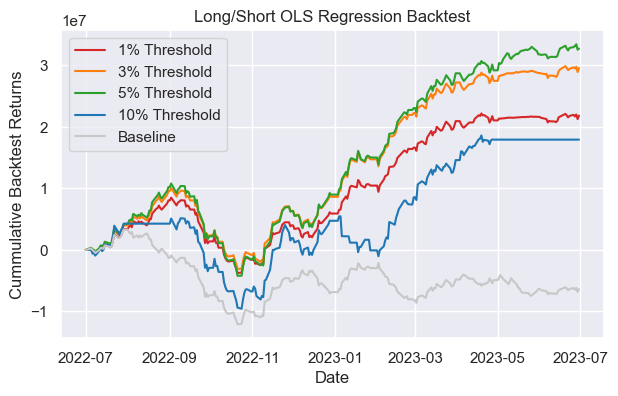

In [331]:
plt.figure(figsize = [7,4])
plt.plot(backtest_OLS_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_OLS_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_OLS_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_OLS_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short OLS Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [224]:
strategies_OLS = pd.DataFrame({"Long/Short 1%": backtest_OLS_01,
                               "Long/Short 3%": backtest_OLS_03,
                               "Long/Short 5%": backtest_OLS_05,
                               "Long/Short 10%": backtest_OLS_10})
backtest_summary(strategies_OLS)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$21,843,633.49",21.84%,8.17%,2.7,9.3,"-$1,678,114.41"
Long/Short 3%,"$29,592,183.13",29.59%,9.28%,3.2,1.1e+01,"-$1,874,564.19"
Long/Short 5%,"$32,730,246.31",32.73%,10.09%,3.2,1.1e+01,"-$2,205,495.42"
Long/Short 10%,"$17,935,922.21",17.94%,12.03%,1.5,5.2,"-$3,230,901.53"


In [225]:
%%time 
backtest_OLS_01_long = backtest(predictions_OLS, .01, long_only = True)
backtest_OLS_03_long = backtest(predictions_OLS, .03, long_only = True)
backtest_OLS_05_long = backtest(predictions_OLS, .05, long_only = True)
backtest_OLS_10_long = backtest(predictions_OLS, .10, long_only = True)

CPU times: user 2min 47s, sys: 1.65 s, total: 2min 49s
Wall time: 2min 48s


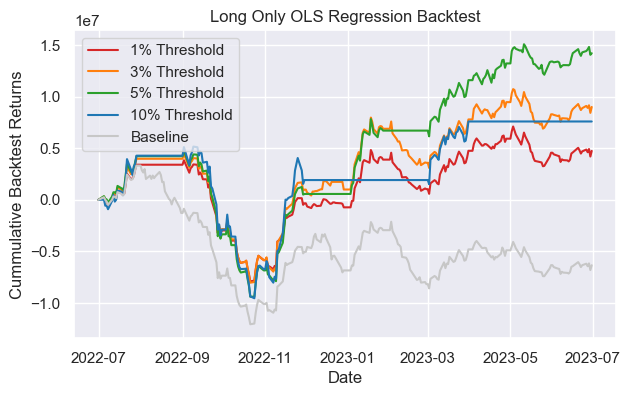

In [332]:
plt.figure(figsize = [7,4])
plt.plot(backtest_OLS_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_OLS_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_OLS_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_OLS_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only OLS Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [227]:
strategies_OLS_long = pd.DataFrame({"Long Only 1%": backtest_OLS_01_long,
                               "Long Only 3%": backtest_OLS_03_long,
                               "Long Only 5%": backtest_OLS_05_long,
                               "Long Only 10%": backtest_OLS_10_long})
backtest_summary(strategies_OLS_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long Only 1%,"$4,739,590.24",4.74%,7.79%,0.61,2.1,"-$1,605,701.09"
Long Only 3%,"$9,000,449.44",9.00%,8.80%,1.0,3.5,"-$1,778,717.36"
Long Only 5%,"$14,211,612.58",14.21%,9.14%,1.6,5.4,"-$2,085,491.91"
Long Only 10%,"$7,592,468.29",7.59%,9.56%,0.79,2.8,"-$2,435,133.04"


## Ridge Regression

In [228]:
%%time 
backtest_ridge_01 = backtest(predictions_ridge, .01)
backtest_ridge_03 = backtest(predictions_ridge, .03)
backtest_ridge_05 = backtest(predictions_ridge, .05)
backtest_ridge_10 = backtest(predictions_ridge, .10)

CPU times: user 3min 6s, sys: 998 ms, total: 3min 7s
Wall time: 3min 7s


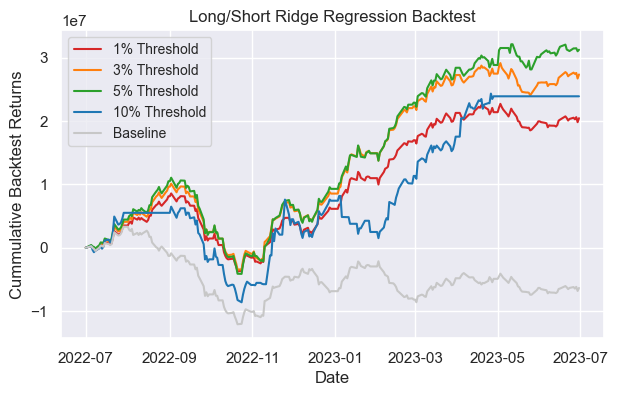

In [333]:
plt.figure(figsize = [7,4])
plt.plot(backtest_ridge_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ridge_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ridge_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ridge_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short Ridge Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [230]:
strategies_ridge = pd.DataFrame({"Long/Short 1%": backtest_ridge_01,
                               "Long/Short 3%": backtest_ridge_03,
                               "Long/Short 5%": backtest_ridge_05,
                               "Long/Short 10%": backtest_ridge_10})
backtest_summary(strategies_ridge)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$20,452,628.70",20.45%,8.51%,2.4,8.3,"-$1,680,952.79"
Long/Short 3%,"$27,353,410.85",27.35%,9.66%,2.8,9.8,"-$1,841,143.54"
Long/Short 5%,"$31,259,662.65",31.26%,10.54%,3.0,1e+01,"-$2,183,851.00"
Long/Short 10%,"$23,910,607.97",23.91%,14.50%,1.6,5.7,"-$3,313,711.27"


In [231]:
%%time 
backtest_ridge_01_long = backtest(predictions_ridge, .01, long_only = True)
backtest_ridge_03_long = backtest(predictions_ridge, .03, long_only = True)
backtest_ridge_05_long = backtest(predictions_ridge, .05, long_only = True)
backtest_ridge_10_long = backtest(predictions_ridge, .10, long_only = True)

CPU times: user 2min 46s, sys: 871 ms, total: 2min 47s
Wall time: 2min 46s


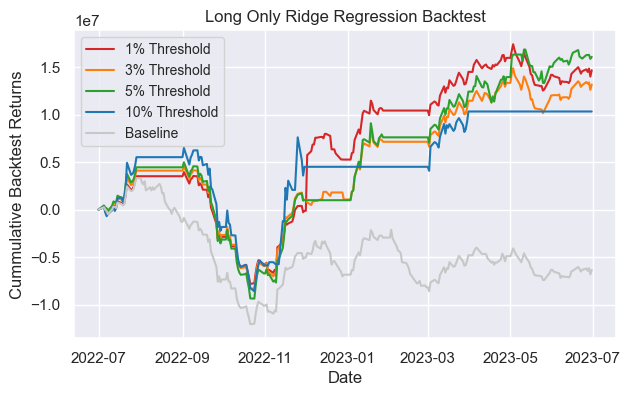

In [334]:
plt.figure(figsize = [7,4])
plt.plot(backtest_ridge_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ridge_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ridge_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ridge_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only Ridge Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [233]:
strategies_ridge_long = pd.DataFrame({"Long/Short 1%": backtest_ridge_01_long,
                               "Long/Short 3%": backtest_ridge_03_long,
                               "Long/Short 5%": backtest_ridge_05_long,
                               "Long/Short 10%": backtest_ridge_10_long})
backtest_summary(strategies_ridge_long )

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,666,673.94",14.67%,9.93%,1.5,5.1,"-$1,609,089.87"
Long/Short 3%,"$13,166,976.19",13.17%,8.80%,1.5,5.2,"-$1,747,831.32"
Long/Short 5%,"$16,077,925.08",16.08%,9.91%,1.6,5.6,"-$2,064,086.96"
Long/Short 10%,"$10,324,254.60",10.32%,12.14%,0.85,2.9,"-$2,425,130.44"


## Lasso Regression

In [234]:
%%time 
backtest_lasso_01 = backtest(predictions_lasso, .01)
backtest_lasso_03 = backtest(predictions_lasso, .03)
backtest_lasso_05 = backtest(predictions_lasso, .05)
backtest_lasso_10 = backtest(predictions_lasso, .10)

CPU times: user 3min 8s, sys: 1.04 s, total: 3min 9s
Wall time: 3min 9s


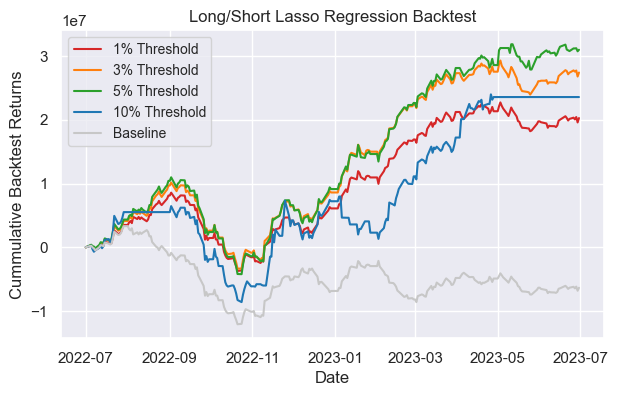

In [335]:
plt.figure(figsize = [7,4])
plt.plot(backtest_lasso_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_lasso_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_lasso_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_lasso_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short Lasso Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [236]:
strategies_lasso = pd.DataFrame({"Long/Short 1%": backtest_lasso_01,
                               "Long/Short 3%": backtest_lasso_03,
                               "Long/Short 5%": backtest_lasso_05,
                               "Long/Short 10%": backtest_lasso_10})
backtest_summary(strategies_lasso)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$20,265,163.50",20.27%,8.56%,2.4,8.2,"-$1,680,819.19"
Long/Short 3%,"$27,404,464.97",27.40%,9.69%,2.8,9.8,"-$1,818,088.53"
Long/Short 5%,"$30,979,451.85",30.98%,10.59%,2.9,1e+01,"-$2,178,072.86"
Long/Short 10%,"$23,562,416.21",23.56%,14.48%,1.6,5.6,"-$3,307,249.42"


In [237]:
%%time 
backtest_lasso_01_long = backtest(predictions_lasso, .01, long_only = True)
backtest_lasso_03_long = backtest(predictions_lasso, .03, long_only = True)
backtest_lasso_05_long = backtest(predictions_lasso, .05, long_only = True)
backtest_lasso_10_long = backtest(predictions_lasso, .10, long_only = True)

CPU times: user 2min 47s, sys: 1.13 s, total: 2min 48s
Wall time: 2min 48s


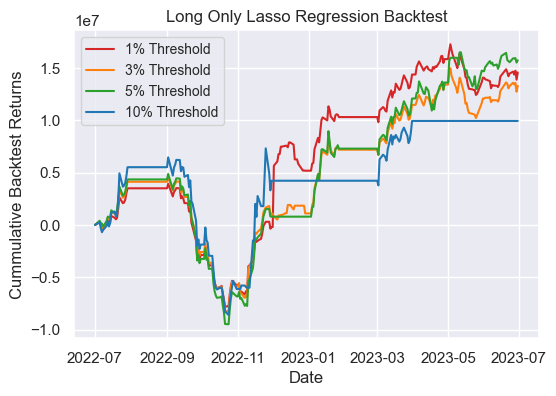

In [238]:
plt.figure(figsize = [6,4])
plt.plot(backtest_lasso_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_lasso_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_lasso_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_lasso_10_long, label = "10% Threshold", color = c10[0])
plt.title("Long Only Lasso Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [239]:
strategies_lasso_long = pd.DataFrame({"Long/Short 1%": backtest_lasso_01_long,
                               "Long/Short 3%": backtest_lasso_03_long,
                               "Long/Short 5%": backtest_lasso_05_long,
                               "Long/Short 10%": backtest_lasso_10_long})
backtest_summary(strategies_lasso_long )

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,567,527.59",14.57%,9.92%,1.5,5.1,"-$1,608,910.33"
Long/Short 3%,"$13,286,037.23",13.29%,8.80%,1.5,5.2,"-$1,725,803.00"
Long/Short 5%,"$15,727,019.63",15.73%,9.95%,1.6,5.5,"-$2,058,078.92"
Long/Short 10%,"$9,933,747.25",9.93%,12.11%,0.82,2.8,"-$2,386,633.15"


## Elastic Net

In [240]:
%%time 
backtest_elastic_net_01 = backtest(predictions_elastic_net, .01)
backtest_elastic_net_03 = backtest(predictions_elastic_net, .03)
backtest_elastic_net_05 = backtest(predictions_elastic_net, .05)
backtest_elastic_net_10 = backtest(predictions_elastic_net, .10)

CPU times: user 3min 9s, sys: 1.33 s, total: 3min 10s
Wall time: 3min 10s


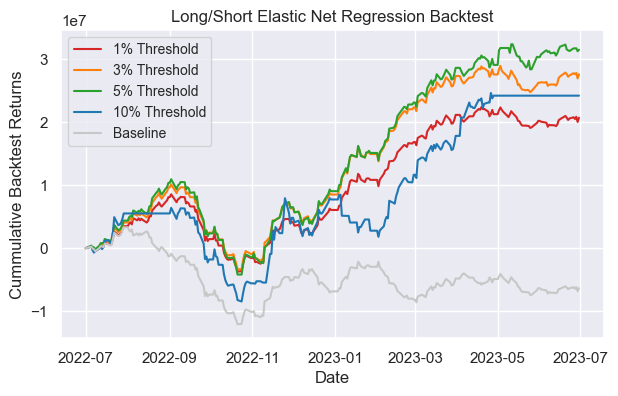

In [336]:
plt.figure(figsize = [7,4])
plt.plot(backtest_elastic_net_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_elastic_net_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_elastic_net_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_elastic_net_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short Elastic Net Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [242]:
strategies_elastic_net = pd.DataFrame({"Long/Short 1%": backtest_elastic_net_01,
                               "Long/Short 3%": backtest_elastic_net_03,
                               "Long/Short 5%": backtest_elastic_net_05,
                               "Long/Short 10%": backtest_elastic_net_10})
backtest_summary(strategies_elastic_net)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$20,700,843.31",20.70%,8.38%,2.5,8.6,"-$1,679,446.02"
Long/Short 3%,"$27,616,470.61",27.62%,9.54%,2.9,1e+01,"-$1,859,234.67"
Long/Short 5%,"$31,505,466.51",31.51%,10.55%,3.0,1e+01,"-$2,182,417.02"
Long/Short 10%,"$24,212,344.53",24.21%,14.45%,1.7,5.8,"-$3,323,016.32"


In [243]:
%%time 
backtest_elastic_net_01_long = backtest(predictions_elastic_net, .01, long_only = True)
backtest_elastic_net_03_long = backtest(predictions_elastic_net, .03, long_only = True)
backtest_elastic_net_05_long = backtest(predictions_elastic_net, .05, long_only = True)
backtest_elastic_net_10_long = backtest(predictions_elastic_net, .10, long_only = True)

CPU times: user 2min 47s, sys: 992 ms, total: 2min 48s
Wall time: 2min 48s


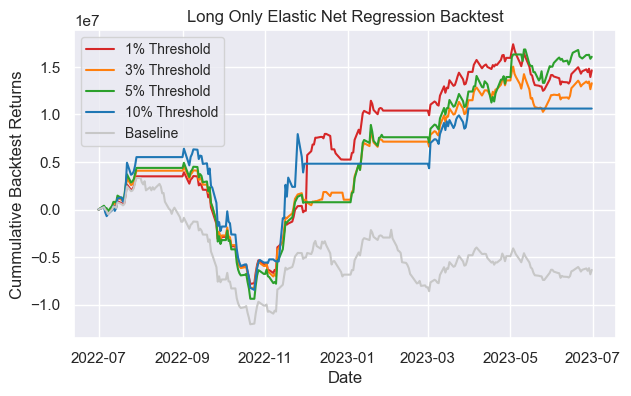

In [337]:
plt.figure(figsize = [7,4])
plt.plot(backtest_elastic_net_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_elastic_net_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_elastic_net_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_elastic_net_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only Elastic Net Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [245]:
strategies_elastic_net_long = pd.DataFrame({"Long/Short 1%": backtest_elastic_net_01_long,
                               "Long/Short 3%": backtest_elastic_net_03_long,
                               "Long/Short 5%": backtest_elastic_net_05_long,
                               "Long/Short 10%": backtest_elastic_net_10_long})
backtest_summary(strategies_elastic_net_long )

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,644,154.31",14.64%,9.93%,1.5,5.1,"-$1,607,701.80"
Long/Short 3%,"$13,287,838.28",13.29%,8.78%,1.5,5.2,"-$1,764,800.09"
Long/Short 5%,"$16,074,587.46",16.07%,9.88%,1.6,5.6,"-$2,063,667.60"
Long/Short 10%,"$10,623,792.91",10.62%,12.08%,0.88,3.0,"-$2,429,540.89"


## Present Value

In [246]:
%%time 
backtest_PV_01 = backtest(predictions_PV, .01)
backtest_PV_03 = backtest(predictions_PV, .03)
backtest_PV_05 = backtest(predictions_PV, .05)
backtest_PV_10 = backtest(predictions_PV, .10)

CPU times: user 3min 12s, sys: 1.17 s, total: 3min 13s
Wall time: 3min 13s


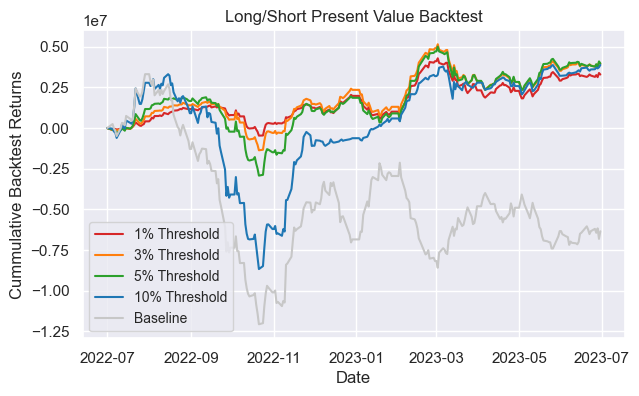

In [338]:
plt.figure(figsize = [7,4])
plt.plot(backtest_PV_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_PV_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_PV_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_PV_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short Present Value Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [248]:
strategies_PV = pd.DataFrame({"Long/Short 1%": backtest_PV_01,
                               "Long/Short 3%": backtest_PV_03,
                               "Long/Short 5%": backtest_PV_05,
                               "Long/Short 10%": backtest_PV_10})
backtest_summary(strategies_PV)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$3,295,169.80",3.30%,2.67%,1.2,4.3,"-$626,310.51"
Long/Short 3%,"$3,948,581.95",3.95%,3.27%,1.2,4.2,"-$816,789.12"
Long/Short 5%,"$3,978,066.89",3.98%,3.93%,1.0,3.5,"-$976,030.10"
Long/Short 10%,"$3,880,822.70",3.88%,6.50%,0.6,2.1,"-$1,621,079.10"


In [249]:
%%time 
backtest_PV_01_long = backtest(predictions_PV, .01, long_only = True)
backtest_PV_03_long = backtest(predictions_PV, .03, long_only = True)
backtest_PV_05_long = backtest(predictions_PV, .05, long_only = True)
backtest_PV_10_long = backtest(predictions_PV, .10, long_only = True)

CPU times: user 2min 42s, sys: 945 ms, total: 2min 43s
Wall time: 2min 44s


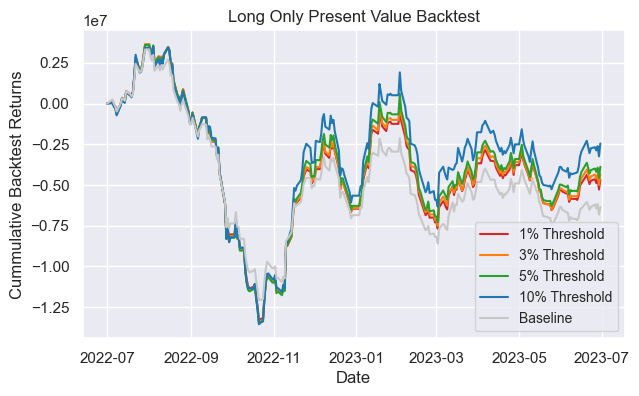

In [339]:
plt.figure(figsize = [7,4])
plt.plot(backtest_PV_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_PV_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_PV_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_PV_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only Present Value Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [251]:
strategies_PV_long = pd.DataFrame({"Long/Short 1%": backtest_PV_01_long,
                               "Long/Short 3%": backtest_PV_03_long,
                               "Long/Short 5%": backtest_PV_05_long,
                               "Long/Short 10%": backtest_PV_10_long})
backtest_summary(strategies_PV_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"-$4,674,706.39",-4.67%,9.80%,-0.48,-1.7,"-$1,934,155.92"
Long/Short 3%,"-$4,340,864.22",-4.34%,10.11%,-0.43,-1.5,"-$2,025,368.03"
Long/Short 5%,"-$3,885,085.60",-3.89%,10.37%,-0.37,-1.3,"-$2,163,503.62"
Long/Short 10%,"-$2,455,113.55",-2.46%,11.04%,-0.22,-0.77,"-$2,194,943.49"


## Random Forest

In [252]:
%%time 
backtest_rf_01 = backtest(predictions_rf, .01)
backtest_rf_03 = backtest(predictions_rf, .03)
backtest_rf_05 = backtest(predictions_rf, .05)
backtest_rf_10 = backtest(predictions_rf, .10)

CPU times: user 3min 24s, sys: 1.58 s, total: 3min 25s
Wall time: 3min 41s


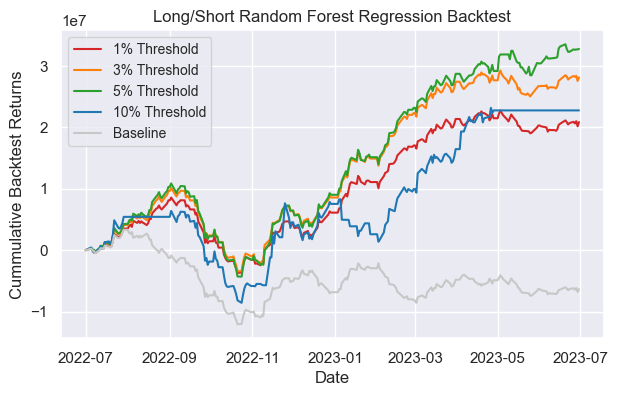

In [340]:
plt.figure(figsize = [7,4])
plt.plot(backtest_rf_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rf_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rf_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rf_10, label = "10% Threshold", color = c10[0])
plt.title("Long/Short Random Forest Regression Backtest")
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [254]:
strategies_rf = pd.DataFrame({"Long/Short 1%": backtest_rf_01,
                               "Long/Short 3%": backtest_rf_03,
                               "Long/Short 5%": backtest_rf_05,
                               "Long/Short 10%": backtest_rf_10})
backtest_summary(strategies_rf)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$20,870,640.25",20.87%,8.49%,2.5,8.5,"-$1,681,628.40"
Long/Short 3%,"$28,144,312.94",28.14%,9.62%,2.9,1e+01,"-$1,882,356.45"
Long/Short 5%,"$32,781,817.92",32.78%,10.66%,3.1,1.1e+01,"-$2,201,138.55"
Long/Short 10%,"$22,772,543.39",22.77%,14.52%,1.6,5.4,"-$3,316,976.54"


In [255]:
%%time 
backtest_rf_01_weighted = weighted_backtest(predictions_rf, .01)
backtest_rf_03_weighted = weighted_backtest(predictions_rf, .03)
backtest_rf_05_weighted = weighted_backtest(predictions_rf, .05)
backtest_rf_10_weighted = weighted_backtest(predictions_rf, .10)

CPU times: user 3min 23s, sys: 1.5 s, total: 3min 24s
Wall time: 3min 37s


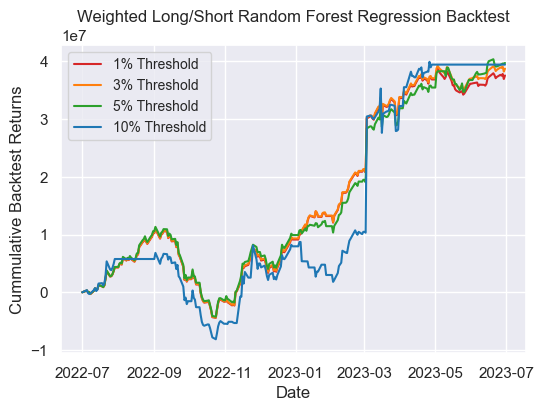

In [256]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rf_01_weighted, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rf_03_weighted, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rf_05_weighted, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rf_10_weighted, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long/Short Random Forest Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [257]:
strategies_rf_weighted = pd.DataFrame({"Long/Short 1%": backtest_rf_01_weighted,
                               "Long/Short 3%": backtest_rf_03_weighted,
                               "Long/Short 5%": backtest_rf_05_weighted,
                               "Long/Short 10%": backtest_rf_10_weighted})
backtest_summary(strategies_rf_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$37,515,922.64",37.52%,13.23%,2.8,9.8,"-$3,177,265.91"
Long/Short 3%,"$38,701,814.83",38.70%,13.29%,2.9,1e+01,"-$3,188,941.04"
Long/Short 5%,"$39,677,224.05",39.68%,13.63%,2.9,1e+01,"-$3,172,326.90"
Long/Short 10%,"$39,399,092.06",39.40%,24.53%,1.6,5.6,"-$7,670,516.22"


In [258]:
%%time 
backtest_rf_01_long = backtest(predictions_rf, .01, long_only = True)
backtest_rf_03_long = backtest(predictions_rf, .03, long_only = True)
backtest_rf_05_long = backtest(predictions_rf, .05, long_only = True)
backtest_rf_10_long = backtest(predictions_rf, .10, long_only = True)

CPU times: user 2min 59s, sys: 1.34 s, total: 3min 1s
Wall time: 3min 13s


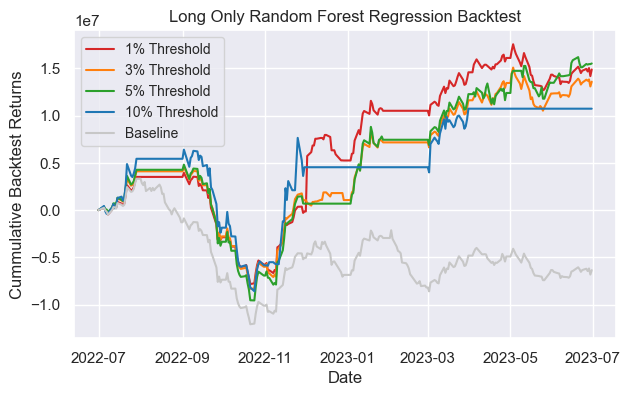

In [341]:
plt.figure(figsize = [7,4])
plt.plot(backtest_rf_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rf_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rf_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rf_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only Random Forest Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [260]:
strategies_rf_long = pd.DataFrame({"Long/Short 1%": backtest_rf_01_long,
                               "Long/Short 3%": backtest_rf_03_long,
                               "Long/Short 5%": backtest_rf_05_long,
                               "Long/Short 10%": backtest_rf_10_long})
backtest_summary(strategies_rf_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,876,729.82",14.88%,9.96%,1.5,5.2,"-$1,609,862.31"
Long/Short 3%,"$13,584,750.98",13.58%,8.88%,1.5,5.3,"-$1,787,039.76"
Long/Short 5%,"$15,509,727.46",15.51%,9.98%,1.6,5.4,"-$2,133,739.24"
Long/Short 10%,"$10,728,487.27",10.73%,12.25%,0.88,3.0,"-$2,379,759.34"


In [261]:
%%time 
backtest_rf_01_weighted_long = weighted_backtest(predictions_rf, .01, long_only = True)
backtest_rf_03_weighted_long = weighted_backtest(predictions_rf, .03, long_only = True)
backtest_rf_05_weighted_long = weighted_backtest(predictions_rf, .05, long_only = True)
backtest_rf_10_weighted_long = weighted_backtest(predictions_rf, .10, long_only = True)

CPU times: user 2min 59s, sys: 1.39 s, total: 3min 1s
Wall time: 3min 11s


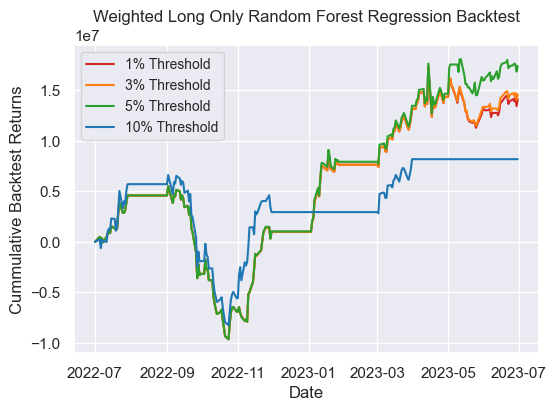

In [110]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rf_01_weighted_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rf_03_weighted_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rf_05_weighted_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rf_10_weighted_long, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long Only Random Forest Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [111]:
strategies_rf_weighted_long = pd.DataFrame({"Long/Short 1%": backtest_rf_01_weighted_long,
                               "Long/Short 3%": backtest_rf_03_weighted_long,
                               "Long/Short 5%": backtest_rf_05_weighted_long,
                               "Long/Short 10%": backtest_rf_10_weighted_long})
backtest_summary(strategies_rf_weighted_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,126,083.78",14.13%,11.75%,1.2,2.4,"-$4,937,509.59"
Long/Short 3%,"$14,619,251.50",14.62%,11.77%,1.2,2.5,"-$4,937,509.59"
Long/Short 5%,"$17,396,644.12",17.40%,12.12%,1.4,2.9,"-$4,950,956.61"
Long/Short 10%,"$8,186,822.89",8.19%,9.92%,0.83,1.7,"-$2,884,411.17"


## Gradient Boosting

In [268]:
%%time 
backtest_gb_01 = backtest(predictions_gb, .01)
backtest_gb_03 = backtest(predictions_gb, .03)
backtest_gb_05 = backtest(predictions_gb, .05)
backtest_gb_10 = backtest(predictions_gb, .10)

CPU times: user 3min 24s, sys: 1.41 s, total: 3min 25s
Wall time: 3min 41s


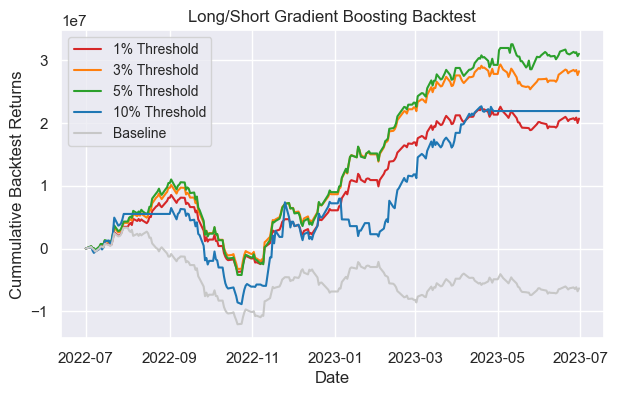

In [342]:
plt.figure(figsize = [7,4])
plt.plot(backtest_gb_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_gb_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_gb_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_gb_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short Gradient Boosting Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [270]:
strategies_gb = pd.DataFrame({"Long/Short 1%": backtest_gb_01,
                               "Long/Short 3%": backtest_gb_03,
                               "Long/Short 5%": backtest_gb_05,
                               "Long/Short 10%": backtest_gb_10})
backtest_summary(strategies_gb)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$20,713,359.10",20.71%,8.49%,2.4,8.5,"-$1,680,429.54"
Long/Short 3%,"$28,269,042.60",28.27%,9.60%,2.9,1e+01,"-$1,871,443.93"
Long/Short 5%,"$31,048,670.84",31.05%,10.66%,2.9,1e+01,"-$2,218,689.63"
Long/Short 10%,"$21,922,581.29",21.92%,14.49%,1.5,5.2,"-$3,306,941.87"


In [271]:
%%time 
backtest_gb_01_weighted = weighted_backtest(predictions_gb, .01)
backtest_gb_03_weighted = weighted_backtest(predictions_gb, .03)
backtest_gb_05_weighted = weighted_backtest(predictions_gb, .05)
backtest_gb_10_weighted = weighted_backtest(predictions_gb, .10)

CPU times: user 3min 22s, sys: 1.52 s, total: 3min 24s
Wall time: 3min 36s


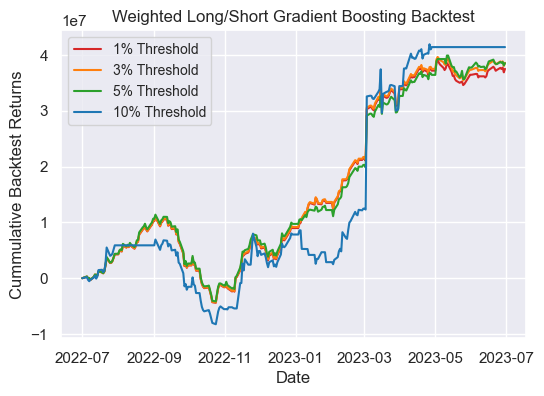

In [272]:
plt.figure(figsize = [6,4])
plt.plot(backtest_gb_01_weighted, label = "1% Threshold", color = c10[3])
plt.plot(backtest_gb_03_weighted, label = "3% Threshold", color = c10[1])
plt.plot(backtest_gb_05_weighted, label = "5% Threshold", color = c10[2])
plt.plot(backtest_gb_10_weighted, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long/Short Gradient Boosting Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [273]:
strategies_gb_weighted = pd.DataFrame({"Long/Short 1%": backtest_gb_01_weighted,
                               "Long/Short 3%": backtest_gb_03_weighted,
                               "Long/Short 5%": backtest_gb_05_weighted,
                               "Long/Short 10%": backtest_gb_10_weighted})
backtest_summary(strategies_gb_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$37,518,753.08",37.52%,13.17%,2.8,9.9,"-$3,135,638.72"
Long/Short 3%,"$38,589,921.28",38.59%,13.22%,2.9,1e+01,"-$3,149,471.66"
Long/Short 5%,"$38,536,658.26",38.54%,13.51%,2.9,9.9,"-$3,144,289.96"
Long/Short 10%,"$41,417,122.92",41.42%,24.53%,1.7,5.8,"-$7,782,650.15"


In [274]:
%%time 
backtest_gb_01_long = backtest(predictions_gb, .01, long_only = True)
backtest_gb_03_long = backtest(predictions_gb, .03, long_only = True)
backtest_gb_05_long = backtest(predictions_gb, .05, long_only = True)
backtest_gb_10_long = backtest(predictions_gb, .10, long_only = True)

CPU times: user 3min, sys: 1.27 s, total: 3min 1s
Wall time: 3min 13s


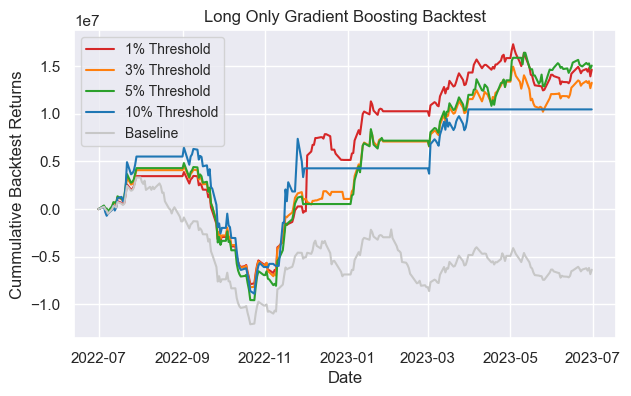

In [343]:
plt.figure(figsize = [7,4])
plt.plot(backtest_gb_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_gb_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_gb_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_gb_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only Gradient Boosting Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [276]:
strategies_gb_long = pd.DataFrame({"Long/Short 1%": backtest_gb_01_long,
                               "Long/Short 3%": backtest_gb_03_long,
                               "Long/Short 5%": backtest_gb_05_long,
                               "Long/Short 10%": backtest_gb_10_long})
backtest_summary(strategies_gb_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,625,659.92",14.63%,9.94%,1.5,5.1,"-$1,608,281.15"
Long/Short 3%,"$13,253,909.79",13.25%,8.86%,1.5,5.2,"-$1,775,991.81"
Long/Short 5%,"$15,056,564.17",15.06%,9.92%,1.5,5.3,"-$2,095,007.40"
Long/Short 10%,"$10,459,230.34",10.46%,12.28%,0.85,3.0,"-$2,373,908.56"


In [277]:
%%time 
backtest_gb_01_weighted_long = weighted_backtest(predictions_gb, .01, long_only = True)
backtest_gb_03_weighted_long = weighted_backtest(predictions_gb, .03, long_only = True)
backtest_gb_05_weighted_long = weighted_backtest(predictions_gb, .05, long_only = True)
backtest_gb_10_weighted_long = weighted_backtest(predictions_gb, .10, long_only = True)

CPU times: user 3min, sys: 1.32 s, total: 3min 1s
Wall time: 3min 13s


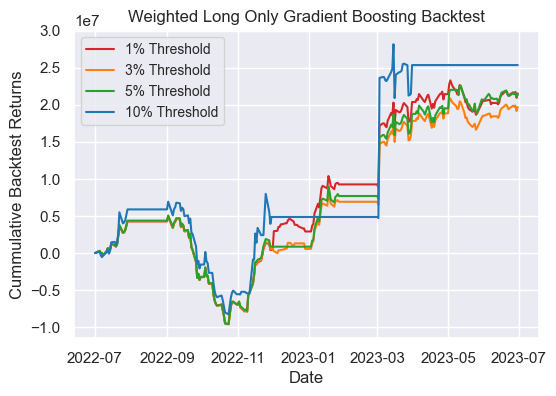

In [278]:
plt.figure(figsize = [6,4])
plt.plot(backtest_gb_01_weighted_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_gb_03_weighted_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_gb_05_weighted_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_gb_10_weighted_long, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long Only Gradient Boosting Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [279]:
strategies_gb_weighted_long = pd.DataFrame({"Long/Short 1%": backtest_gb_01_weighted_long,
                               "Long/Short 3%": backtest_gb_03_weighted_long,
                               "Long/Short 5%": backtest_gb_05_weighted_long,
                               "Long/Short 10%": backtest_gb_10_weighted_long})
backtest_summary(strategies_gb_weighted_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$21,522,705.39",21.52%,12.87%,1.7,5.8,"-$2,819,399.60"
Long/Short 3%,"$19,664,932.28",19.66%,12.74%,1.5,5.3,"-$2,766,240.92"
Long/Short 5%,"$21,354,722.28",21.35%,13.10%,1.6,5.6,"-$2,814,667.16"
Long/Short 10%,"$25,342,150.02",25.34%,23.16%,1.1,3.8,"-$7,256,729.81"


## Binary Classification

In [361]:
backtest_log = binary_backtest(predictions_log)
backtest_clrf = binary_backtest(predictions_clrf)
backtest_gnb = binary_backtest(predictions_gnb)

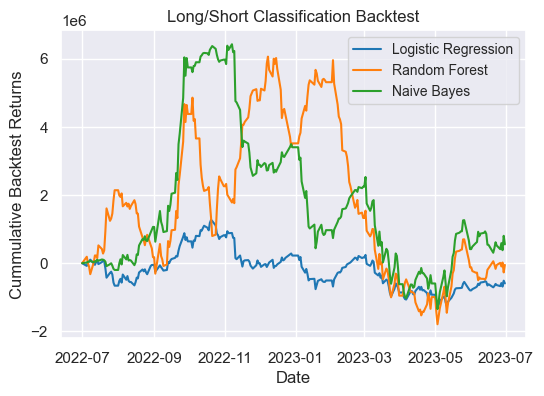

In [362]:
plt.figure(figsize = [6,4])
plt.plot(backtest_log, label = "Logistic Regression", color = c10[0])
plt.plot(backtest_clrf, label = "Random Forest", color = c10[1])
plt.plot(backtest_gnb, label = "Naive Bayes", color = c10[2])
plt.title("Long/Short Classification Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [363]:
strategies_class = pd.DataFrame({"Logistic Regression": backtest_log,
                               "Random Forest Classifier": backtest_clrf,
                               "Naive Bayes Classifier": backtest_gnb})
backtest_summary(strategies_class)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Logistic Regression,"-$592,649.44",-0.59%,1.89%,-0.31,-1.1,"-$591,569.18"
Random Forest Classifier,"-$50,510.49",-0.05%,5.11%,-0.0099,-0.034,"-$831,862.64"
Naive Bayes Classifier,"$553,094.74",0.55%,4.54%,0.12,0.42,"-$1,471,666.57"


In [ ]:
%%time
backtest_log_long = binary_backtest(predictions_log, long_only = True)
backtest_clrf_long = binary_backtest(predictions_clrf, long_only = True)
backtest_gnb_long = binary_backtest(predictions_gnb, long_only = True)

In [ ]:
plt.figure(figsize = [6,4])
plt.plot(backtest_log_long, label = "Logistic Regression", color = c10[0])
plt.plot(backtest_clrf_long, label = "Random Forest", color = c10[1])
plt.plot(backtest_gnb_long, label = "Naive Bayes", color = c10[2])
plt.title("Long Only Classification Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 10)
plt.show()

In [ ]:
strategies_class_long = pd.DataFrame({"Logistic Regression": backtest_log_long,
                               "Random Forest Classifier": backtest_clrf_long,
                               "Naive Bayes Classifier": backtest_gnb_long})
backtest_summary(strategies_class_long)

## Long Short-Term Memory

In [280]:
%%time 
backtest_ltsm_01 = backtest(predictions_ltsm, .01)
backtest_ltsm_03 = backtest(predictions_ltsm, .03)
backtest_ltsm_05 = backtest(predictions_ltsm, .05)
backtest_ltsm_10 = backtest(predictions_ltsm, .10)

CPU times: user 3min 33s, sys: 1.59 s, total: 3min 34s
Wall time: 3min 49s


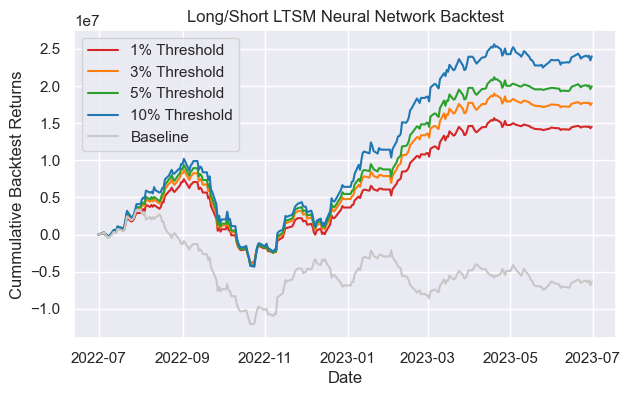

In [344]:
plt.figure(figsize = [7,4])
plt.plot(backtest_ltsm_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ltsm_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ltsm_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ltsm_10, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long/Short LTSM Neural Network Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [282]:
strategies_ltsm = pd.DataFrame({"Long/Short 1%": backtest_ltsm_01,
                               "Long/Short 3%": backtest_ltsm_03,
                               "Long/Short 5%": backtest_ltsm_05,
                               "Long/Short 10%": backtest_ltsm_10})
backtest_summary(strategies_ltsm)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$14,502,047.53",14.50%,6.80%,2.1,7.4,"-$1,627,757.41"
Long/Short 3%,"$17,647,096.85",17.65%,7.72%,2.3,7.9,"-$1,820,132.64"
Long/Short 5%,"$19,949,891.22",19.95%,8.36%,2.4,8.3,"-$1,956,156.03"
Long/Short 10%,"$23,983,195.91",23.98%,9.43%,2.5,8.8,"-$2,099,147.40"


In [283]:
%%time 
backtest_ltsm_01_weighted = weighted_backtest(predictions_ltsm, .01)
backtest_ltsm_03_weighted = weighted_backtest(predictions_ltsm, .03)
backtest_ltsm_05_weighted = weighted_backtest(predictions_ltsm, .05)
backtest_ltsm_10_weighted = weighted_backtest(predictions_ltsm, .10)

CPU times: user 3min 31s, sys: 1.37 s, total: 3min 33s
Wall time: 3min 46s


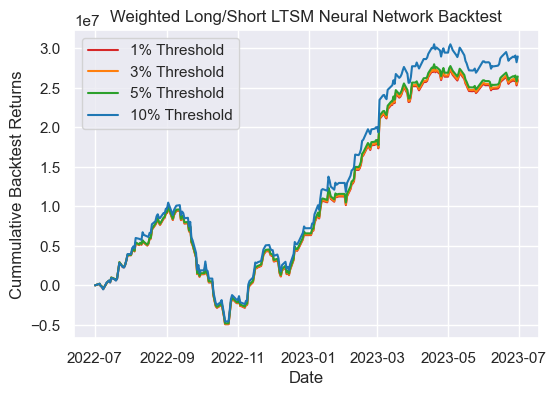

In [284]:
plt.figure(figsize = [6,4])
plt.plot(backtest_ltsm_01_weighted, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ltsm_03_weighted, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ltsm_05_weighted, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ltsm_10_weighted, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long/Short LTSM Neural Network Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [285]:
strategies_ltsm_weighted = pd.DataFrame({"Long/Short 1%": backtest_ltsm_01_weighted,
                               "Long/Short 3%": backtest_ltsm_03_weighted,
                               "Long/Short 5%": backtest_ltsm_05_weighted,
                               "Long/Short 10%": backtest_ltsm_10_weighted})
backtest_summary(strategies_ltsm_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$25,911,447.04",25.91%,9.76%,2.7,9.2,"-$2,090,143.61"
Long/Short 3%,"$26,077,794.24",26.08%,9.77%,2.7,9.2,"-$2,091,808.41"
Long/Short 5%,"$26,443,336.42",26.44%,9.81%,2.7,9.3,"-$2,098,023.85"
Long/Short 10%,"$28,975,396.56",28.98%,10.28%,2.8,9.8,"-$2,112,186.60"


In [286]:
%%time 
backtest_ltsm_01_long = backtest(predictions_ltsm, .01, long_only = True)
backtest_ltsm_03_long = backtest(predictions_ltsm, .03, long_only = True)
backtest_ltsm_05_long = backtest(predictions_ltsm, .05, long_only = True)
backtest_ltsm_10_long = backtest(predictions_ltsm, .10, long_only = True)

CPU times: user 2min 48s, sys: 888 ms, total: 2min 49s
Wall time: 3min


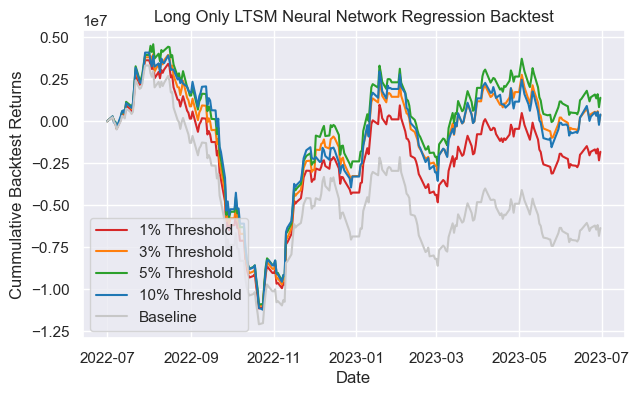

In [346]:
plt.figure(figsize = [7,4])
plt.plot(backtest_ltsm_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ltsm_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ltsm_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ltsm_10_long, label = "10% Threshold", color = c10[0])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("Long Only LTSM Neural Network Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(loc = "lower left")
plt.show()

In [288]:
strategies_ltsm_long = pd.DataFrame({"Long Only 1%": backtest_ltsm_01_long,
                               "Long Only 3%": backtest_ltsm_03_long,
                               "Long Only 5%": backtest_ltsm_05_long,
                               "Long Only 10%": backtest_ltsm_10_long})
backtest_summary(strategies_ltsm_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long Only 1%,"-$1,815,309.20",-1.82%,8.45%,-0.21,-0.74,"-$1,619,427.14"
Long Only 3%,"$381,418.48",0.38%,8.82%,0.043,0.15,"-$1,729,276.47"
Long Only 5%,"$1,397,383.87",1.40%,9.18%,0.15,0.53,"-$1,835,647.02"
Long Only 10%,"$403,194.92",0.40%,9.60%,0.042,0.15,"-$1,949,652.40"


In [289]:
%%time 
backtest_ltsm_01_long_weighed = weighted_backtest(predictions_ltsm, .01, long_only = True)
backtest_ltsm_03_long_weighed = weighted_backtest(predictions_ltsm, .03, long_only = True)
backtest_ltsm_05_long_weighed = weighted_backtest(predictions_ltsm, .05, long_only = True)
backtest_ltsm_10_long_weighed = weighted_backtest(predictions_ltsm, .10, long_only = True)

CPU times: user 2min 43s, sys: 1.04 s, total: 2min 44s
Wall time: 2min 50s


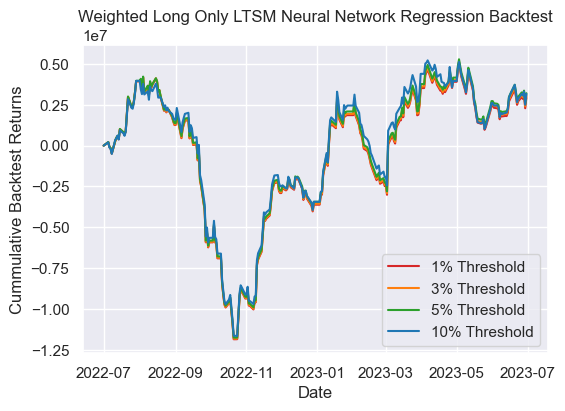

In [290]:
plt.figure(figsize = [6,4])
plt.plot(backtest_ltsm_01_long_weighed, label = "1% Threshold", color = c10[3])
plt.plot(backtest_ltsm_03_long_weighed, label = "3% Threshold", color = c10[1])
plt.plot(backtest_ltsm_05_long_weighed, label = "5% Threshold", color = c10[2])
plt.plot(backtest_ltsm_10_long_weighed, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long Only LTSM Neural Network Regression Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [291]:
strategies_ltsm_long_weighted = pd.DataFrame({"Long Only 1%": backtest_ltsm_01_long_weighed,
                               "Long Only 3%": backtest_ltsm_03_long_weighed,
                               "Long Only 5%": backtest_ltsm_05_long_weighed,
                               "Long Only 10%": backtest_ltsm_10_long_weighed})
backtest_summary(strategies_ltsm_long_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long Only 1%,"$2,922,052.72",2.92%,9.91%,0.29,1.0,"-$1,941,129.76"
Long Only 3%,"$3,038,105.62",3.04%,9.91%,0.31,1.1,"-$1,942,537.58"
Long Only 5%,"$3,205,706.43",3.21%,9.94%,0.32,1.1,"-$1,947,218.60"
Long Only 10%,"$3,162,745.84",3.16%,10.15%,0.31,1.1,"-$1,955,914.50"


## Recurrent Neural Network

In [167]:
%%time 
backtest_rnn_01 = backtest(predictions_rnn, .01)
backtest_rnn_03 = backtest(predictions_rnn, .03)
backtest_rnn_05 = backtest(predictions_rnn, .05)
backtest_rnn_10 = backtest(predictions_rnn, .10)

CPU times: user 3min 49s, sys: 1.06 s, total: 3min 51s
Wall time: 4min 26s


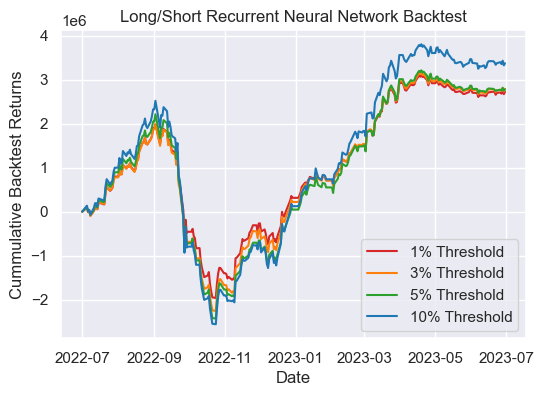

In [168]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rnn_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rnn_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rnn_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rnn_10, label = "10% Threshold", color = c10[0])
plt.title("Long/Short Recurrent Neural Network Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [169]:
strategies_rnn = pd.DataFrame({"Long/Short 1%": backtest_rnn_01,
                               "Long/Short 3%": backtest_rnn_03,
                               "Long/Short 5%": backtest_rnn_05,
                               "Long/Short 10%": backtest_rnn_10})
backtest_summary(strategies_rnn)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$2,724,371.62",2.72%,2.20%,1.2,2.5,"-$634,764.15"
Long/Short 3%,"$2,790,686.93",2.79%,2.35%,1.2,2.4,"-$692,338.10"
Long/Short 5%,"$2,781,434.14",2.78%,2.48%,1.1,2.2,"-$730,987.55"
Long/Short 10%,"$3,373,460.46",3.37%,2.77%,1.2,2.4,"-$848,767.70"


In [173]:
%%time 
backtest_rnn_01_weighted = weighted_backtest(predictions_rnn, .01)
backtest_rnn_03_weighted = weighted_backtest(predictions_rnn, .03)
backtest_rnn_05_weighted = weighted_backtest(predictions_rnn, .05)
backtest_rnn_10_weighted = weighted_backtest(predictions_rnn, .10)

CPU times: user 2min 35s, sys: 1 s, total: 2min 36s
Wall time: 3min 3s


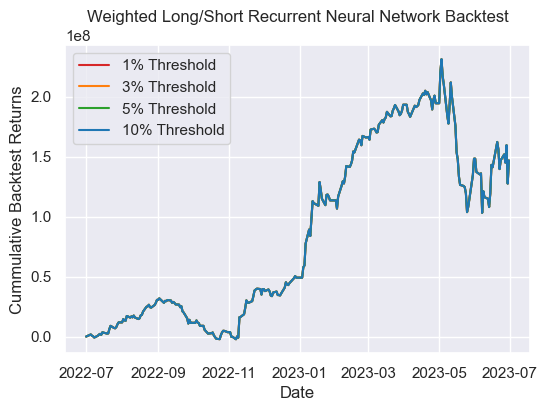

In [174]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rnn_01_weighted, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rnn_03_weighted, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rnn_05_weighted, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rnn_10_weighted, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long/Short Recurrent Neural Network Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [175]:
strategies_rnn_weighted = pd.DataFrame({"Long/Short 1%": backtest_rnn_01_weighted,
                               "Long/Short 3%": backtest_rnn_03_weighted,
                               "Long/Short 5%": backtest_rnn_05_weighted,
                               "Long/Short 10%": backtest_rnn_10_weighted})
backtest_summary(strategies_rnn_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long/Short 1%,"$146,724,403.19",146.72%,54.52%,2.7,5.4,"-$32,861,665.61"
Long/Short 3%,"$146,724,403.19",146.72%,54.52%,2.7,5.4,"-$32,861,665.61"
Long/Short 5%,"$146,724,403.19",146.72%,54.52%,2.7,5.4,"-$32,861,665.61"
Long/Short 10%,"$146,724,403.19",146.72%,54.52%,2.7,5.4,"-$32,861,665.61"


In [170]:
%%time 
backtest_rnn_01_long = backtest(predictions_rnn, .01, long_only = True)
backtest_rnn_03_long = backtest(predictions_rnn, .03, long_only = True)
backtest_rnn_05_long = backtest(predictions_rnn, .05, long_only = True)
backtest_rnn_10_long = backtest(predictions_rnn, .10, long_only = True)

CPU times: user 3min 7s, sys: 1.07 s, total: 3min 8s
Wall time: 3min 38s


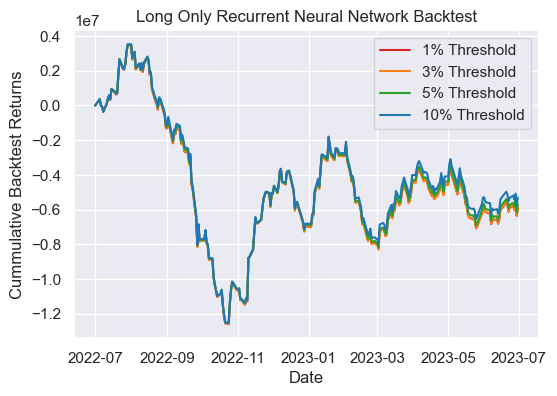

In [171]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rnn_01_long, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rnn_03_long, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rnn_05_long, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rnn_10_long, label = "10% Threshold", color = c10[0])
plt.title("Long Only Recurrent Neural Networ Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [172]:
strategies_rnn_long = pd.DataFrame({"Long Only 1%": backtest_rnn_01_long,
                               "Long Only 3%": backtest_rnn_03_long,
                               "Long Only 5%": backtest_rnn_05_long,
                               "Long Only 10%": backtest_rnn_10_long})
backtest_summary(strategies_rnn_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long Only 1%,"-$5,890,767.51",-5.89%,8.97%,-0.66,-1.3,"-$1,651,844.67"
Long Only 3%,"-$5,868,600.07",-5.87%,8.98%,-0.65,-1.3,"-$1,665,653.88"
Long Only 5%,"-$5,719,589.20",-5.72%,8.96%,-0.64,-1.3,"-$1,655,030.60"
Long Only 10%,"-$5,325,167.20",-5.33%,8.96%,-0.59,-1.2,"-$1,736,572.64"


In [176]:
%%time 
backtest_rnn_01_long_weighted = weighted_backtest(predictions_rnn, .01, long_only = True)
backtest_rnn_03_long_weighted = weighted_backtest(predictions_rnn, .03, long_only = True)
backtest_rnn_05_long_weighted = weighted_backtest(predictions_rnn, .05, long_only = True)
backtest_rnn_10_long_weighted = weighted_backtest(predictions_rnn, .10, long_only = True)

CPU times: user 2min 28s, sys: 927 ms, total: 2min 29s
Wall time: 2min 54s


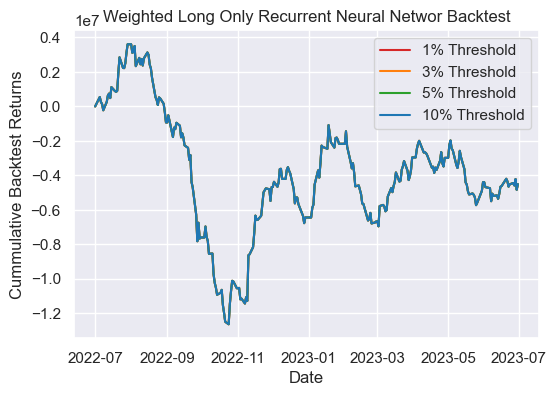

In [177]:
plt.figure(figsize = [6,4])
plt.plot(backtest_rnn_01_long_weighted, label = "1% Threshold", color = c10[3])
plt.plot(backtest_rnn_03_long_weighted, label = "3% Threshold", color = c10[1])
plt.plot(backtest_rnn_05_long_weighted, label = "5% Threshold", color = c10[2])
plt.plot(backtest_rnn_10_long_weighted, label = "10% Threshold", color = c10[0])
plt.title("Weighted Long Only Recurrent Neural Networ Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend()
plt.show()

In [178]:
strategies_rnn_long_weighted = pd.DataFrame({"Long Only 1%": backtest_rnn_01_long_weighted,
                               "Long Only 3%": backtest_rnn_03_long_weighted,
                               "Long Only 5%": backtest_rnn_05_long_weighted,
                               "Long Only 10%": backtest_rnn_10_long_weighted})
backtest_summary(strategies_rnn_long_weighted)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Long Only 1%,"-$4,510,311.82",-4.51%,9.09%,-0.5,-0.99,"-$1,582,277.71"
Long Only 3%,"-$4,510,311.82",-4.51%,9.09%,-0.5,-0.99,"-$1,582,277.71"
Long Only 5%,"-$4,510,311.82",-4.51%,9.09%,-0.5,-0.99,"-$1,582,277.71"
Long Only 10%,"-$4,510,311.82",-4.51%,9.09%,-0.5,-0.99,"-$1,582,277.71"


## Baseline Backtest

In [297]:
actual_price = []
for col in list(df_monthly.index.droplevel(1).unique()):
    df1 = df_monthly.loc[col][["Price"]]  
    df1.columns =  pd.MultiIndex.from_tuples([(col, "Actual")], names=['cusip', 'type'])
    actual_price.append(df1)

In [298]:
actual_price = pd.concat(actual_price, axis = 1)
actual_price = actual_price.loc[pd.Timestamp("2022-07-01"):]
actual_price.index.name = "trd_dt"
actual_price.head()

cusip,00206RBH4,00206RBK7,00206RCP5,00206RCQ3,00206RCU4,00206RDJ8,00206RDK5,00206RDQ2,00206RDR0,002824BF6,002824BG4,002824BH2,00287YAM1,00287YAR0,00287YAS8,00287YAV1,00287YAW9,00440EAW7,00774MAB1,00817YAF5,00817YAZ1,013716AU9,02209SAM5,02209SAR4,02209SAV5,023135AP1,023135AQ9,023135BC9,023135BF2,023135BJ4,023135BM7,025816BF5,026874DF1,026874DL8,03027XAK6,03027XAP5,03040WAD7,03040WAR6,03073EAP0,031162BZ2,031162CD0,031162CF5,031162CQ1,032654AN5,03523TBF4,03523TBT4,035240AG5,035240AL4,035240AM2,035240AN0,035240AP5,035242AN6,03524BAF3,036752AB9,036752AD5,036752AG8,036752AH6,037833AL4,037833AT7,037833BA7,037833BH2,037833BW9,037833BX7,037833CD0,037833CH1,037833CJ7,037833CR9,037833CX6,037833DB3,037833DD9,037833DG2,037833DK3,038222AL9,038222AM7,04351LAB6,046353AD0,046353AG3,046353AM0,046353AN8,04686JAA9,049560AM7,055451AR9,055451AV0,05565QDH8,05565QDN5,057224AZ0,05723KAE0,05723KAF7,05964HAB1,05964HAF2,05964HAJ4,06050TJZ6,06051GEN5,06051GFC8,06051GFL8,06051GGA1,06051GGC7,06051GGF0,06051GGG8,06051GGL7,06051GGM5,06051GGR4,06051GHA0,06051GHD4,06051GHG7,06406RAD9,06406RAF4,06406RAH0,06406YAA0,06738EAJ4,06738EAU9,06738EAV7,06738EAW5,06738EBD6,06849RAG7,06849RAK8,06849UAD7,07330MAA5,075887BG3,075887BW8,075887BX6,0778FPAA7,084659AF8,084659AP6,084664BL4,084670BK3,09062XAD5,10112RAY0,10922NAC7,10922NAF0,111021AE1,11134LAH2,11134LAR0,11271LAB8,11271LAC6,12189LAA9,12189LAN1,12189LAS0,12189LAU5,12189LAW1,12189LAZ4,12189LBB6,12189LBC4,12527GAD5,12527GAE3,12527GAF0,12572QAF2,126408GY3,126408HF3,126408HH9,126408HJ5,126408HK2,126650CD0,126650CN8,126650CX6,126650CY4,126650CZ1,134429BG3,136385AL5,136385AX9,136385AY7,13645RAX2,14040HBN4,14040HBW4,14149YBJ6,149123BS9,149123CB5,15135UAF6,15135UAR0,161175AZ7,161175BA1,161175BL7,161175BM5,161175BN3,16412XAG0,171232AQ4,17275RAD4,17275RAF9,17275RBL5,172967BL4,172967EW7,172967FX4,172967HA2,172967HS3,172967JC6,172967JU6,172967KA8,172967KR1,172967KU4,172967KY6,172967LD1,172967LJ8,172967LP4,172967LS8,172967LU3,172967LW9,20030NAC5,20030NAF8,20030NBH3,20030NBM2,20030NBP5,20030NBQ3,20030NBT7,20030NBU4,20030NBW0,20030NBY6,20030NBZ3,20030NCA7,20030NCC3,20030NCE9,20030NCG4,20030NCH2,20030NCJ8,20030NCK5,202795JM3,207597EL5,208251AE8,20825CAQ7,20826FAC0,209111FD0,209111FF5,212015AS0,21684AAB2,21684AAD8,21685WCJ4,219350BF1,22160KAM7,22822VAH4,22822VAK7,233835AQ0,244199BF1,25156PAC7,25179MAL7,25179MAN3,25179MAU7,25389JAR7,25468PDB9,25468PDV5,254709AM0,25470DAR0,25470DAT6,256746AH1,260543BJ1,260543CE1,260543CG6,26441CAS4,26441CAT2,26441CAX3,26442CAH7,26884ABB8,26884LAF6,277432AP5,278062AE4,278642AF0,278642AU7,278865AV2,28368EAE6,29103DAM8,292480AL4,292505AD6,29250NAL9,29250NAM7,29273RAR0,29273RBF5,29273RBJ7,29273RBL2,29278NAE3,29278NAF0,29379VAT0,29379VAW3,29379VAY9,29379VBA0,29379VBC6,29379VBJ1,29379VBQ5,30161MAG8,30161MAN3,30161NAV3,30212PAP0,30231GAN2,30231GAW2,31428XAW6,31428XBE5,31428XBG0,31428XBN5,31428XBQ8,316773CH1,341081FQ5,341099CL1,35177PAL1,35177PAX5,35671DBC8,35671DBJ3,36164QNA2,36186CBY8,369550BC1,36962G3P7,36962GXZ2,370334BZ6,370334CG7,37045VAF7,37045VAH3,37045VAJ9,37045VAK6,37045VAL4,37045VAN0,37045VAP5,37045VAQ3,37045XBQ8,37045XBT2,373334JW2,375558AS2,375558AX1,375558BA0,375558BD4,375558BG7,375558BJ1,375558BK8,375558BM4,377372AE7,377372AN7,38141EC31,38141GCU6,38141GES9,38141GFD1,38141GGM0,38141GVS0,38141GWB6,38141GWL4,38141GWV2,38141GWZ3,38141GXA7,38143VAA7,38148LAF3,38148YAA6,404119BU2,404119BV0,404280AG4,404280AH2,404280AJ8,404280AM1,404280AQ2,404280BK4,404280BT5,406216AW1,406216AY7,406216BE0,406216BJ9,406216BK6,413875AW5,42809HAC1,42809HAD9,42809HAG2,428236BR3,42824CAX7,42824CAY5,437076AS1,437076AV4,437076BA9,437076BD3,437076BF8,437076BH4,437076BN1,437076BP6,437076BS0,437076BT8,438516BL9,444859BE1,452308AR0,452308AX7,456837AH6,458140AK6,458140AN0,458140AT7,458140AV2,458140AX8,458140AY6,458140BG4,459200HF1,46625HHF0,46625HHV5,46625HJB7,46625HJM3,46625HJU5,46625HJZ4,46625HLL2,46625HNJ5,46625HRV4,46625HRX0,46625HRY8,46647PAA4,46647PAF3,46647PAJ5,46647PAK2,46647PAL0,46647PAM8,46647PAN6,46647PAR7,47233JAG3,4723

In [299]:
backtest_baseline = baseline_backtest(actual_price, long = True)
backtest_baseline_short = baseline_backtest(actual_price, long = False)

In [300]:
df_test = df[df.index.droplevel(0) >= pd.Timestamp("2022-07-01")][["Price"]]
df_baseline = (df_test[["Price"]].unstack("cusip")/ df_test[["Price"]].unstack("cusip").iloc[0]) * 100_000_000 / len(df.index.droplevel(1).unique())
df_baseline.head()

Price                                               \
cusip           00206RBH4      00206RBK7      00206RCP5      00206RCQ3   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  133996.810043  134184.729404  133211.747998  133091.026520   
2022-07-06  133974.511561  132259.474786  132572.355576  132636.427357   
2022-07-07  133971.413601  132478.068754  132542.632449  132835.432002   
2022-07-08  134263.395007  132885.256639  132495.588611  132289.734025   

                                                                        \
cusip           00206RCU4      00206RDJ8      00206RDK5      00206RDQ2   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  132802.124834  133200.626275  135674.975360  132471.338989   
2022-07-06  132802.124834  133200.626275  135935.186400  132292.038121   
2022-07-07  132802.124834  133200.626275  135935.186400  131866.757746   
2022-07-08  134079.878676  133200.626275  135935.186400  131766.169658   

                                                                        \
cusip           00206RDR0      002824BF6      002824BG4      002824BH2   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  134783.027267  133117.713733  133483.643106  133399.605490   
2022-07-06  133323.364641  132927.808380  132243.745080  133233.905653   
2022-07-07  133843.747142  132368.023673  132781.996011  132691.707931   
2022-07-08  131297.316848  132712.828909  132251.467647  132576.367638   

                                                                        \
cusip           00287YAM1      00287YAR0      00287YAS8      00287YAV1   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  131980.794702  132207.164518  132732.245105  132835.530575   
2022-07-06  131980.794702  132045.115952  132597.822346  133982.669114   
2022-07-07  131822.830977  131464.458839  132384.441358  131581.506580   
2022-07-08  131590.694763  131175.581627  131678.262227  131347.303028   

                                                                        \
cusip           00287YAW9      00440EAW7      00774MAB1      00817YAF5   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  133035.568897  133762.434861  133914.649284  133328.884935   
2022-07-06  133681.337755  132854.985590  134081.284333  133328.884935   
2022-07-07  132889.202293  132854.985590  132516.016777  133150.183475   
2022-07-08  133276.426284  132854.985590  132324.307764  133150.183475   

                                                                        \
cusip           00817YAZ1      013716AU9      02209SAM5      02209SAR4   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  133108.795796  132897.800730  131497.550401  133315.844334   
2022-07-06  133610.966094  131991.837174  130229.198023  131800.349501   
2022-07-07  133486.465018  131991.837174  130847.888424  131052.115774   
2022-07-08  133003.663919  130468.956110  130079.882734  130535.609731   

                                                                        \
cusip           02209SAV5      023135AP1      023135AQ9      023135BC9   
trd_dt                                                                   
2022-07-01  132802.124834  132802.124834  132802.124834  132802.124834   
2022-07-05  133499.827618  131239.225768  133716.409333  132768.052834   
2022-07-06  132915.285213  132446.244213  132908.371411  133205.493188   
2022-07-07  131292

# Compare Performance

## Long Only Strategies

In [302]:
strategies_01_long = pd.DataFrame({"OLS Regression": backtest_OLS_01_long,
                             "Ridge Regression": backtest_ridge_01_long,
                             "Lasso Regression": backtest_ridge_01_long,
                             "Elastic Net": backtest_elastic_net_01_long,
                             "Present Value": backtest_PV_01_long,
                             "Random Forest": backtest_rf_01_long,
                             "Gradient Boosting": backtest_gb_01_long,
                             "LTSM Neural Network": backtest_ltsm_01_long,
                             "Baseline": backtest_baseline})
strategies_01_long.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,259509.061772,268213.953408,268213.953408,269282.009569,173082.667221,267701.703586,264931.731046,261637.914204,245939.375586
2022-07-06,-9806.254992,2296.683082,2296.683082,285.766595,-58476.879922,1669.282491,-4254.731381,10136.076819,-23704.454812
2022-07-07,-149438.208424,-130940.721526,-130940.721526,-135473.774444,-158619.203159,-129034.746646,-140520.905966,-105791.530234,-165912.886236
2022-07-08,-476872.280929,-464991.773607,-464991.773607,-467780.732519,-530316.554220,-465633.183016,-470981.669202,-446139.625791,-491266.168391


In [303]:
backtest_summary(strategies_01_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$4,739,590.24",4.74%,7.79%,0.61,2.1,"-$1,605,701.09"
Ridge Regression,"$14,666,673.94",14.67%,9.93%,1.5,5.1,"-$1,609,089.87"
Lasso Regression,"$14,666,673.94",14.67%,9.93%,1.5,5.1,"-$1,609,089.87"
Elastic Net,"$14,644,154.31",14.64%,9.93%,1.5,5.1,"-$1,607,701.80"
Present Value,"-$4,674,706.39",-4.67%,9.80%,-0.48,-1.7,"-$1,934,155.92"
Random Forest,"$14,876,729.82",14.88%,9.96%,1.5,5.2,"-$1,609,862.31"
Gradient Boosting,"$14,625,659.92",14.63%,9.94%,1.5,5.1,"-$1,608,281.15"
LTSM Neural Network,"-$1,815,309.20",-1.82%,8.45%,-0.21,-0.74,"-$1,619,427.14"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


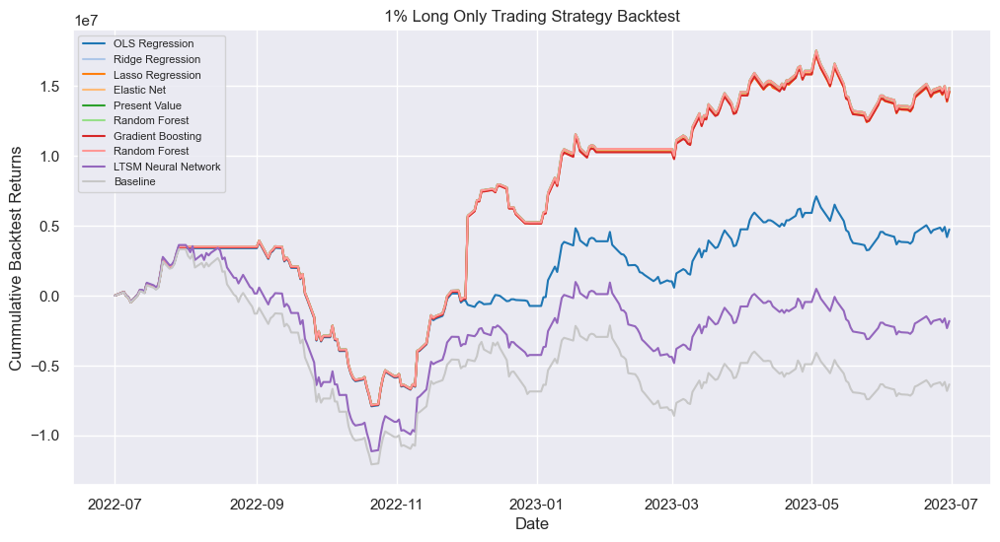

In [304]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_01_long, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_01_long, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_01_long, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_01_long, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_01_long, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_01_long, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_01_long, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_01_long, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_01_long, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("1% Long Only Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [305]:
strategies_03_long = pd.DataFrame({"OLS Regression": backtest_OLS_03_long,
                             "Ridge Regression": backtest_ridge_03_long,
                             "Lasso Regression": backtest_ridge_03_long,
                             "Elastic Net": backtest_elastic_net_03_long,
                             "Present Value": backtest_PV_03_long,
                             "Random Forest": backtest_rf_03_long,
                             "Gradient Boosting": backtest_gb_03_long,
                             "LTSM Neural Network": backtest_ltsm_03_long,
                             "Baseline": backtest_baseline})
strategies_03_long.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,310337.611318,314505.707228,314505.707228,311005.064308,116612.711342,315149.069564,312047.065316,263170.639296,245939.375586
2022-07-06,38825.413739,53259.504196,53259.504196,43473.718246,-104223.662540,52077.742548,41114.392066,1217.525761,-23704.454812
2022-07-07,-47347.187013,-15627.013676,-15627.013676,-28902.844590,-206814.575696,-25454.623108,-29890.416646,-79812.486733,-165912.886236
2022-07-08,-406355.776457,-385329.615978,-385329.615978,-393769.363572,-567353.155711,-393513.694450,-391373.725761,-436067.364495,-491266.168391


In [306]:
backtest_summary(strategies_03_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$9,000,449.44",9.00%,8.80%,1.0,3.5,"-$1,778,717.36"
Ridge Regression,"$13,166,976.19",13.17%,8.80%,1.5,5.2,"-$1,747,831.32"
Lasso Regression,"$13,166,976.19",13.17%,8.80%,1.5,5.2,"-$1,747,831.32"
Elastic Net,"$13,287,838.28",13.29%,8.78%,1.5,5.2,"-$1,764,800.09"
Present Value,"-$4,340,864.22",-4.34%,10.11%,-0.43,-1.5,"-$2,025,368.03"
Random Forest,"$13,584,750.98",13.58%,8.88%,1.5,5.3,"-$1,787,039.76"
Gradient Boosting,"$13,253,909.79",13.25%,8.86%,1.5,5.2,"-$1,775,991.81"
LTSM Neural Network,"$381,418.48",0.38%,8.82%,0.043,0.15,"-$1,729,276.47"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


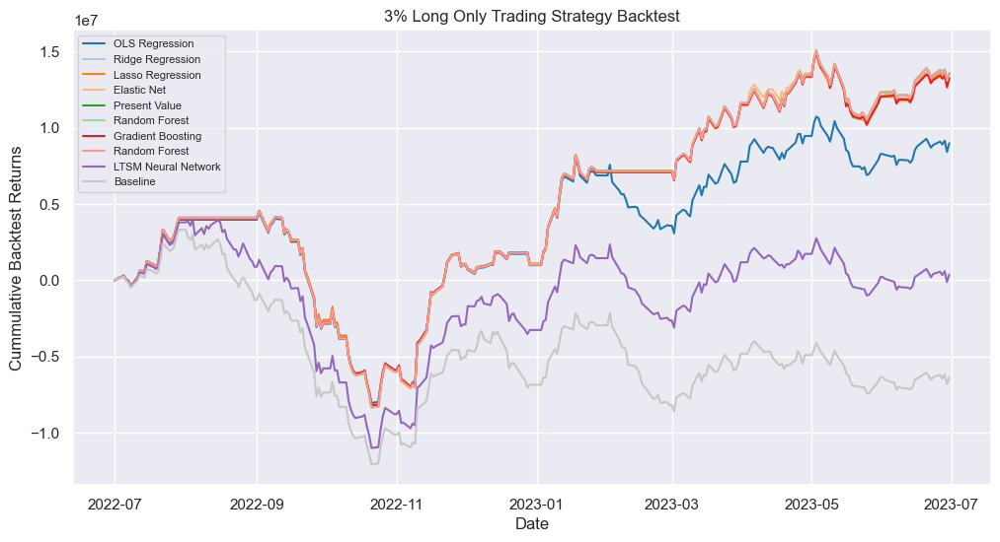

In [307]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_03_long, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_03_long, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_03_long, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_03_long, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_03_long, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_03_long, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_03_long, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_03_long, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_03_long, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("3% Long Only Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [308]:
strategies_05_long = pd.DataFrame({"OLS Regression": backtest_OLS_05_long,
                             "Ridge Regression": backtest_ridge_05_long,
                             "Lasso Regression": backtest_ridge_05_long,
                             "Elastic Net": backtest_elastic_net_05_long,
                             "Present Value": backtest_PV_05_long,
                             "Random Forest": backtest_rf_05_long,
                             "Gradient Boosting": backtest_gb_05_long,
                             "LTSM Neural Network": backtest_ltsm_05_long,
                             "Baseline": backtest_baseline})
strategies_05_long.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,350421.067722,430145.261277,430145.261277,400320.253817,68734.075274,374391.657277,380075.696251,280717.341009,245939.375586
2022-07-06,95478.970646,203571.587734,203571.587734,185008.786034,-141070.801696,104381.201930,87113.080781,24847.132393,-23704.454812
2022-07-07,32392.610014,135238.214668,135238.214668,135045.842891,-260805.241695,60457.166261,67562.777126,-23434.410946,-165912.886236
2022-07-08,-282615.971913,-120576.855664,-120576.855664,-183194.419418,-674927.260765,-226978.065770,-243620.501507,-379741.341781,-491266.168391


In [309]:
backtest_summary(strategies_05_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$14,211,612.58",14.21%,9.14%,1.6,5.4,"-$2,085,491.91"
Ridge Regression,"$16,077,925.08",16.08%,9.91%,1.6,5.6,"-$2,064,086.96"
Lasso Regression,"$16,077,925.08",16.08%,9.91%,1.6,5.6,"-$2,064,086.96"
Elastic Net,"$16,074,587.46",16.07%,9.88%,1.6,5.6,"-$2,063,667.60"
Present Value,"-$3,885,085.60",-3.89%,10.37%,-0.37,-1.3,"-$2,163,503.62"
Random Forest,"$15,509,727.46",15.51%,9.98%,1.6,5.4,"-$2,133,739.24"
Gradient Boosting,"$15,056,564.17",15.06%,9.92%,1.5,5.3,"-$2,095,007.40"
LTSM Neural Network,"$1,397,383.87",1.40%,9.18%,0.15,0.53,"-$1,835,647.02"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


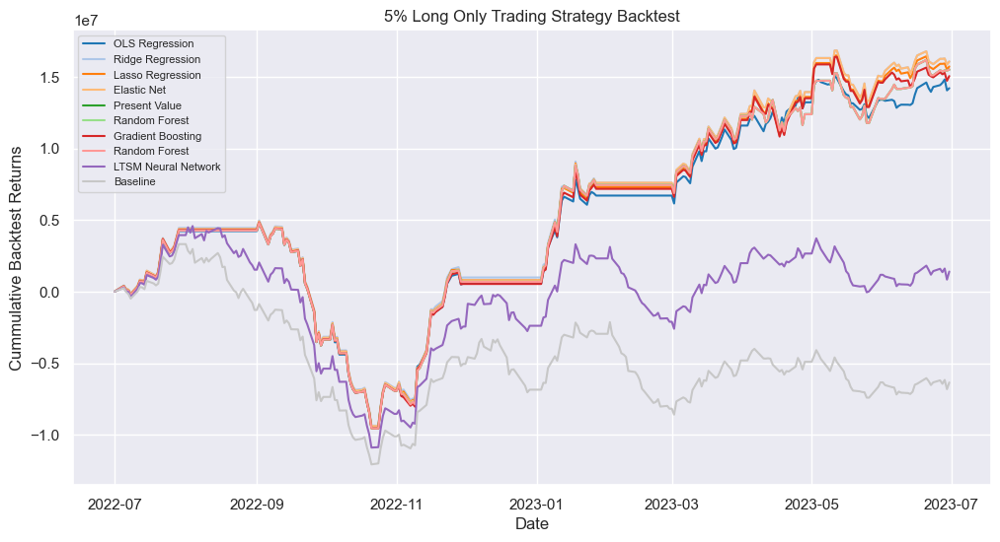

In [310]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_05_long, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_05_long, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_05_long, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_05_long, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_05_long, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_05_long, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_05_long, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_05_long, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_05_long, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("5% Long Only Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [311]:
strategies_10_long = pd.DataFrame({"OLS Regression": backtest_OLS_10_long,
                             "Ridge Regression": backtest_ridge_10_long,
                             "Lasso Regression": backtest_ridge_10_long,
                             "Elastic Net": backtest_elastic_net_10_long,
                             "Present Value": backtest_PV_10_long,
                             "Random Forest": backtest_rf_10_long,
                             "Gradient Boosting": backtest_gb_10_long,
                             "LTSM Neural Network": backtest_ltsm_10_long,
                             "Baseline": backtest_baseline})
strategies_10_long.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,6991.152661,243832.466040,243832.466040,243832.466040,9517.670306,435962.222093,243832.466040,292297.398595,245939.375586
2022-07-06,-579761.496536,-327711.969562,-327711.969562,-327711.969562,-207747.092069,-125514.415087,-327711.969562,-82457.576365,-23704.454812
2022-07-07,-564557.352747,-698327.182300,-698327.182300,-698327.182300,-276893.798123,-398877.749767,-698327.182300,-46713.542582,-165912.886236
2022-07-08,-917599.421266,-464974.319803,-464974.319803,-464974.319803,-726800.781051,-324847.728664,-464974.319803,-379162.892823,-491266.168391


In [312]:
backtest_summary(strategies_10_long)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$7,592,468.29",7.59%,9.56%,0.79,2.8,"-$2,435,133.04"
Ridge Regression,"$10,324,254.60",10.32%,12.14%,0.85,2.9,"-$2,425,130.44"
Lasso Regression,"$10,324,254.60",10.32%,12.14%,0.85,2.9,"-$2,425,130.44"
Elastic Net,"$10,623,792.91",10.62%,12.08%,0.88,3.0,"-$2,429,540.89"
Present Value,"-$2,455,113.55",-2.46%,11.04%,-0.22,-0.77,"-$2,194,943.49"
Random Forest,"$10,728,487.27",10.73%,12.25%,0.88,3.0,"-$2,379,759.34"
Gradient Boosting,"$10,459,230.34",10.46%,12.28%,0.85,3.0,"-$2,373,908.56"
LTSM Neural Network,"$403,194.92",0.40%,9.60%,0.042,0.15,"-$1,949,652.40"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


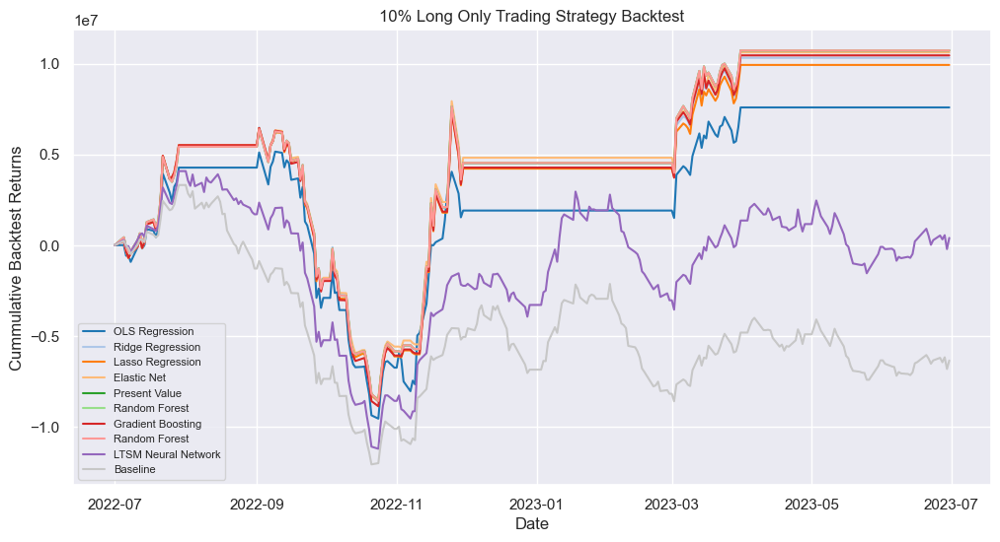

In [313]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_10_long, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_10_long, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_10_long, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_10_long, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_10_long, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_10_long, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_10_long, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_10_long, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_10_long, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("10% Long Only Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

## Long/Short Strategies

In [315]:
strategies_01 = pd.DataFrame({"OLS Regression": backtest_OLS_01,
                             "Ridge Regression": backtest_ridge_01,
                             "Lasso Regression": backtest_ridge_01,
                             "Elastic Net": backtest_elastic_net_01,
                             "Present Value": backtest_PV_01,
                             "Random Forest": backtest_rf_01,
                             "Gradient Boosting": backtest_gb_01,
                             "LTSM Neural Network": backtest_ltsm_01,
                             "Baseline": backtest_baseline})
strategies_01.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,259509.061772,268213.953408,268213.953408,269282.009569,-106117.141284,267701.703586,264931.731046,194578.494484,245939.375586
2022-07-06,-9806.254992,2296.683082,2296.683082,285.766595,-80698.211657,1669.282491,-4254.731381,11404.177781,-23704.454812
2022-07-07,-149438.208424,-130940.721526,-130940.721526,-135473.774444,-52495.252052,-129034.746646,-140520.905966,-56572.818223,-165912.886236
2022-07-08,-476872.280929,-464991.773607,-464991.773607,-467780.732519,-96535.201599,-465633.183016,-470981.669202,-327963.155802,-491266.168391


In [316]:
backtest_summary(strategies_01)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$21,843,633.49",21.84%,8.17%,2.7,9.3,"-$1,678,114.41"
Ridge Regression,"$20,452,628.70",20.45%,8.51%,2.4,8.3,"-$1,680,952.79"
Lasso Regression,"$20,452,628.70",20.45%,8.51%,2.4,8.3,"-$1,680,952.79"
Elastic Net,"$20,700,843.31",20.70%,8.38%,2.5,8.6,"-$1,679,446.02"
Present Value,"$3,295,169.80",3.30%,2.67%,1.2,4.3,"-$626,310.51"
Random Forest,"$20,870,640.25",20.87%,8.49%,2.5,8.5,"-$1,681,628.40"
Gradient Boosting,"$20,713,359.10",20.71%,8.49%,2.4,8.5,"-$1,680,429.54"
LTSM Neural Network,"$14,502,047.53",14.50%,6.80%,2.1,7.4,"-$1,627,757.41"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


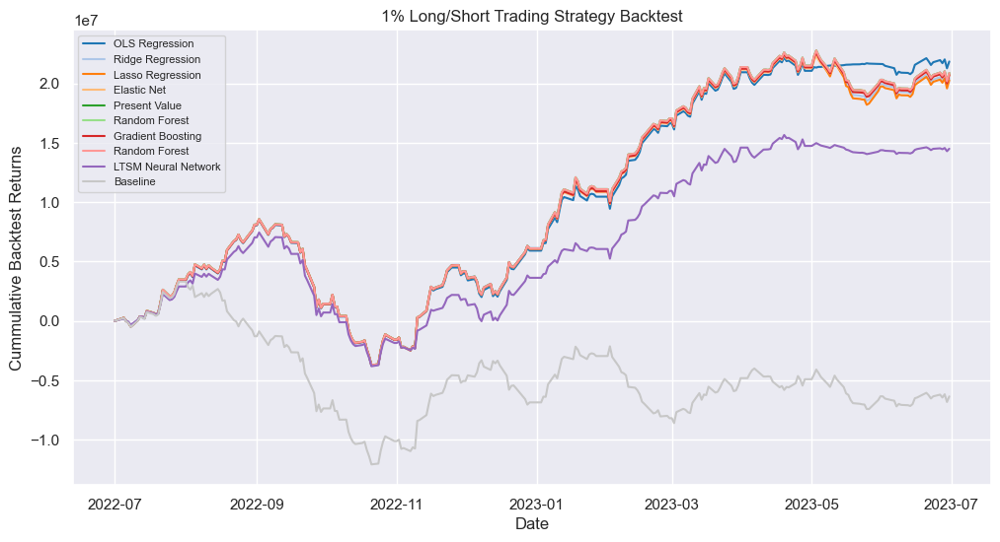

In [320]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_01, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_01, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_01, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_01, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_01, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_01, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_01, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_01, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_01, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("1% Long/Short Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [319]:
strategies_03 = pd.DataFrame({"OLS Regression": backtest_OLS_03,
                             "Ridge Regression": backtest_ridge_03,
                             "Lasso Regression": backtest_ridge_03,
                             "Elastic Net": backtest_elastic_net_03,
                             "Present Value": backtest_PV_03,
                             "Random Forest": backtest_rf_03,
                             "Gradient Boosting": backtest_gb_03,
                             "LTSM Neural Network": backtest_ltsm_03,
                             "Baseline": backtest_baseline})
strategies_03.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,310337.611318,314505.707228,314505.707228,311005.064308,-124575.639146,315149.069564,312047.065316,222895.859946,245939.375586
2022-07-06,38825.413739,53259.504196,53259.504196,43473.718246,-114022.235257,52077.742548,41114.392066,-6523.706195,-23704.454812
2022-07-07,-47347.187013,-15627.013676,-15627.013676,-28902.844590,-103807.405685,-25454.623108,-29890.416646,-71815.201361,-165912.886236
2022-07-08,-406355.776457,-385329.615978,-385329.615978,-393769.363572,-171400.272157,-393513.694450,-391373.725761,-391859.253640,-491266.168391


In [248]:
backtest_summary(strategies_03)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$28,465,493.28",28.47%,9.62%,3.0,9.4,"-$1,949,231.52"
Ridge Regression,"$28,567,606.51",28.57%,10.15%,2.8,8.9,"-$1,915,778.70"
Lasso Regression,"$28,567,606.51",28.57%,10.15%,2.8,8.9,"-$1,915,778.70"
Elastic Net,"$28,575,934.44",28.58%,10.15%,2.8,8.9,"-$1,933,068.76"
Present Value,"$4,366,932.05",4.37%,3.36%,1.3,4.1,"-$557,749.07"
Random Forest,"$29,379,926.25",29.38%,10.14%,2.9,9.2,"-$1,958,588.04"
Gradient Boosting,"$28,916,714.50",28.92%,10.12%,2.9,9.0,"-$1,940,843.04"
LTSM Neural Network,"$20,559,801.94",20.56%,8.29%,2.5,7.8,"-$1,860,387.43"
Recurrent Neural Network,"$2,790,686.93",2.79%,2.35%,1.2,3.8,"-$692,338.10"


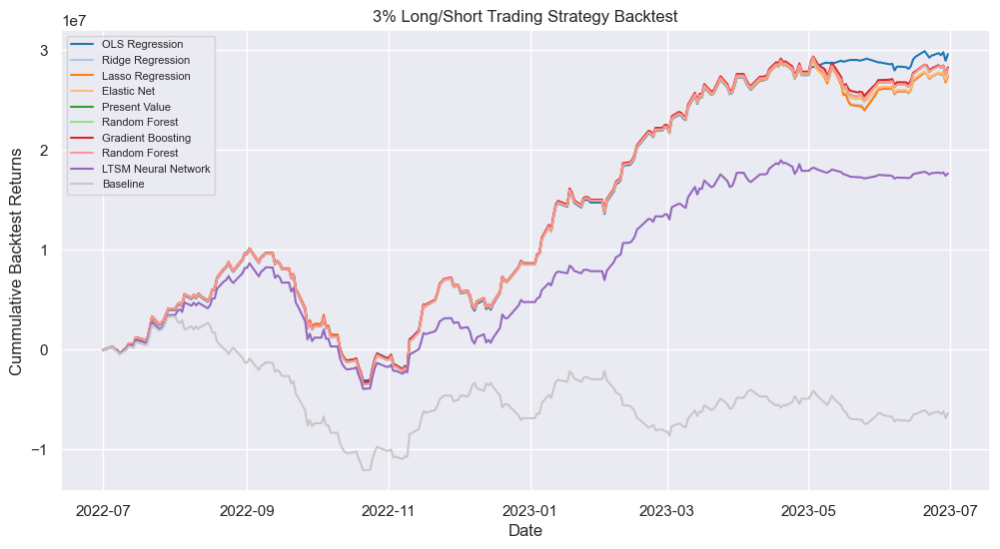

In [321]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_03, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_03, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_03, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_03, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_03, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_03, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_03, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_03, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_03, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("3% Long/Short Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [250]:
strategies_05 = pd.DataFrame({"OLS Regression": backtest_OLS_05,
                             "Ridge Regression": backtest_ridge_05,
                             "Lasso Regression": backtest_ridge_05,
                             "Elastic Net": backtest_elastic_net_05,
                             "Present Value": backtest_PV_05,
                             "Random Forest": backtest_rf_05,
                             "Gradient Boosting": backtest_gb_05,
                             "LTSM Neural Network": backtest_ltsm_05,
                             "Recurrent Neural Network": backtest_rnn_05,
                             "Baseline": backtest_baseline})
strategies_05.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Recurrent Neural Network,Baseline
trd_dt,,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,457650.407393,545418.486190,545418.486190,508455.055953,-72890.804665,533238.780519,515709.429806,456845.065996,110375.956698,288937.418410
2022-07-06,105662.683360,175784.450348,175784.450348,172671.591924,-81891.936924,192216.745158,168256.782164,95688.143410,11174.378411,-42123.980810
2022-07-07,138534.843080,303470.539140,303470.539140,250391.136725,-85213.989834,265117.777285,228133.670697,88667.745619,31028.027672,-130479.594192
2022-07-08,-202648.308366,-50891.182862,-50891.182862,-120337.749211,-213064.845852,-70290.041482,-98267.472060,-186026.386471,-73354.149966,-412659.616023


In [251]:
backtest_summary(strategies_05)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$32,112,660.50",32.11%,10.66%,3.0,9.5,"-$2,328,255.94"
Ridge Regression,"$33,662,353.97",33.66%,11.35%,3.0,9.4,"-$2,357,004.10"
Lasso Regression,"$33,662,353.97",33.66%,11.35%,3.0,9.4,"-$2,357,004.10"
Elastic Net,"$32,533,168.95",32.53%,11.21%,2.9,9.2,"-$2,333,257.68"
Present Value,"$4,229,814.11",4.23%,4.01%,1.1,3.3,"-$734,986.22"
Random Forest,"$35,190,437.48",35.19%,11.45%,3.1,9.7,"-$2,332,711.59"
Gradient Boosting,"$37,172,042.07",37.17%,11.39%,3.3,1e+01,"-$2,611,125.97"
LTSM Neural Network,"$22,466,713.51",22.47%,9.01%,2.5,7.9,"-$2,143,833.00"
Recurrent Neural Network,"$2,781,434.14",2.78%,2.48%,1.1,3.5,"-$730,987.55"


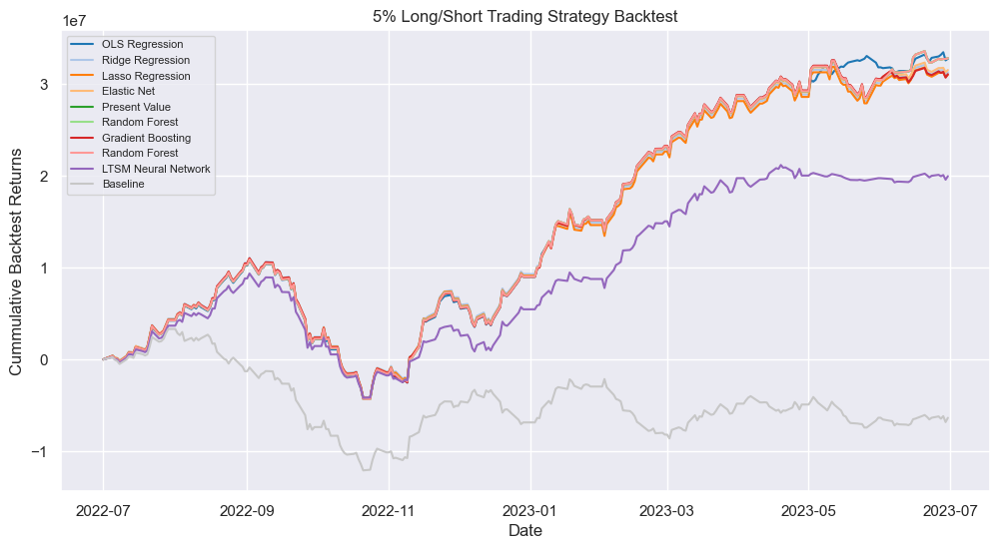

In [322]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_05, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_05, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_05, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_05, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_05, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_05, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_05, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_05, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_05, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("5% Long/Short Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

In [323]:
strategies_10 = pd.DataFrame({"OLS Regression": backtest_OLS_10,
                             "Ridge Regression": backtest_ridge_10,
                             "Lasso Regression": backtest_ridge_10,
                             "Elastic Net": backtest_elastic_net_10,
                             "Present Value": backtest_PV_10,
                             "Random Forest": backtest_rf_10,
                             "Gradient Boosting": backtest_gb_10,
                             "LTSM Neural Network": backtest_ltsm_10,
                             "Baseline": backtest_baseline})
strategies_10.head()

,OLS Regression,Ridge Regression,Lasso Regression,Elastic Net,Present Value,Random Forest,Gradient Boosting,LTSM Neural Network,Baseline
trd_dt,,,,,,,,,
2022-07-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2022-07-05,6991.152661,243832.466040,243832.466040,243832.466040,-38441.303330,435962.222093,243832.466040,292297.398595,245939.375586
2022-07-06,-579761.496536,-327711.969562,-327711.969562,-327711.969562,-212487.430903,-125514.415087,-327711.969562,-82457.576365,-23704.454812
2022-07-07,-564557.352747,-698327.182300,-698327.182300,-698327.182300,-277013.889447,-398877.749767,-698327.182300,-46713.542582,-165912.886236
2022-07-08,-917599.421266,-464974.319803,-464974.319803,-464974.319803,-607699.268680,-324847.728664,-464974.319803,-379162.892823,-491266.168391


In [324]:
backtest_summary(strategies_10)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
OLS Regression,"$17,935,922.21",17.94%,12.03%,1.5,5.2,"-$3,230,901.53"
Ridge Regression,"$23,910,607.97",23.91%,14.50%,1.6,5.7,"-$3,313,711.27"
Lasso Regression,"$23,910,607.97",23.91%,14.50%,1.6,5.7,"-$3,313,711.27"
Elastic Net,"$24,212,344.53",24.21%,14.45%,1.7,5.8,"-$3,323,016.32"
Present Value,"$3,880,822.70",3.88%,6.50%,0.6,2.1,"-$1,621,079.10"
Random Forest,"$22,772,543.39",22.77%,14.52%,1.6,5.4,"-$3,316,976.54"
Gradient Boosting,"$21,922,581.29",21.92%,14.49%,1.5,5.2,"-$3,306,941.87"
LTSM Neural Network,"$23,983,195.91",23.98%,9.43%,2.5,8.8,"-$2,099,147.40"
Baseline,"-$6,352,326.71",-6.35%,8.48%,-0.75,-2.6,"-$1,532,352.59"


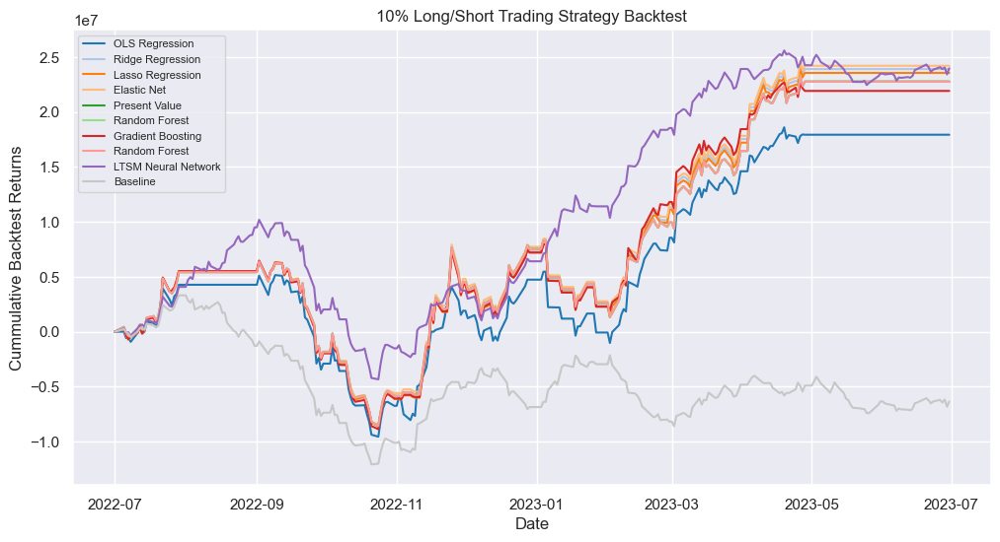

In [325]:
plt.figure(figsize = [12,6])
plt.plot(backtest_OLS_10, label = "OLS Regression", color = c20[0])
plt.plot(backtest_ridge_10, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_10, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_10, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_10, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_10, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_10, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_10, label = "Random Forest", color = c20[7])
plt.plot(backtest_ltsm_10, label = "LTSM Neural Network", color = c20[8])
plt.plot(backtest_baseline, label = "Baseline", color = c20[15])
plt.title("10% Long/Short Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

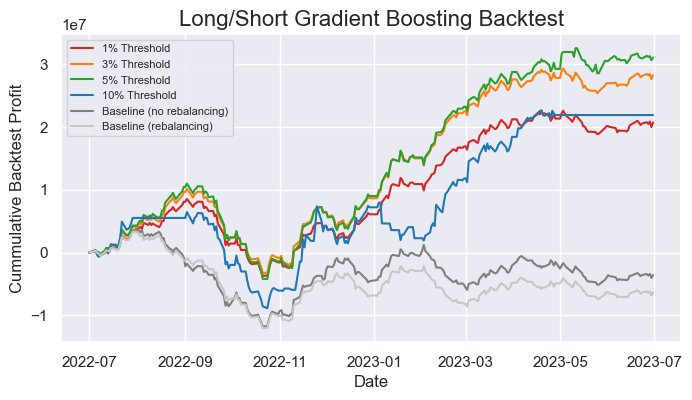

In [326]:
plt.figure(figsize = [8,4])
plt.plot(backtest_gb_01, label = "1% Threshold", color = c10[3])
plt.plot(backtest_gb_03, label = "3% Threshold", color = c10[1])
plt.plot(backtest_gb_05, label = "5% Threshold", color = c10[2])
plt.plot(backtest_gb_10, label = "10% Threshold", color = c10[0])
plt.plot(df_baseline.sum(axis = 1) - 100_000_000, label = "Baseline (no rebalancing)", color = c20[14])
plt.plot(backtest_baseline, label = "Baseline (rebalancing)", color = c20[15])
plt.title("Long/Short Gradient Boosting Backtest", fontsize = 16)
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Profit")
plt.legend(fontsize = 8)
plt.show()

In [327]:
presentation_table1 = pd.DataFrame({"Baseline (rebalancing)": backtest_baseline,
                                   "Baseline (no rebalancing)": df_baseline.sum(axis = 1) - 100_000_000,
                                   "Long Only 1%": backtest_gb_01,
                               "Long Only 3%": backtest_gb_03,
                               "Long Only 5%": backtest_gb_05,
                               "Long Only 10%": backtest_gb_10,
                               })
backtest_summary(presentation_table1)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Baseline (rebalancing),"-$6,352,326.71",-6.35%,8.45%,-0.75,-2.6,"-$1,532,352.59"
Baseline (no rebalancing),"-$3,588,115.11",-3.59%,9.07%,-0.4,-1.4,"-$1,532,884.64"
Long Only 1%,"$20,713,359.10",20.71%,8.45%,2.5,8.5,"-$1,680,429.54"
Long Only 3%,"$28,269,042.60",28.27%,9.56%,3.0,1e+01,"-$1,871,443.93"
Long Only 5%,"$31,048,670.84",31.05%,10.62%,2.9,1e+01,"-$2,218,689.63"
Long Only 10%,"$21,922,581.29",21.92%,14.43%,1.5,5.3,"-$3,306,941.87"


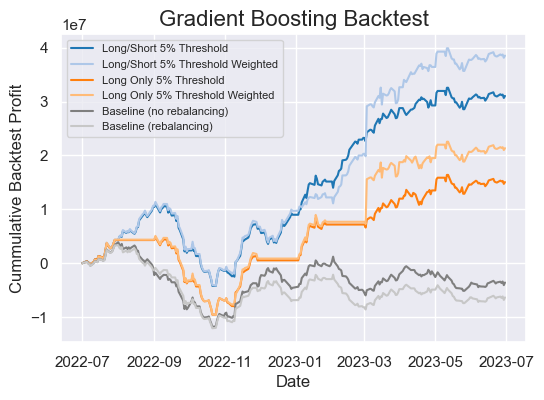

In [328]:
plt.figure(figsize = [6,4])
plt.plot(backtest_gb_05, label = "Long/Short 5% Threshold", color = c20[0])
plt.plot(backtest_gb_05_weighted, label = "Long/Short 5% Threshold Weighted", color = c20[1])
plt.plot(backtest_gb_05_long, label = "Long Only 5% Threshold", color = c20[2])
plt.plot(backtest_gb_05_weighted_long, label = "Long Only 5% Threshold Weighted", color = c20[3])
plt.plot(df_baseline.sum(axis = 1) - 100_000_000, label = "Baseline (no rebalancing)", color = c20[14])
plt.plot(backtest_baseline, label = "Baseline (rebalancing)", color = c20[15])
plt.title("Gradient Boosting Backtest", fontsize = 16)
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Profit")
plt.legend(fontsize = 8)
plt.show()

In [328]:
np.sqrt(12) * 3.3

11.431535329954588

In [326]:
presentation_table = pd.DataFrame({"Baseline (rebalancing)": backtest_baseline,
                                   "Baseline (no rebalancing)": df_baseline.sum(axis = 1) - 100_000_000,
                                   "Long/Short": backtest_gb_05,
                               "Lobg/Short Weighted": backtest_gb_05_weighted,
                               "Long Only": backtest_gb_05_long,
                                "Long Only Weighted": backtest_gb_05_weighted_long,  
                               })
backtest_summary(presentation_table)

,Profit,Annual Return,Annual Std,Annual Sharpe,T-Stat,Max Daily Loss
Prediction Model,,,,,,
Baseline (rebalancing),"-$6,789,855.24",-6.79%,8.96%,-0.76,-2.6,"-$1,580,824.51"
Baseline (no rebalancing),"-$3,513,534.60",-3.51%,9.61%,-0.37,-1.3,"-$1,588,213.14"
Long/Short,"$37,172,042.07",37.17%,11.34%,3.3,1.1e+01,"-$2,611,125.97"
Lobg/Short Weighted,"$37,682,932.88",37.68%,11.45%,3.3,1.1e+01,"-$2,495,640.00"
Long Only,"$17,291,642.95",17.29%,10.73%,1.6,5.6,"-$2,730,883.59"
Long Only Weighted,"$17,604,518.24",17.60%,11.47%,1.5,5.3,"-$4,330,639.00"


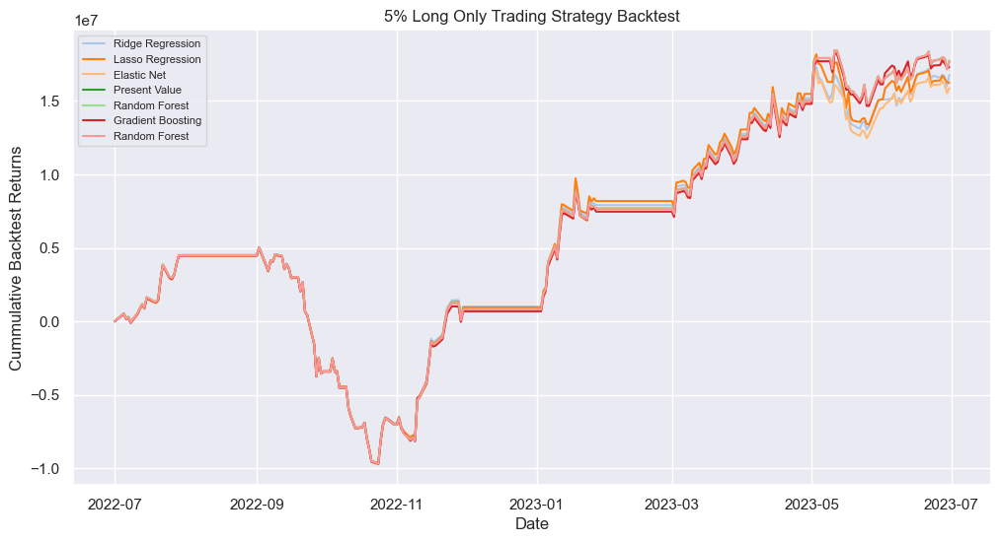

In [260]:
plt.figure(figsize = [12,6])
plt.plot(backtest_ridge_05_long, label = "Ridge Regression", color = c20[1])
plt.plot(backtest_lasso_05_long, label = "Lasso Regression", color = c20[2])
plt.plot(backtest_elastic_net_05_long, label = "Elastic Net", color = c20[3])
plt.plot(backtest_rf_05_long, label = "Present Value", color = c20[4])
plt.plot(backtest_rf_05_long, label = "Random Forest", color = c20[5])
plt.plot(backtest_gb_05_long, label = "Gradient Boosting", color = c20[6])
plt.plot(backtest_rf_05_long, label = "Random Forest", color = c20[7])
plt.title("5% Long Only Trading Strategy Backtest")
plt.xlabel("Date")
plt.ylabel("Cummulative Backtest Returns")
plt.legend(fontsize = 8)
plt.show()

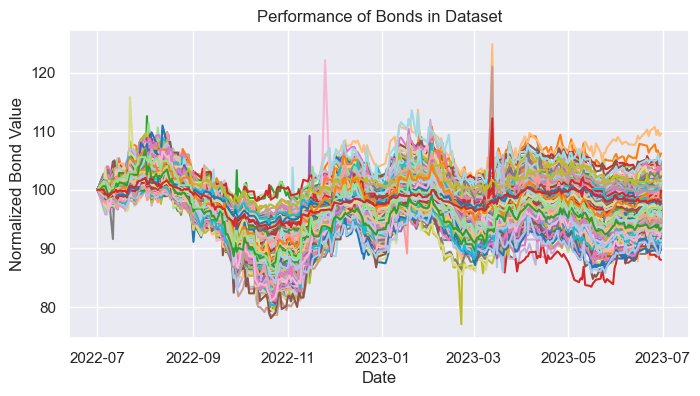

In [389]:
plt.figure(figsize = [8,4])
plt.plot(df_plot/ df_plot.iloc[0] * 100, label = "Ordinary Least Squares (5%)")
plt.title("Performance of Bonds in Dataset")
plt.xlabel("Date")
plt.ylabel("Normalized Bond Value")
plt.show()